In [9]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import pandas as pd
import scienceplots
plt.style.use(['science', 'notebook', 'grid'])

In [10]:
filename = '/user/animesh.sah/DESI_PECVEL/w_theta_grid_covariance.h5'  
f = h5py.File(filename, 'r')

In [11]:
def print_structure(name, obj):
    """Recursively print HDF5 structure"""
    if isinstance(obj, h5py.Group):
        print(f"\n📁 Group: {name}")
    elif isinstance(obj, h5py.Dataset):
        print(f"  📊 Dataset: {name}")
        print(f"      Shape: {obj.shape}")
        print(f"      Dtype: {obj.dtype}")
        print(f"      Size: {obj.size * obj.dtype.itemsize / 1e6:.2f} MB")

f.visititems(print_structure)


📁 Group: grid_data
  📊 Dataset: grid_data/cov
      Shape: (51, 51, 51, 50, 50)
      Dtype: float32
      Size: 1326.51 MB
  📊 Dataset: grid_data/n_bins
      Shape: (51, 51, 51)
      Dtype: int16
      Size: 0.27 MB
  📊 Dataset: grid_data/n_objects
      Shape: (51, 51, 51)
      Dtype: int32
      Size: 0.53 MB
  📊 Dataset: grid_data/theta_bins
      Shape: (51, 51, 51, 50)
      Dtype: float32
      Size: 26.53 MB
  📊 Dataset: grid_data/valid_mask
      Shape: (51, 51, 51)
      Dtype: bool
      Size: 0.13 MB
  📊 Dataset: grid_data/varxi
      Shape: (51, 51, 51, 50)
      Dtype: float32
      Size: 26.53 MB
  📊 Dataset: grid_data/w_theta
      Shape: (51, 51, 51, 50)
      Dtype: float32
      Size: 26.53 MB

📁 Group: metadata
  📊 Dataset: metadata/grid_values
      Shape: (51,)
      Dtype: float64
      Size: 0.00 MB
  📊 Dataset: metadata/reference_theta_bins
      Shape: (50,)
      Dtype: float64
      Size: 0.00 MB
  📊 Dataset: metadata/reference_w_theta
      Shape: (50,)

In [12]:
print('Creation date of the structure: ',f['metadata'].attrs['creation_date']) 


Creation date of the structure:  2026-03-18T05:59:21


In [13]:
#G=-0.1433, R=-0.1033, Z=0.2500

In [14]:
# a =np.linspace(grid_values[0], grid_values[-1], 76)
# from itertools import product
# points = list(product(a, repeat=3)) 

In [15]:
grid_values = f['metadata/grid_values'][:]
reference_theta_bins = f['metadata/reference_theta_bins'][:]
reference_w_theta = f['metadata/reference_w_theta'][:]
n_objects = f['grid_data/n_objects'][:]
print(f"Grid values: {len(grid_values)} points")
print(f"Range: [{grid_values.min():.4f}, {grid_values.max():.4f}]")
print(f"Grid values: {grid_values}")
print(f"\nReference theta bins: {len(reference_theta_bins)} bins")
print(f"Theta range: [{reference_theta_bins.min():.4f}, {reference_theta_bins.max():.4f}] degrees")


Grid values: 51 points
Range: [-0.2500, 0.2500]
Grid values: [ 0.25  0.24  0.23  0.22  0.21  0.2   0.19  0.18  0.17  0.16  0.15  0.14
  0.13  0.12  0.11  0.1   0.09  0.08  0.07  0.06  0.05  0.04  0.03  0.02
  0.01  0.   -0.01 -0.02 -0.03 -0.04 -0.05 -0.06 -0.07 -0.08 -0.09 -0.1
 -0.11 -0.12 -0.13 -0.14 -0.15 -0.16 -0.17 -0.18 -0.19 -0.2  -0.21 -0.22
 -0.23 -0.24 -0.25]

Reference theta bins: 50 bins
Theta range: [0.0108, 14.0456] degrees


In [16]:
if 'w_theta' not in f['grid_data']:
    print("w_theta missing or corrupted, re-running calculation")


In [17]:
dset = f['grid_data/w_theta']
print(dset.shape, dset.dtype, dset.compression, dset.chunks)
for i in range(5):
    try:
        print(f"Reading slice {i}")
        _ = dset[i]
    except Exception as e:
        print(f"Slice {i} failed:", e)


(51, 51, 51, 50) float32 gzip (7, 13, 13, 13)
Reading slice 0
Reading slice 1
Reading slice 2
Reading slice 3
Reading slice 4


In [18]:
for key in f['metadata'].attrs.keys():
    print(f"  {key}: {f['metadata'].attrs[key]}")
theta_bins_array = f['grid_data/theta_bins'][:]
w_theta_array = f['grid_data/w_theta'][:]
n_objects_array = f['grid_data/n_objects'][:]
valid_mask = f['grid_data/valid_mask'][:]
n_bins_array = f['grid_data/n_bins'][:]

  creation_date: 2026-03-18T05:59:21
  dimensions: 3
  n_points: 51


In [19]:
i_example, j_example,k_example = len(grid_values) // 4, len(grid_values) // 2 , len(grid_values)//3
#i_example, j_example,k_example = 0,0,0

zp_G_example = grid_values[i_example]
zp_R_example = grid_values[j_example]
zp_Z_example = grid_values[k_example]
print(f"Grid point ({i_example}, {j_example},{k_example})")
print(f"ZP_G = {zp_G_example:.4f}, ZP_R = {zp_R_example:.4f}, zp_Z =  {zp_Z_example:.4f} ")
print(f"N objects: {n_objects_array[i_example, j_example,k_example]}")
print(f"N bins: {n_bins_array[i_example, j_example,k_example]}")
print(f"Valid: {valid_mask[i_example, j_example,k_example]}")

Grid point (12, 25,17)
ZP_G = 0.1300, ZP_R = 0.0000, zp_Z =  0.0800 
N objects: 4909
N bins: 50
Valid: True


In [20]:
if valid_mask[i_example, j_example,k_example]:
    n_bins = n_bins_array[i_example, j_example,k_example]
    theta_bins = theta_bins_array[i_example, j_example, k_example, :n_bins]
    w_theta = w_theta_array[i_example, j_example, k_example, :n_bins]
    print(f"Theta bins: {theta_bins[:5]} ... {theta_bins[-3:]}")
    print(f"W_theta: {w_theta[:5]} ... {w_theta[-3:]}")

Theta bins: [0.01078751 0.01248657 0.01445323 0.01672965 0.0193646 ] ... [10.433908 12.077272 13.979469]
W_theta: [38.561867 24.60772  35.477444 12.97813   9.60596 ] ... [0.11488087 0.08573629 0.07759062]


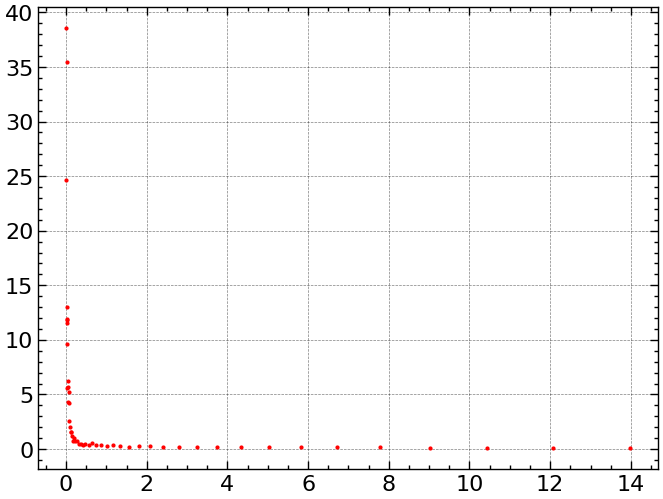

In [21]:
plt.plot(theta_bins, w_theta, 'r.', markersize=4, 
             label=f'Grid point: ZP_G={zp_G_example:.3f}, ZP_R={zp_R_example:.3f}')

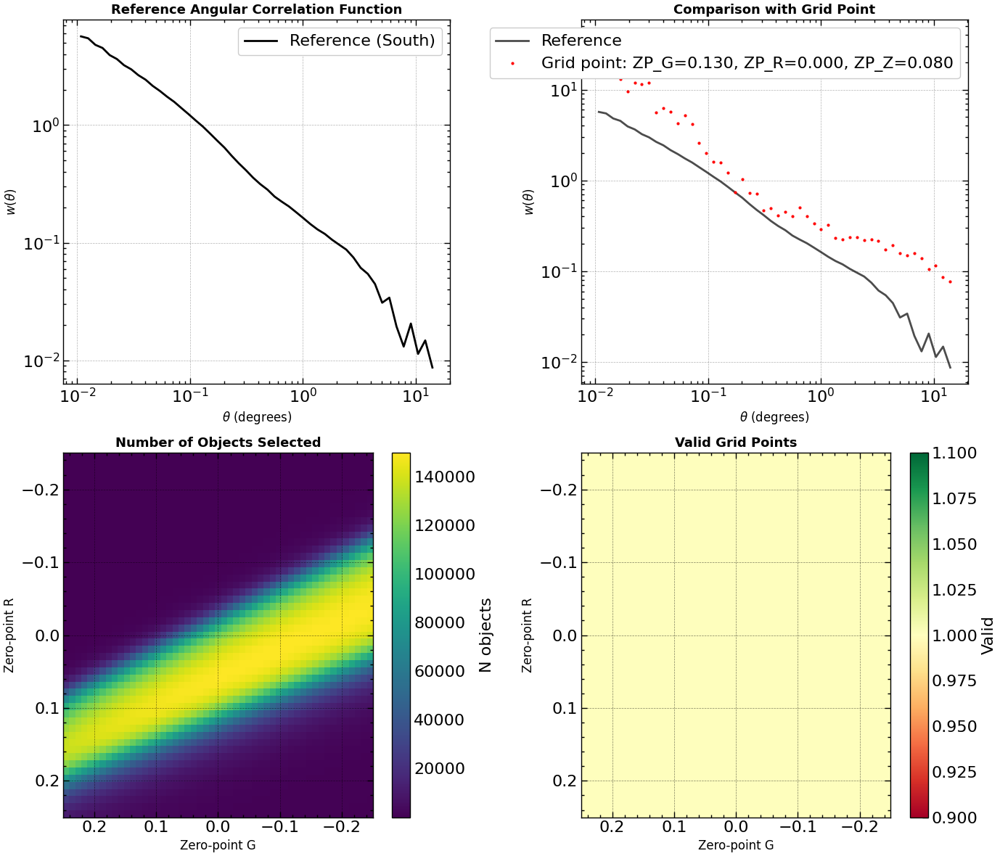

In [22]:
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Plot 1: Reference w_theta
ax = axes[0, 0]
ax.loglog(reference_theta_bins, reference_w_theta, 'k-', linewidth=2, label='Reference (South)')
ax.set_xlabel(r'$\theta$ (degrees)', fontsize=12)
ax.set_ylabel(r'$w(\theta)$', fontsize=12)
ax.set_title('Reference Angular Correlation Function', fontsize=13, fontweight='bold')
ax.grid(True, alpha=0.3, linestyle='--')
ax.legend()
# Plot 2: Compare reference with example grid point
ax = axes[0, 1]
ax.loglog(reference_theta_bins, reference_w_theta, 'k-', linewidth=2, label='Reference', alpha=0.7)
if valid_mask[i_example, j_example,k_example]:
    n_bins = n_bins_array[i_example, j_example,k_example]
    theta_bins = theta_bins_array[i_example, j_example, k_example, :n_bins]
    w_theta = w_theta_array[i_example, j_example, k_example, :n_bins]
    ax.loglog(theta_bins, w_theta, 'r.', markersize=4, 
             label=f'Grid point: ZP_G={zp_G_example:.3f}, ZP_R={zp_R_example:.3f}, ZP_Z={zp_Z_example:.3f}')
ax.set_xlabel(r'$\theta$ (degrees)', fontsize=12)
ax.set_ylabel(r'$w(\theta)$', fontsize=12)
ax.set_title('Comparison with Grid Point', fontsize=13, fontweight='bold')
ax.grid(True, alpha=0.3, linestyle='--')
ax.legend()

# Plot 3: N objects heatmap
ax = axes[1, 0]
im = ax.imshow(n_objects_array[:, :, k_example].T, origin='lower', aspect='auto', cmap='viridis',
               extent=[grid_values[0], grid_values[-1], grid_values[0], grid_values[-1]])
ax.set_xlabel('Zero-point G', fontsize=12)
ax.set_ylabel('Zero-point R', fontsize=12)
ax.set_title('Number of Objects Selected', fontsize=13, fontweight='bold')
plt.colorbar(im, ax=ax, label='N objects')

# Plot 4: Valid points mask
ax = axes[1, 1]
im = ax.imshow(valid_mask[:, :, k_example].T, origin='lower', aspect='auto', cmap='RdYlGn',
               extent=[grid_values[0], grid_values[-1], grid_values[0], grid_values[-1]])
ax.set_xlabel('Zero-point G', fontsize=12)
ax.set_ylabel('Zero-point R', fontsize=12)
ax.set_title('Valid Grid Points', fontsize=13, fontweight='bold')
plt.colorbar(im, ax=ax, label='Valid')
plt.tight_layout()

In [23]:
#w_ref_backup = np.load('/user/animesh.sah/w_theta_results/treecorr_south_bootstrap_patches_50_1000_1000_0.01_to_10_w_True_partial_percentile.npy')
w_ref_backup = np.load('/user/animesh.sah/w_theta_results/treecorr_south_bootstrap_patches_50_1000_1000_0.01_to_15_w_True_partial_percentile.npy')
w_north_backup = np.load('/user/animesh.sah/w_theta_results/treecorr_north_bootstrap_patches_50_1000_1000_0.01_to_15_w_True_partial_percentile.npy')
cov_south = np.load('/user/animesh.sah/w_theta_results/treecorr_south_jackknife_patches_50_0.01_to_15_w_True_partial_percentile_covariance.npy')
# plt.errorbar(w_ref_backup[0], w_ref_backup[1], yerr=w_ref_backup[2], fmt='k',ls='None', label='Reference South')
w_ref_backup = np.load('/user/animesh.sah/w_theta_results/treecorr_south_bootstrap_patches_30_1000_1000_0.01_to_15_w_True_partial_percentile.npy')
# plt.errorbar(w_ref_backup[0], w_ref_backup[1], yerr=w_ref_backup[2], fmt='b',ls='None', label='Reference North',alpha=0.3)
# plt.xscale('log')
# plt.yscale('log')

In [24]:
def calculate_chi_square(w_theta_grid, w_theta_ref, theta_bins_grid, theta_bins_ref,cov = 1):
    """
    Calculate chi-square between grid w_theta and reference w_theta
    by interpolating to match theta bins
    """
    # Interpolate grid w_theta to reference theta bins
    w_theta_interp = np.interp(theta_bins_ref, theta_bins_grid, w_theta_grid)
    
    # Calculate chi-square (assuming Poisson errors proportional to w_theta)
    # Using reference w_theta as the uncertainty estimate
    if len(cov.shape) > 1: 
        inv_cov = np.linalg.inv(cov)
        chi_square = (w_theta_interp - w_theta_ref).T @ inv_cov @ (w_theta_interp - w_theta_ref)
    else:   
        chi_square = np.sum((w_theta_grid - w_theta_ref)**2 / (cov**2))
    
    return chi_square

def calculate_chi_square_num_objects(n_objects, n_objects_ref=337336, area_north=5167.3 ,area_south=12213.4):
    """
    Calculate chi-square for number of objects based on density difference
    """
    density_model = n_objects / area_north
    density_ref = n_objects_ref / area_south
    sigma_n = np.sqrt(n_objects_ref) / area_south   # treat reference as the noisy data

    chi_density = np.sum((density_model - density_ref)**2 / sigma_n**2)
    
    return chi_density

def calculate_chi_square_area(w_theta_grid, w_theta_ref, theta_bins_grid, theta_bins_ref,n_objects,n_objects_ref=337336,cov= 1,area_north=5167.3 ,area_south=12213.4,lambda_ =0.0):
    """
    Calculate chi-square between grid w_theta and reference w_theta
    by interpolating to match theta bins
    """
    # Interpolate grid w_theta to reference theta bins
    #w_theta_interp = np.interp(theta_bins_ref, theta_bins_grid, w_theta_grid)
    
    # Calculate chi-square (assuming Poisson errors proportional to w_theta)
    # Using reference w_theta as the uncertainty estimate
    if len(cov.shape) > 1: 
        inv_cov = np.linalg.inv(cov)
        chi_square = (w_theta_grid - w_theta_ref).T @ inv_cov @ (w_theta_grid - w_theta_ref)
    else:
        chi_square = np.sum((w_theta_grid - w_theta_ref)**2 / (cov**2))
    density_model = n_objects / area_north
    density_ref = n_objects_ref/ area_south
    sigma_n = np.sqrt(n_objects_ref) / area_south   # treat reference as the noisy data

    chi_density = np.sum((density_model - density_ref)**2 / sigma_n**2)
    
    return chi_square + lambda_ * chi_density

# Calculate chi-square for all valid grid points
chi_square_grid = np.full((len(grid_values), len(grid_values), len(grid_values)), np.inf)

for i in range(len(grid_values)):
    for j in range(len(grid_values)):
        for k in range(len(grid_values)):
            if valid_mask[i, j, k]:
                n_bins = n_bins_array[i, j, k]
                theta_bins = theta_bins_array[i, j, k, :n_bins]
                w_theta = w_theta_array[i, j, k, :n_bins]
                
                chi_square_grid[i, j, k] = calculate_chi_square(
                    w_theta, w_ref_backup[1], theta_bins, w_ref_backup[0],w_ref_backup[-1]
                )

print(f"Chi-square grid shape: {chi_square_grid.shape}")
print(f"Min chi-square: {np.min(chi_square_grid[valid_mask]):.2f}")
print(f"Max chi-square: {np.max(chi_square_grid[valid_mask]):.2f}")

# Find best-fit grid point
best_idx = np.unravel_index(np.argmin(chi_square_grid), chi_square_grid.shape)
print(f"\nBest-fit grid point: ({best_idx[0]}, {best_idx[1]}, {best_idx[2]})")
print(f"ZP_G = {grid_values[best_idx[0]]:.4f}, ZP_R = {grid_values[best_idx[1]]:.4f}, ZP_Z = {grid_values[best_idx[2]]:.4f}")
print(f"Chi-square = {chi_square_grid[best_idx]:.2f}")
area_north=5167.3 
area_south=12213.4
n_objects_ref=337336

Chi-square grid shape: (51, 51, 51)
Min chi-square: 30.76
Max chi-square: 8784147263.52

Best-fit grid point: (27, 35, 46)
ZP_G = -0.0200, ZP_R = -0.1000, ZP_Z = -0.2100
Chi-square = 30.76


In [25]:
chi_square_grid = np.full((len(grid_values), len(grid_values), len(grid_values)), np.inf)

for i in range(len(grid_values)):
    for j in range(len(grid_values)):
        for k in range(len(grid_values)):
            if valid_mask[i, j, k]:
                n_bins = n_bins_array[i, j, k]
                theta_bins = theta_bins_array[i, j, k, :n_bins]
                w_theta = w_theta_array[i, j, k, :n_bins]
                
                chi_square_grid[i, j, k] = calculate_chi_square(
                    w_theta, w_ref_backup[1], theta_bins, w_ref_backup[0],w_ref_backup[-1]
                )

print(f"Chi-square grid shape: {chi_square_grid.shape}")
print(f"Min chi-square: {np.min(chi_square_grid[valid_mask]):.2f}")
print(f"Max chi-square: {np.max(chi_square_grid[valid_mask]):.2f}")

# Find best-fit grid point
best_idx = np.unravel_index(np.argmin(chi_square_grid), chi_square_grid.shape)
print(f"\nBest-fit grid point: ({best_idx[0]}, {best_idx[1]}, {best_idx[2]})")
print(f"ZP_G = {grid_values[best_idx[0]]:.4f}, ZP_R = {grid_values[best_idx[1]]:.4f}, ZP_Z = {grid_values[best_idx[2]]:.4f}")
print(f"Chi-square = {chi_square_grid[best_idx]:.2f}")

Chi-square grid shape: (51, 51, 51)
Min chi-square: 30.76
Max chi-square: 8784147263.52

Best-fit grid point: (27, 35, 46)
ZP_G = -0.0200, ZP_R = -0.1000, ZP_Z = -0.2100
Chi-square = 30.76


In [26]:
def calculate_chi_square_area_wrapper(lambda_):
    for i in range(len(grid_values)):
        for j in range(len(grid_values)):
            for k in range(len(grid_values)):
                if valid_mask[i, j, k]:
                    n_bins = n_bins_array[i, j, k]
                    theta_bins = theta_bins_array[i, j, k, :n_bins]
                    w_theta = w_theta_array[i, j, k, :n_bins]
                    
                    chi_square_grid_area[i, j, k] = calculate_chi_square_area(
                        w_theta, w_ref_backup[1], theta_bins, w_ref_backup[0], cov=w_ref_backup[-1],n_objects=n_objects_array[i, j, k], lambda_=lambda_
                    )
    return chi_square_grid_area
for lambda_ in [ 0,0.005,0.01,0.05,0.1,1]:
    print('=' * 50)
    chi_square_grid_area = np.full((len(grid_values), len(grid_values), len(grid_values)), np.inf)

    print(f"\nCalculating chi-square grid with lambda = {lambda_}")
    chi_square_grid_area = calculate_chi_square_area_wrapper(lambda_)

    #print(f"Chi-square grid shape: {chi_square_grid.shape}")
    print(f"Min chi-square: {np.min(chi_square_grid_area[valid_mask]):.2f}, Max chi-square: {np.max(chi_square_grid_area[valid_mask]):.2f}")

    # Find best-fit grid point
    best_idx = np.unravel_index(np.argmin(chi_square_grid_area), chi_square_grid_area.shape)
    print(f"\nBest-fit grid point: ({best_idx[0]}, {best_idx[1]}, {best_idx[2]})")
    print(f"ZP_G = {grid_values[best_idx[0]]:.4f}, ZP_R = {grid_values[best_idx[1]]:.4f}, ZP_Z = {grid_values[best_idx[2]]:.4f}")
    print(f"Chi-square = {chi_square_grid_area[best_idx]:.2f}")
    print(f'Number of objects at best fit: {n_objects_array[best_idx]}')
    print(f'Density at best fit: {n_objects_array[best_idx]/area_north} vs the reference density {n_objects_ref/area_south}')


Calculating chi-square grid with lambda = 0
Min chi-square: 30.76, Max chi-square: 8784147263.52

Best-fit grid point: (27, 35, 46)
ZP_G = -0.0200, ZP_R = -0.1000, ZP_Z = -0.2100
Chi-square = 30.76
Number of objects at best fit: 104798
Density at best fit: 20.28099781317129 vs the reference density 27.62015491181817

Calculating chi-square grid with lambda = 0.005
Min chi-square: 104.28, Max chi-square: 8784148949.75

Best-fit grid point: (1, 10, 21)
ZP_G = 0.2400, ZP_R = 0.1500, ZP_Z = 0.0400
Chi-square = 104.28
Number of objects at best fit: 119819
Density at best fit: 23.187931801908153 vs the reference density 27.62015491181817

Calculating chi-square grid with lambda = 0.01
Min chi-square: 139.57, Max chi-square: 8784150635.98

Best-fit grid point: (0, 11, 22)
ZP_G = 0.2500, ZP_R = 0.1400, ZP_Z = 0.0300
Chi-square = 139.57
Number of objects at best fit: 124575
Density at best fit: 24.108335107309426 vs the reference density 27.62015491181817

Calculating chi-square grid with lamb


Calculating chi-square grid with lambda = 0
Min chi-square: 30.76, Max chi-square: 8784147263.52


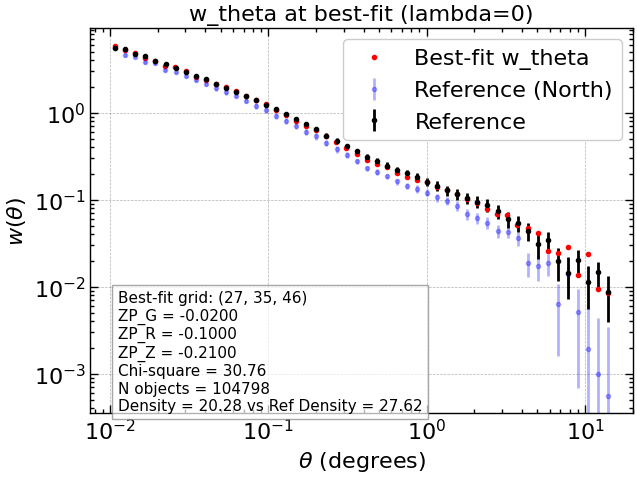


Calculating chi-square grid with lambda = 0.001
Min chi-square: 54.14, Max chi-square: 8784147600.77


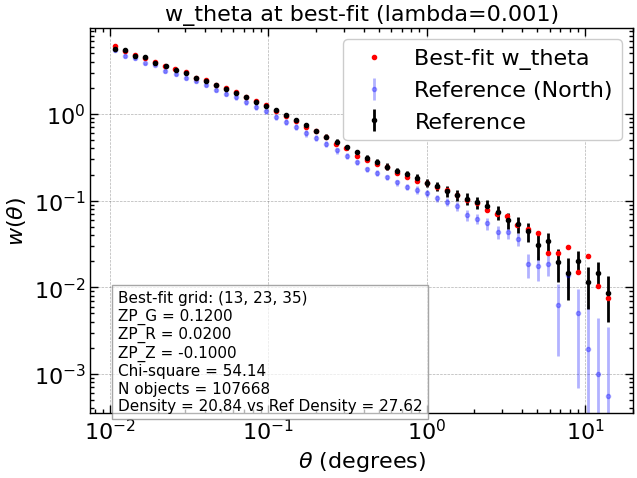


Calculating chi-square grid with lambda = 0.01
Min chi-square: 139.57, Max chi-square: 8784150635.98


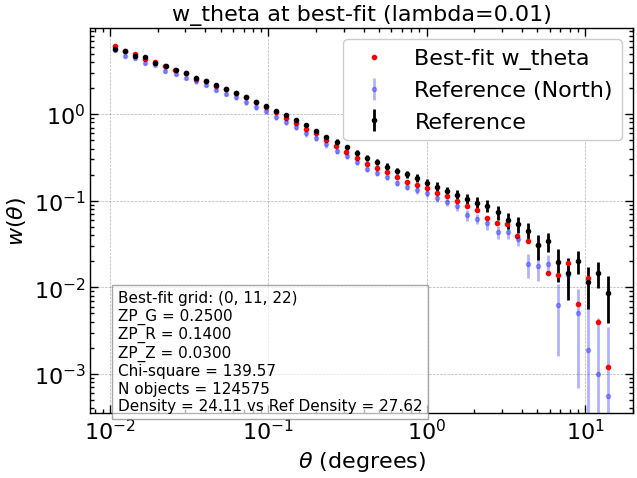


Calculating chi-square grid with lambda = 0.05
Min chi-square: 193.80, Max chi-square: 8784164125.83


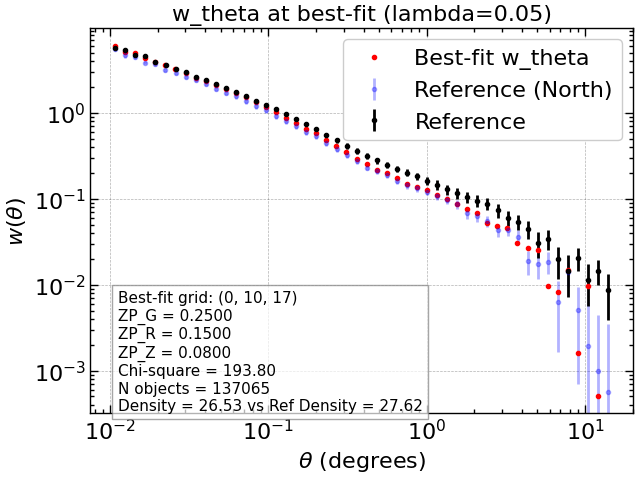


Calculating chi-square grid with lambda = 0.1
Min chi-square: 209.05, Max chi-square: 8784180988.14


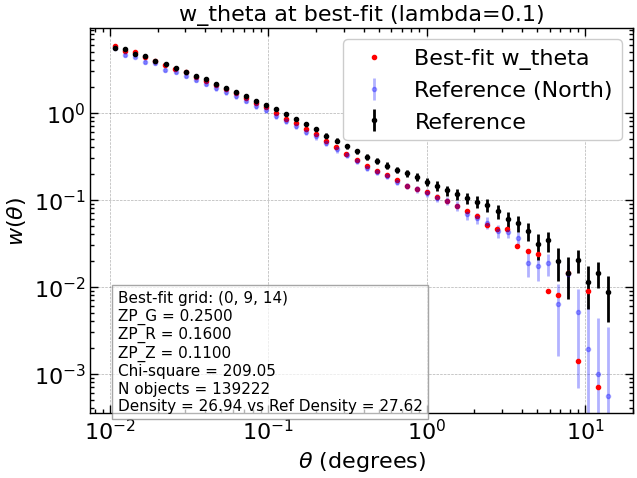


Calculating chi-square grid with lambda = 1
Min chi-square: 227.52, Max chi-square: 8784484509.71


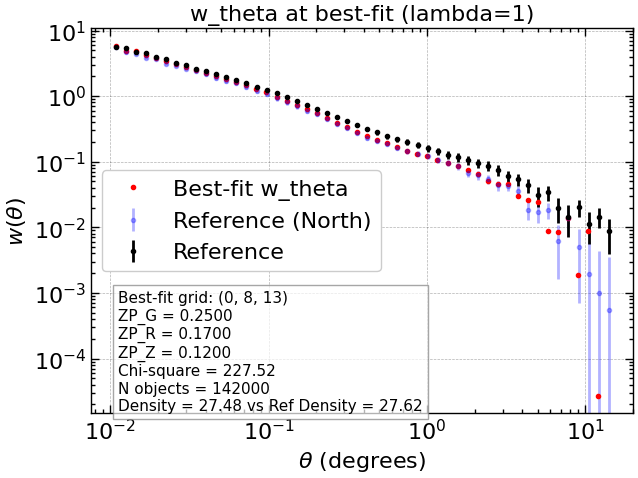


Calculating chi-square grid with lambda = 10
Min chi-square: 228.47, Max chi-square: 8787519725.42


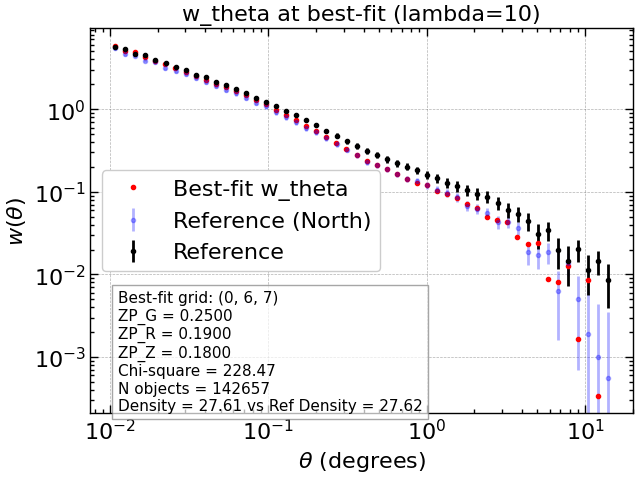


Calculating chi-square grid with lambda = 100000.0
Min chi-square: 351.64, Max chi-square: 42508766203.64


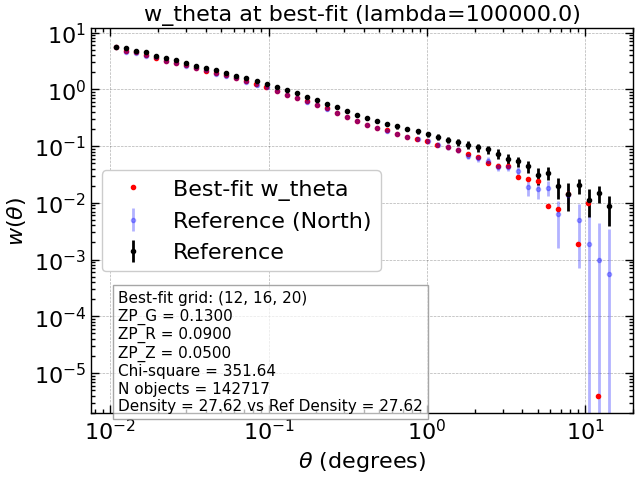

In [30]:
lambda_array = [0, 0.001, 0.01, 0.05, 0.1, 1,10,1e5]
for lambda_ in lambda_array:
    print('=' * 50)
    chi_square_grid_area = np.full((len(grid_values), len(grid_values), len(grid_values)), np.inf)

    print(f"\nCalculating chi-square grid with lambda = {lambda_}")
    chi_square_grid_area = calculate_chi_square_area_wrapper(lambda_)

    print(f"Min chi-square: {np.min(chi_square_grid_area[valid_mask]):.2f}, Max chi-square: {np.max(chi_square_grid_area[valid_mask]):.2f}")

    # Find best-fit grid point
    best_idx = np.unravel_index(np.argmin(chi_square_grid_area), chi_square_grid_area.shape)
    # print(f"\nBest-fit grid point: ({best_idx[0]}, {best_idx[1]}, {best_idx[2]})")
    # print(f"ZP_G = {grid_values[best_idx[0]]:.4f}, ZP_R = {grid_values[best_idx[1]]:.4f}, ZP_Z = {grid_values[best_idx[2]]:.4f}")
    # print(f"Chi-square = {chi_square_grid_area[best_idx]:.2f}")
    # print(f'Number of objects at best fit: {n_objects_array[best_idx]}')

    # Prepare statistics text
    stats_text = (
        f"Best-fit grid: ({best_idx[0]}, {best_idx[1]}, {best_idx[2]})\n"
        f"ZP_G = {grid_values[best_idx[0]]:.4f}\n"
        f"ZP_R = {grid_values[best_idx[1]]:.4f}\n"
        f"ZP_Z = {grid_values[best_idx[2]]:.4f}\n"
        f"Chi-square = {chi_square_grid_area[best_idx]:.2f}\n"
        f"N objects = {n_objects_array[best_idx]}\n"
        f"Density = {n_objects_array[best_idx]/area_north:.2f} vs Ref Density = {n_objects_ref/area_south:.2f}"
    )

    # Plot w_theta at best-fit
    n_bins = n_bins_array[best_idx]
    theta_bins = theta_bins_array[best_idx[0], best_idx[1], best_idx[2], :n_bins]
    w_theta = w_theta_array[best_idx[0], best_idx[1], best_idx[2], :n_bins]

    plt.figure(figsize=(7, 5))
    plt.errorbar(w_north_backup[0], w_north_backup[1], yerr=w_north_backup[-1], fmt= 'b.',alpha=0.3,ls='None', label='Reference (North)')
    plt.errorbar(w_ref_backup[0], w_ref_backup[1], yerr=w_ref_backup[-1], fmt= 'k.',ls='None', label='Reference')
    plt.loglog(theta_bins, w_theta, 'r.', label='Best-fit w_theta')
    plt.xlabel(r'$\theta$ (degrees)')
    plt.ylabel(r'$w(\theta)$')
    plt.title(f'w_theta at best-fit (lambda={lambda_})')
    plt.legend()
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.gca().text(
        0.05, 0.32, stats_text, transform=plt.gca().transAxes,
        fontsize=11, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray')
    )
    plt.show()

    # Plot w_theta at best-fit
    # n_bins = n_bins_array[best_idx]
    # theta_bins = theta_bins_array[best_idx[0], best_idx[1], best_idx[2], :n_bins]
    # w_theta = w_theta_array[best_idx[0], best_idx[1], best_idx[2], :n_bins]

    # plt.figure(figsize=(7, 5))
    # plt.loglog(reference_theta_bins, reference_w_theta, 'k-', label='Reference')
    # plt.loglog(theta_bins, w_theta, 'r.', label='Best-fit w_theta')
    # plt.xlabel(r'$\theta$ (degrees)')
    # plt.ylabel(r'$w(\theta)$')
    # plt.title(f'w_theta at best-fit (lambda={lambda_})')
    # plt.legend()
    # plt.grid(True, alpha=0.3, linestyle='--')
    # plt.show()

In [28]:
chi_square_grid_lambda = np.full((len(grid_values), len(grid_values), len(grid_values)), np.inf)
chi_square_grid_lambda = calculate_chi_square_area_wrapper(0.005)

chi_square_lambda={}

for lambda_ in lambda_array:
    chi_square_grid_area = np.full((len(grid_values), len(grid_values), len(grid_values)), np.inf)

    print(f"\nCalculating chi-square grid with lambda = {lambda_}")
    chi_square_grid_area = calculate_chi_square_area_wrapper(lambda_)

    # Find best-fit grid point
    best_idx = np.unravel_index(np.argmin(chi_square_grid_area), chi_square_grid_area.shape)
    chi_square_lambda[lambda_] = {
        'chi_square_grid': chi_square_grid_area,
        'best_idx': best_idx,
        'ZP_G': grid_values[best_idx[0]],
        'ZP_R': grid_values[best_idx[1]],
        'ZP_Z': grid_values[best_idx[2]],
        'Chi-square': chi_square_grid_area[best_idx],
        'N_objects': n_objects_array[best_idx]
    }


Calculating chi-square grid with lambda = 0

Calculating chi-square grid with lambda = 0.001

Calculating chi-square grid with lambda = 0.01

Calculating chi-square grid with lambda = 0.05

Calculating chi-square grid with lambda = 0.1

Calculating chi-square grid with lambda = 1

Calculating chi-square grid with lambda = 10

Calculating chi-square grid with lambda = 100000.0


In [ ]:
chi_square_lambda[0].keys()

dict_keys(['chi_square_grid', 'best_idx', 'ZP_G', 'ZP_R', 'ZP_Z', 'Chi-square', 'N_objects'])

NameError: name 'lambda_array_subset' is not defined

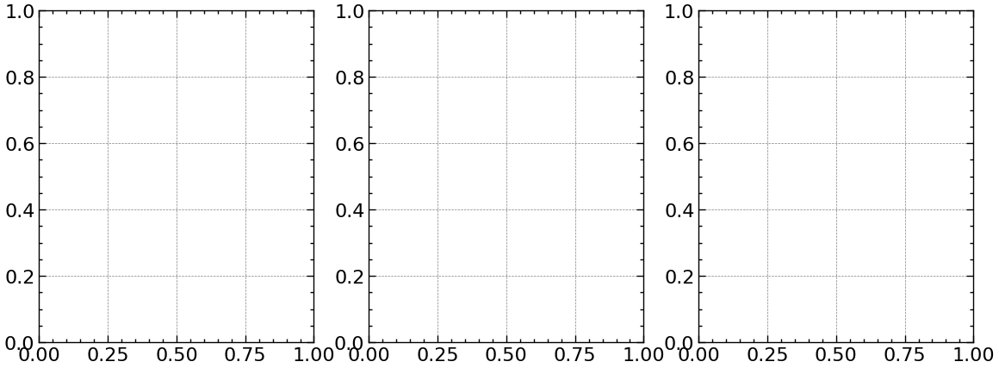

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

chi = chi_square_grid - np.nanmin(chi_square_grid)
grid = grid_values
lists = [[0,100,200,300,400,500],[0,200,400,600,800,1000],[0,1e3,1e4,1e5,1e6,1e7]]
for k in range(len(grid)):
    fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(14, 5))
    axes = [ax1, ax2, ax3]
    for ix in range(3):
        chi = chi_square_lambda[lambda_array_subset[ix]]['chi_square_grid'] - np.nanmin(chi_square_lambda[lambda_array_subset[ix]]['chi_square_grid'])
        slice_2d = chi[:, :, k]
        slice_2d_clean = np.where(np.isinf(slice_2d), np.nan, slice_2d)
        
        # Find 5 minimum chi-square values in this slice
        valid_indices = np.where(~np.isnan(slice_2d_clean) & ~np.isinf(slice_2d_clean))
        if len(valid_indices[0]) > 0:
            valid_chi = slice_2d_clean[valid_indices]
            n_min = min(5, len(valid_chi))
            min_indices = np.argpartition(valid_chi, n_min-1)[:n_min]
            
            min_i = valid_indices[0][min_indices]
            min_j = valid_indices[1][min_indices]
            min_chi_values = valid_chi[min_indices]
            
            # Sort by chi-square value
            sort_order = np.argsort(min_chi_values)
            min_i = min_i[sort_order]
            min_j = min_j[sort_order]
            min_chi_values = min_chi_values[sort_order]
        
        # Create figure with two subplots
        
        # Left subplot: Contour plot
        X, Y = np.meshgrid(grid, grid, indexing='ij')
        cs = axes[ix].contourf(X, Y, slice_2d_clean, levels=lists[ix], cmap='YlGnBu')
        plt.colorbar(cs, ax=axes[ix], label='Δχ²')
        
        # Plot minimum points on contour
        if len(valid_indices[0]) > 0:
            for idx, (i, j, chi_val) in enumerate(zip(min_i, min_j, min_chi_values)):
                axes[ix].scatter(grid[i], grid[j], c='red', s=100, marker='*', 
                        edgecolors='black', linewidths=1.5, zorder=10)
                axes[ix].text(grid[i], grid[j], f'{idx+1}', fontsize=8, ha='center', 
                        va='center', color='white', fontweight='bold')
        
        axes[ix].set_title(f"Δχ² contour at ZP_Z = {grid[k]:.4f}")
        axes[ix].set_xlabel("ZP_G")
        axes[ix].set_ylabel("ZP_R")
    
    # Right subplot: w_theta plots
    # ax2.loglog(reference_theta_bins, reference_w_theta, 'k-', linewidth=2, 
    #           label='Reference', alpha=0.7, zorder=100)
    
    # # Plot w_theta for each of the 5 minimum points
    # colors_list = ['red', 'orange', 'green', 'blue', 'purple']
    # if len(valid_indices[0]) > 0:
    #     for idx, (i, j, chi_val) in enumerate(zip(min_i, min_j, min_chi_values)):
    #         if valid_mask[i, j, k]:
    #             n_bins = n_bins_array[i, j, k]
    #             theta_bins = theta_bins_array[i, j, k, :n_bins]
    #             w_theta = w_theta_array[i, j, k, :n_bins]
                
    #             ax2.loglog(theta_bins, w_theta, '.', markersize=3, 
    #                      color=colors_list[idx % len(colors_list)],
    #                      label=f'{idx+1}: G={grid[i]:.3f}, R={grid[j]:.3f}, Δχ²={chi_val:.3f}')
    
    # ax2.set_xlabel(r'$\theta$ (degrees)', fontsize=12)
    # ax2.set_ylabel(r'$w(\theta)$', fontsize=12)
    # ax2.set_title(f'w(θ) for Top 5 Minima at ZP_Z = {grid[k]:.4f}')
    # ax2.grid(True, alpha=0.3, linestyle='--')
    # ax2.legend(fontsize=8, loc='best')
    
    plt.tight_layout()
    plt.show()

In [ ]:
weights = np.exp(-0.5 * (chi_grid[condition]))
weights/= np.sum(weights)
weights.shape

NameError: name 'chi_grid' is not defined

/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/tmp/ipykernel_2250896/194915091.py:64: RuntimeWarning: Degrees of freedom <= 0 for slice
  cov_zp = np.cov(samples.T, aweights=weights)
/user/animesh.sah/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: 

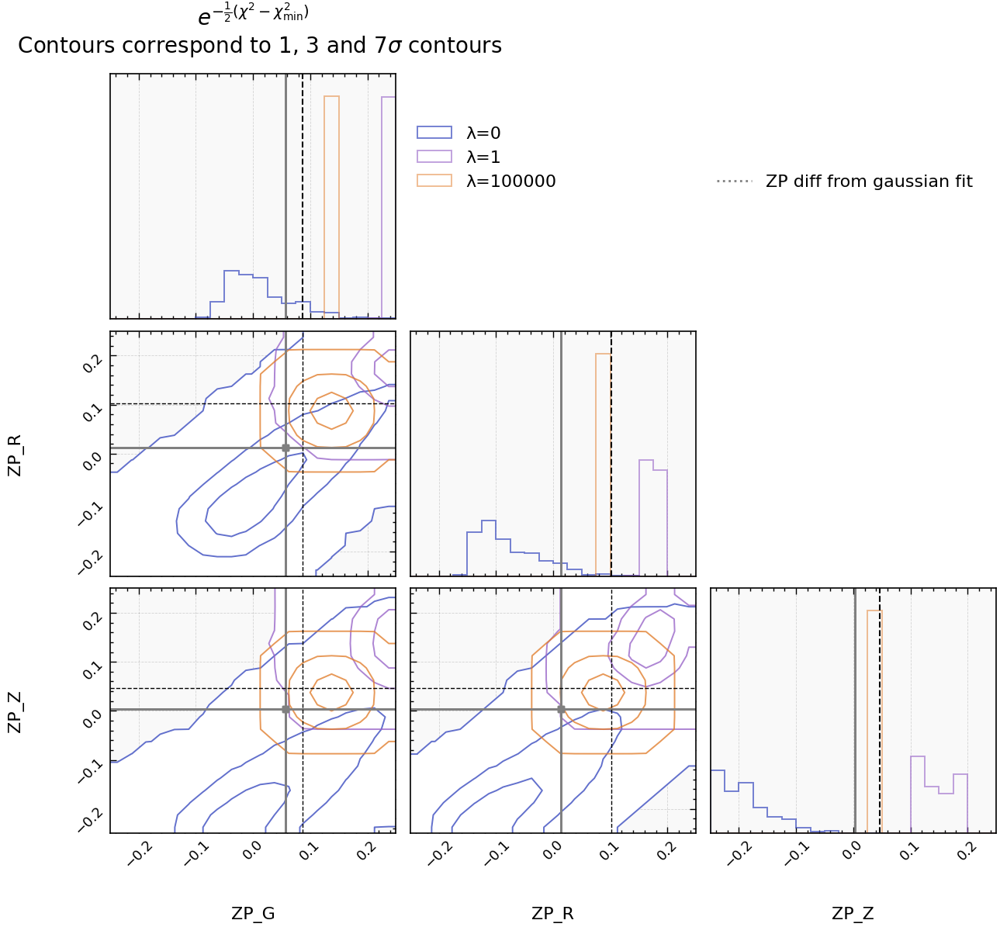

/tmp/ipykernel_2250896/194915091.py:146: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('winter_r')  #  'cool ', 'spring', 'summer', 'autumn'
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The f

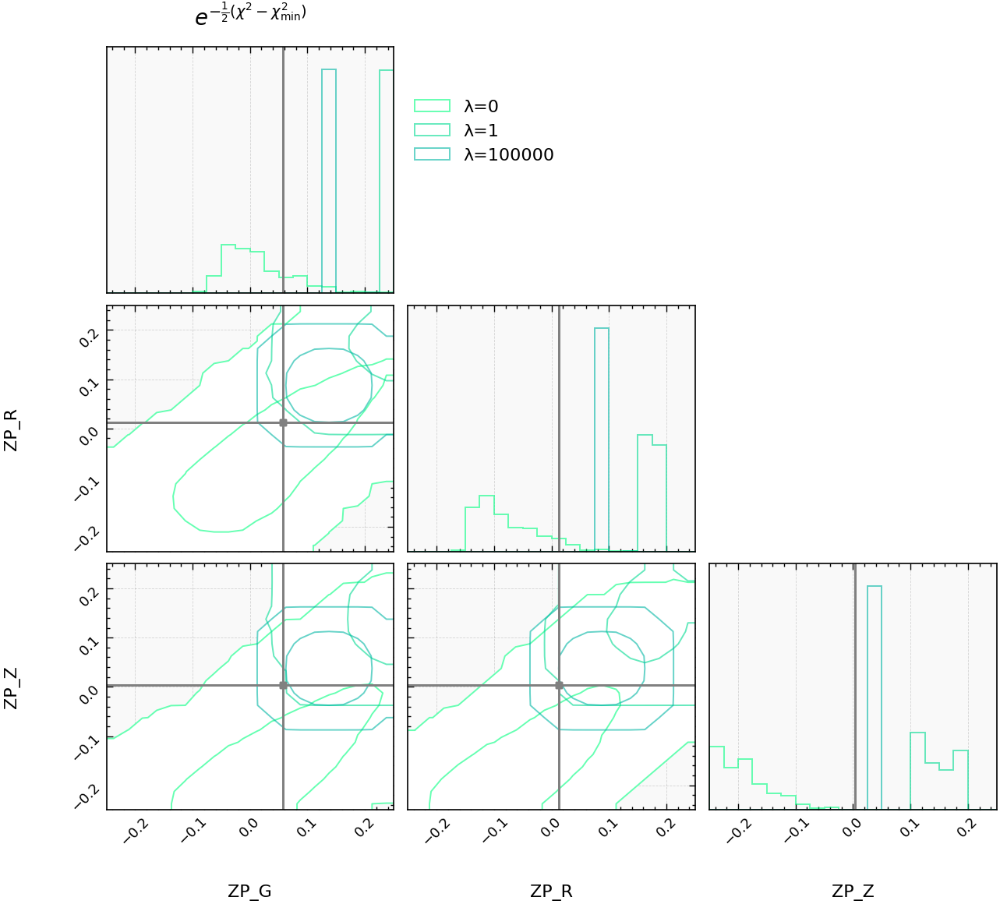

In [ ]:
import corner
lambda_array_subset = [0, 1,100000]
chi = chi_square_grid_lambda - np.nanmin(chi_square_grid_lambda)
grid = grid_values

condition = np.where(valid_mask)

def extract_samples_weights(chi_grid):

    selected_chi = chi_grid[condition]

    chi_min = chi_grid[condition].min()
    Gg, Rg, Zg = np.meshgrid(grid_values, grid_values, grid_values, indexing='ij')
    mask = valid_mask
    ZP_G = Gg[mask]
    ZP_R = Rg[mask]
    ZP_Z = Zg[mask]
    chi  = chi_square_grid[mask]
    weights = np.exp(-0.5 * (selected_chi - chi_min))
    weights /= np.sum(weights)
    samples = np.column_stack([ZP_G, ZP_R, ZP_Z])
    return samples, weights

    
    
colors = ['mediumturquoise','mediumaquamarine','royalblue','mediumorchid','hotpink','salmon','navajowhite']
    
colors = [
    "#88ccee",   # light blue
    "#44aa99",   # light green
    "#ddcc77",   # tan
    "#cc6677",   # rose
    "#aa4499",   # purple
    "#117733",   # dark green
]
colors = [
    "#3b4cc0",  # deep blue
    "#9864c8",  # violet
    "#e17c2a", 
    "#c14a5d",  # muted red
     # amber
    "#2aa17b",  # green-teal
]

plt.rcParams.update({
    "axes.labelsize": 16,
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "font.size": 15,
    "axes.linewidth": 1.2,
})
plt.rcParams["axes.grid"] = True
plt.rcParams["grid.alpha"] = 0.15
plt.rcParams["grid.linestyle"] = "--"
plt.rcParams["grid.linewidth"] = 0.6
fig = plt.figure(figsize=(14, 12))   


for idx, lambda_val in enumerate(lambda_array_subset):
    values = chi_square_lambda[lambda_val]
    chi_grid = values['chi_square_grid']
    samples, weights = extract_samples_weights(chi_grid)
    mean_zp = np.average(samples, axis=0, weights=weights)
    cov_zp = np.cov(samples.T, aweights=weights)
    std_zp = np.sqrt(np.diag(cov_zp))
    # print(f"Lambda: {lambda_val}")
    # print(f"Mean ZP_G: {mean_zp[0]:.4f} ± {std_zp[0]:.4f}")
    # print(f"Mean ZP_R: {mean_zp[1]:.4f} ± {std_zp[1]:.4f}")
    # print(f"Mean ZP_Z: {mean_zp[2]:.4f} ± {std_zp[2]:.4f}")
    # print(f'N objects at best fit: {values["N_objects"]}')
    # print(f'Chi-square at best fit: {values["Chi-square"]:.2f}')
    # print('-' * 40)
    
    # Decrease alpha as index increases
    alpha_contour = max(0.05, 0.8 - idx * 0.01)
    alpha_hist = max(0.2, 0.7 - idx * 0.1)

    fig = corner.corner(
        samples,
        weights=weights,
        labels=[r"ZP_G", r"ZP_R", r"ZP_Z"],
        color=colors[idx],
        levels=[0.68,0.989,0.999999999999994],
        fill_contours=False,
        smooth=1.0,     
        truths=[0.0574, 0.0131, 0.0033],
        truth_color="gray",
        plot_density=False,
        truth_linestyle=":",
        kde=True,
        plot_datapoints=False,
        show_titles=False,
        contour_kwargs={"linewidths": 1.4, "colors": colors[idx], 'alpha': alpha_contour, "label": f"λ={lambda_val}"},
        hist_kwargs={"linewidth": 1.4, "color": colors[idx], "alpha": alpha_hist, "label": f"λ={lambda_val}"},
        fig=fig
    )

# Add legend to one of the diagonal subplots
axes = fig.get_axes()
for ax in fig.get_axes():
    ax.set_facecolor("#f9f9f9")  # very light grey background
true1 = [0.0574, 0.0131, 0.0033]
true2 = [0.086999999999, 0.10200000000000031,0.0470000000000006 ]

axes = fig.get_axes()
ndim = 3
from matplotlib.lines import Line2D
for i in range(ndim):
    ax = axes[i*ndim + i]      # diagonal histogram
    ax.axvline(true2[i], color="black", linestyle="--", linewidth=1.5)

for yi in range(ndim):
    for xi in range(yi):
        ax = axes[yi*ndim + xi]
        ax.axvline(true2[xi], color="black", linestyle="--", linewidth=1)
        ax.axhline(true2[yi], color="black", linestyle="--", linewidth=1)

legend_lines = [
    Line2D([0], [0], color="gray", linestyle=":", lw=2, label= "ZP diff from gaussian fit"),
]


axes[0].legend(
    loc=(10,0.9),
    bbox_to_anchor=(1.05, 0.5),
    fontsize=16,
    frameon=False
)
axes[1].legend(handles = legend_lines,
    loc=(10,0.9),
    bbox_to_anchor=(1.05, 0.5),
    fontsize=16,
    frameon=False
)
axes[0].set_title(r"$e^{-\frac{1}{2}(\chi^2 - \chi^2_{\min})}$"+ "\n  Contours correspond to 1, 3 and 7$\sigma$ contours", fontsize=20, pad=20)
plt.show()

colors = [
    "#3b4cc0", "#9864c8", "#c14a5d", "#e17c2a", "#2aa17b",
    "#4a90e2", "#7b6bd6", "#d35fb7", "#ef6c4e", "#f4a462",
    "#6bbf5e", "#4c9a91", "#bfa641", "#7e4f9e", "#b85c4f",
    "#5aa3d8", "#32936f"
]
# Use a colormap for increasing color scheme
import matplotlib.cm as cm
cmap = cm.get_cmap('winter_r')  #  'cool ', 'spring', 'summer', 'autumn' 
colors = [cmap(i) for i in np.linspace(0, 1, len(lambda_array))]

fig = plt.figure(figsize=(14, 12))   
for idx, lambda_val in enumerate(lambda_array_subset):
    values = chi_square_lambda[lambda_val]
    chi_grid = values['chi_square_grid']
    samples, weights = extract_samples_weights(chi_grid)
    mean_zp = np.average(samples, axis=0, weights=weights)
    cov_zp = np.cov(samples.T, aweights=weights)
    std_zp = np.sqrt(np.diag(cov_zp))
    
    # Get color from colormap
    
    # Decrease alpha as index increases
    alpha_contour = 0.6
    alpha_hist =0.6

    fig = corner.corner(
        samples,
        weights=weights,
        labels=[r"ZP_G", r"ZP_R", r"ZP_Z"],
        color=colors[idx],
        levels=[ 0.989,0.999999999999994],
        fill_contours=False,
        smooth=1.0,     
        truths=[0.0574, 0.0131, 0.0033],
        truth_color="gray",
        plot_density=False,
        truth_linestyle=":",
        kde=True,
        plot_datapoints=False,
        show_titles=False,
        contour_kwargs={"linewidths": 1.4, "colors": [colors[idx]], 'alpha': alpha_contour, "label": f"λ={lambda_val}"},
        hist_kwargs={"linewidth": 1.4, "color": colors[idx], "alpha": alpha_hist, "label": f"λ={lambda_val}"},
        fig=fig
    )

# Add legend to one of the diagonal subplots
axes = fig.get_axes()
for ax in fig.get_axes():
    ax.set_facecolor("#f9f9f9")  # very light grey background
axes[0].legend(
    loc=(10,-0.5),
    bbox_to_anchor=(1.05, 0.5),
    fontsize=16,
    frameon=False
)
axes[0].set_title(r"$e^{-\frac{1}{2}(\chi^2 - \chi^2_{\min})}$", fontsize=20, pad=20)
plt.show()




In [ ]:
chi_square_lambda.keys()

dict_keys([0, 0.001, 0.01, 0.05, 0.1, 1, 10, 100000.0])

/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)


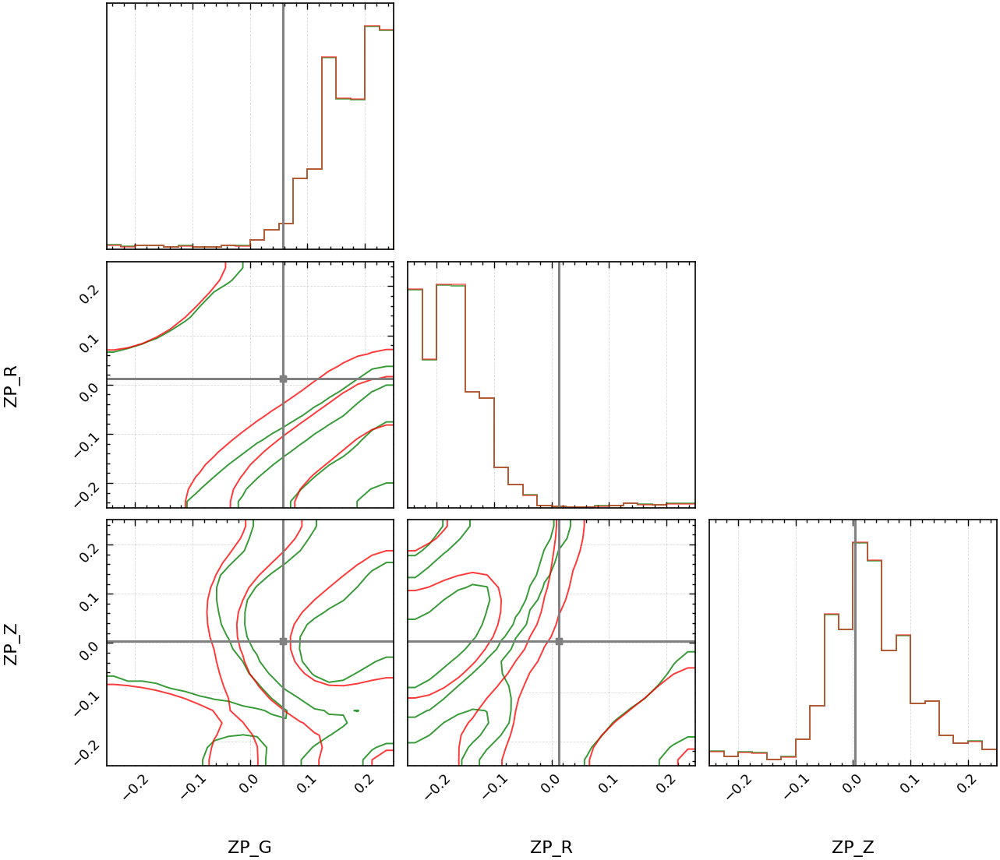

In [ ]:

lambda_array_subset = [0, 1,100000]
chi = chi_square_grid_lambda - np.nanmin(chi_square_grid_lambda)
grid = grid_values

condition = np.where(valid_mask)

def extract_samples_weights(chi_grid):

    selected_chi = chi_grid[condition]

    chi_min = chi_grid[condition].min()
    Gg, Rg, Zg = np.meshgrid(grid_values, grid_values, grid_values, indexing='ij')
    mask = valid_mask
    ZP_G = Gg[mask]
    ZP_R = Rg[mask]
    ZP_Z = Zg[mask]
    chi  = chi_square_grid[mask]
    weights = selected_chi - chi_min
    weights /= np.sum(weights)
    
    samples = np.column_stack([ZP_G, ZP_R, ZP_Z])
    return samples, weights

    
    
colors = ['mediumturquoise','mediumaquamarine','royalblue','mediumorchid','hotpink','salmon','navajowhite']
    
colors = [
    "#88ccee",   # light blue
    "#44aa99",   # light green
    "#ddcc77",   # tan
    "#cc6677",   # rose
    "#aa4499",   # purple
    "#117733",   # dark green
]
colors = [
    "#3b4cc0",  # deep blue
    "#9864c8",  # violet
    "#e17c2a", 
    "#c14a5d",  # muted red
     # amber
    "#2aa17b",  # green-teal
]


colors = ['k','g','r']
plt.rcParams.update({
    "axes.labelsize": 16,
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "font.size": 15,
    "axes.linewidth": 1.2,
})
plt.rcParams["axes.grid"] = True
plt.rcParams["grid.alpha"] = 0.15
plt.rcParams["grid.linestyle"] = "--"
plt.rcParams["grid.linewidth"] = 0.6
fig = plt.figure(figsize=(14, 12))   


values = chi_square_lambda[100000]
chi_grid = values['chi_square_grid']
samples, weights = extract_samples_weights(chi_grid)
mean_zp = np.average(samples, axis=0, weights=weights)
cov_zp = np.cov(samples.T, aweights=weights)
std_zp = np.sqrt(np.diag(cov_zp))
idx =0
alpha_contour = max(0.05, 0.8 - idx * 0.01)
alpha_hist = max(0.2, 0.7 - idx * 0.1)

# fig = corner.corner(
#     samples,
#     weights=weights,
#     labels=[r"ZP_G", r"ZP_R", r"ZP_Z"],
#     color=colors[idx],
#     levels=[0.68, 0.95, 0.989],
#     fill_contours=False,
#     smooth=1.0,     
#     truths=[0.0574, 0.0131, 0.0033],
#     truth_color="gray",
#     plot_density=False,
#     truth_linestyle=":",
#     kde=True,
#     plot_datapoints=False,
#     show_titles=False,
#     contour_kwargs={"linewidths": 1.4, "colors": colors[idx], 'alpha': alpha_contour, "label": f"λ={lambda_val}"},
#     hist_kwargs={"linewidth": 1.4, "color": colors[idx], "alpha": alpha_hist, "label": f"λ={lambda_val}"},
#     fig=fig
# )

idx =1
values = chi_square_lambda[1]
chi_grid = values['chi_square_grid']
samples, weights = extract_samples_weights(chi_grid)
mean_zp = np.average(samples, axis=0, weights=weights)
cov_zp = np.cov(samples.T, aweights=weights)
std_zp = np.sqrt(np.diag(cov_zp))

alpha_contour = max(0.05, 0.8 - idx * 0.01)
alpha_hist = max(0.2, 0.7 - idx * 0.1)

fig = corner.corner(
    samples,
    weights=weights,
    labels=[r"ZP_G", r"ZP_R", r"ZP_Z"],
    color=colors[idx],
    levels=[0.68, 0.95, 0.989],
    fill_contours=False,
    smooth=1.0,     
    truths=[0.0574, 0.0131, 0.0033],
    truth_color="gray",
    plot_density=False,
    truth_linestyle=":",
    kde=True,
    plot_datapoints=False,
    show_titles=False,
    contour_kwargs={"linewidths": 1.4, "colors": colors[idx], 'alpha': alpha_contour, "label": f"λ={lambda_val}"},
    hist_kwargs={"linewidth": 1.4, "color": colors[idx], "alpha": alpha_hist, "label": f"λ={lambda_val}"},
    fig=fig
)



idx =2
values = chi_square_lambda[0]
chi_grid = values['chi_square_grid']
samples, weights = extract_samples_weights(chi_grid)
mean_zp = np.average(samples, axis=0, weights=weights)
cov_zp = np.cov(samples.T, aweights=weights)
std_zp = np.sqrt(np.diag(cov_zp))

alpha_contour = max(0.05, 0.8 - idx * 0.01)
alpha_hist = max(0.2, 0.7 - idx * 0.1)


fig = corner.corner(
    samples,
    weights=weights,
    labels=[r"ZP_G", r"ZP_R", r"ZP_Z"],
    color=colors[idx],
    levels=[0.68, 0.95, 0.989],
    fill_contours=False,
    smooth=2.0,     
    truths=[0.0574, 0.0131, 0.0033],
    truth_color="gray",
    plot_density=False,
    truth_linestyle=":",
    kde=True,
    plot_datapoints=False,
    show_titles=False,
    contour_kwargs={"linewidths": 1.4, "colors": colors[idx], 'alpha': alpha_contour, "label": f"λ={lambda_val}"},
    hist_kwargs={"linewidth": 1.4, "color": colors[idx], "alpha": alpha_hist, "label": f"λ={lambda_val}"},
    fig=fig
)


In [ ]:
# # Get the best-fit indices and chi-square values for all valid points
# condition = np.where(valid_mask)
# selected_zp_G = grid_values[condition[0]]
# selected_zp_R = grid_values[condition[1]]
# selected_zp_Z = grid_values[condition[2]]
# selected_chi = chi_square_grid[condition]

# # Create a DataFrame for easier plotting
# df_grid = pd.DataFrame({
#     'ZP_G': selected_zp_G,
#     'ZP_R': selected_zp_R,
#     'ZP_Z': selected_zp_Z,
#     'chi_square': selected_chi
# })

# #df_grid[df_grid['chi_square']<1.637289e+04]
# chi_min = df_grid['chi_square'].min()
# vals = np.linspace(-0.15, 0.15, 61)
# Gg, Rg, Zg = np.meshgrid(vals, vals, vals, indexing='ij')
# mask = valid_mask

# ZP_G = Gg[mask]
# ZP_R = Rg[mask]
# ZP_Z = Zg[mask]
# chi  = chi_square_grid[mask]

# chi_min = chi.min()
# weights = np.exp(-0.5 * (chi - chi_min))

# samples = np.column_stack([ZP_G, ZP_R, ZP_Z])


In [ ]:
chi_square_lambda

{0: {'chi_square_grid': array([[[4.54160596e+02, 4.70368684e+02, 4.63544562e+02, ...,
           6.19429018e+04, 6.70253113e+04, 7.39299008e+04],
          [3.92837571e+02, 4.20415180e+02, 4.35085236e+02, ...,
           5.90227232e+04, 6.12903755e+04, 6.29184814e+04],
          [3.07641301e+02, 3.45741107e+02, 3.77601394e+02, ...,
           5.34006213e+04, 5.54224172e+04, 6.02000634e+04],
          ...,
          [8.93126027e+05, 1.60931717e+06, 2.56052787e+06, ...,
           2.40528824e+06, 2.40528824e+06, 2.40528824e+06],
          [9.40667081e+06, 9.40667081e+06, 1.17583093e+06, ...,
           2.75482722e+06, 4.82179523e+06, 4.82179523e+06],
          [9.81906249e+06, 1.30850238e+07, 1.32212270e+07, ...,
           5.67076471e+06, 5.67076471e+06, 5.67076471e+06]],
  
         [[4.92533367e+02, 4.99147809e+02, 4.80950330e+02, ...,
           6.10781609e+04, 6.54852155e+04, 7.04992052e+04],
          [4.37297656e+02, 4.51643711e+02, 4.66945502e+02, ...,
           6.14933243e+04, 

In [ ]:
idx = np.unravel_index(np.argmin(chi), chi.shape)
i0, j0, k0 = idx
i1, i2 = i0-2, i0+3
j1, j2 = j0-2, j0+3
k1, k2 = k0-2, k0+3
if i1 < 0 or j1 < 0 or k1 < 0 or i2 > chi.shape[0] or j2 > chi.shape[1] or k2 > chi.shape[2]:
    raise ValueError("Minimum too close to boundary. Your grid is betraying you.")

ValueError: Minimum too close to boundary. Your grid is betraying you.

In [ ]:
Gg, Rg, Zg = np.meshgrid(grid_values, grid_values, grid_values, indexing='ij') 
ZP_G = Gg 
ZP_R = Rg 
ZP_Z = Zg

In [ ]:
x = ZP_G[i1:i2, j1:j2, k1:k2].ravel()
y = ZP_R[i1:i2, j1:j2, k1:k2].ravel()
z = ZP_Z[i1:i2, j1:j2, k1:k2].ravel()
c = chi[i1:i2, j1:j2, k1:k2].ravel()

In [ ]:
X = np.column_stack([
    np.ones_like(x),
    x, y, z,
    x*x, y*y, z*z,
    x*y, x*z, y*z
])

coeffs, *_ = np.linalg.lstsq(X, c, rcond=None)

In [ ]:
a, bx, by, bz, cxx, cyy, czz, cxy, cxz, cyz = coeffs
H = np.array([
    [2*cxx, cxy, cxz],
    [cxy, 2*cyy, cyz],
    [cxz, cyz, 2*czz]
])

b_vec = np.array([bx, by, bz])

In [ ]:
zp_min = -np.linalg.solve(H, b_vec)

LinAlgError: Singular matrix

In [ ]:
ZP_G_min, ZP_R_min, ZP_Z_min = zp_min

print(ZP_G_min, x.min(), x.max())
print(ZP_R_min, y.min(), y.max())
print(ZP_Z_min, z.min(), z.max())

NameError: name 'zp_min' is not defined

In [ ]:
samples,weights = extract_samples_weights(chi_square_lambda[0]['chi_square_grid'])

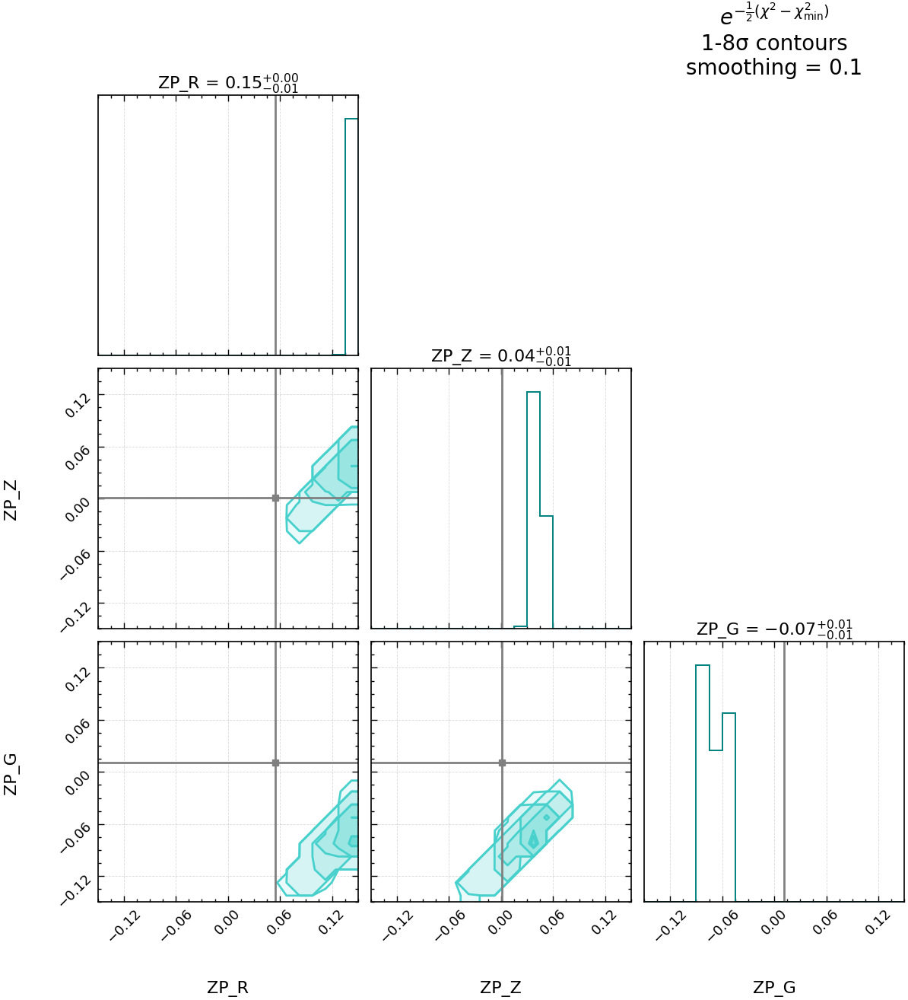

In [ ]:
fig = plt.figure(figsize=(13, 13))   
plt.rcParams.update({
    "axes.labelsize": 16,
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "font.size": 15,
    "axes.linewidth": 1.2,
})

fig = corner.corner(
    samples,
    weights=weights,
    labels=[ r"ZP_R", r"ZP_Z",r"ZP_G"],
    color="mediumturquoise",
    levels=[0.393469, 0.864665, 0.988891,
    0.999936, 0.999999426, 0.999999999019,
    0.999999999999994,1- 6e-16],       # 1σ -  8σ levels
    fill_contours=True,
    smooth=0.,     
    truths=[0.055, 0.001, 0.0112],     
    truth_color="gray",                      # KDE smoothing
    plot_density=True,
    truth_linestyle=":",
    plot_datapoints=False,
    show_titles=True,
    hist_kwargs={"linewidth": 1.4, "color": "teal"},
    fig=fig
)

# Add title to the top-left subplot
axes = fig.get_axes()
# Option 1: Top-left position (using axes[0])
# axes[0].set_title(r'$e^{-\frac{1}{2}(\chi^2 - \chi^2_{\min})}$'+' 1-8σ contours', 
#                   fontsize=20, pad=20)

# # Option 2: Top-left with custom position using text
# axes[0].text(0.5, 1.3, r'$e^{-\frac{1}{2}(\chi^2 - \chi^2_{\min})}$'+' 1-8σ contours',
#              transform=axes[0].transAxes, fontsize=20, ha='center')

# # Option 3: Figure-level title (centered at top of entire figure)
# fig.suptitle(r'$e^{-\frac{1}{2}(\chi^2 - \chi^2_{\min})}$'+' 1-8σ contours', 
#              fontsize=20, y=0.98)

# Option 4: Top-right position
axes[2].set_title(r'$e^{-\frac{1}{2}(\chi^2 - \chi^2_{\min})}$'+'\n 1-8σ contours \n'+r'smoothing = 0.1', 
                  fontsize=20, pad=20)

# Option 5: Combined - title on top-left and subtitle
# axes[0].set_title(r'$e^{-\frac{1}{2}(\chi^2 - \chi^2_{\min})}$', fontsize=20, pad=20)
# axes[0].text(0.5, 1.15, '1-8σ contours', transform=axes[0].transAxes, 
#              fontsize=14, ha='center', style='italic')

plt.show()

/tmp/ipykernel_2752063/769695717.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('spring_r')
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)
/user/animesh.sah/.local/lib/python3.10/site-packages/corner/core.py:800: UserWarning: The following kwargs were not used by contour: '

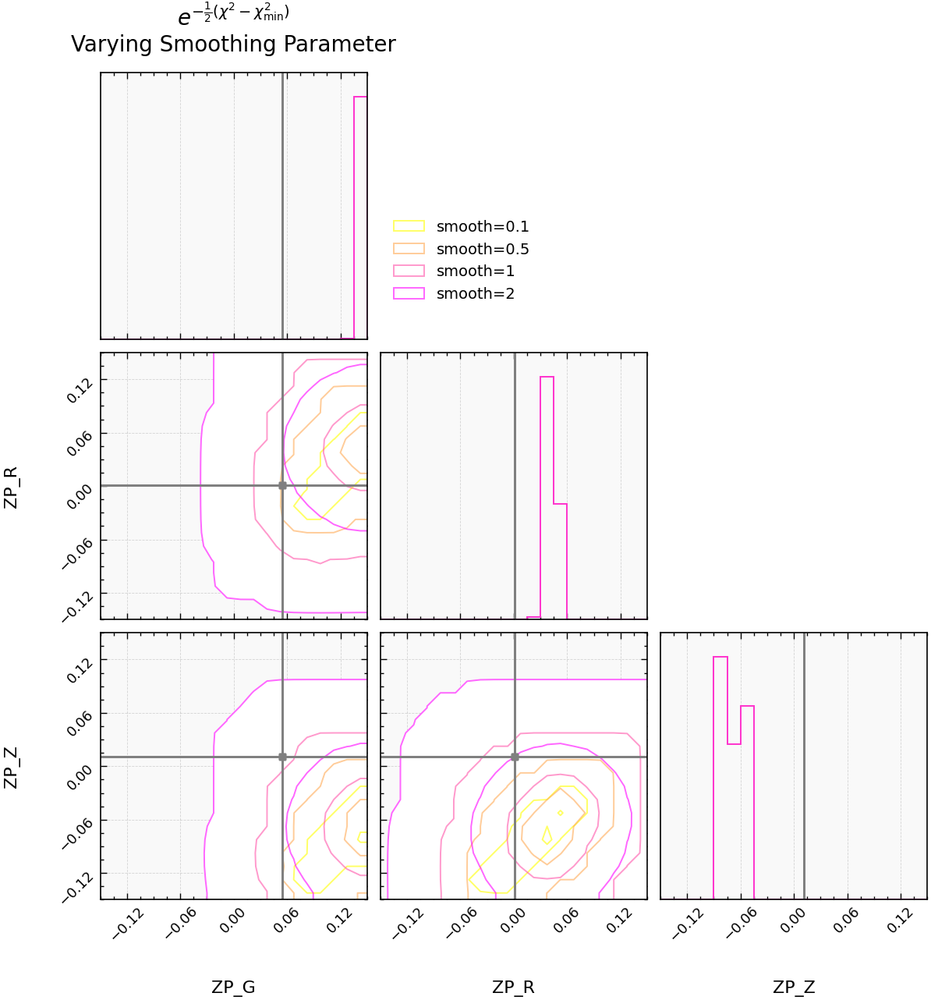

In [ ]:
import matplotlib.cm as cm

fig = plt.figure(figsize=(13, 13))   
plt.rcParams.update({
    "axes.labelsize": 16,
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "font.size": 15,
    "axes.linewidth": 1.2,
})

# Smoothing parameters to test
smoothing_values = [0.1, 0.5, 1, 2]

# Get colors from spring colormap
cmap = cm.get_cmap('spring_r')
colors = [cmap(i) for i in np.linspace(0, 1, len(smoothing_values))]

for idx, smooth_val in enumerate(smoothing_values):
    fig = corner.corner(
        samples,
        weights=weights,
        labels=[r"ZP_G", r"ZP_R", r"ZP_Z"],
        color=colors[idx],
        levels=[0.988891, 0.999999999999994],
        fill_contours=False,
        smooth=smooth_val,     
        truths=[0.057, 0.001, 0.0112],     
        truth_color="gray",
        plot_density=False,
        truth_linestyle=":",
        plot_datapoints=False,
        show_titles=False,
        contour_kwargs={"linewidths": 1.4, "colors": [colors[idx]], 'alpha': 0.6, "label": f"smooth={smooth_val}"},
        hist_kwargs={"linewidth": 1.4, "color": colors[idx], "alpha": 0.6, "label": f"smooth={smooth_val}"},
        fig=fig
    )

axes = fig.get_axes()
for ax in fig.get_axes():
    ax.set_facecolor("#f9f9f9")

axes[0].legend(
    loc='best',
    bbox_to_anchor=(1.05, 0.5),
    fontsize=14,
    frameon=False
)
axes[0].set_title(r'$e^{-\frac{1}{2}(\chi^2 - \chi^2_{\min})}$' + '\nVarying Smoothing Parameter', 
                  fontsize=20, pad=20)

plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# chi = chi_square_grid - np.nanmin(chi_square_grid)
# grid = grid_values

# for k in range(len(grid)):
#     slice_2d = chi[:, :, k]
#     slice_2d = np.where(np.isinf(slice_2d), np.nan, slice_2d)
#     X, Y = np.meshgrid(grid, grid, indexing='ij')
#     plt.figure(figsize=(6,5))
#     cs = plt.contourf(X, Y, slice_2d, levels=[0,1,2,4,8,10,12,16,18,20,22,24,26,30,40], cmap='YlGnBu')
#     plt.colorbar(cs, label='Δχ²')
#     plt.title(f"Δχ² contour at ZP_Z = {grid[k]:.4f}")
#     plt.xlabel("ZP_G")
#     plt.ylabel("ZP_R")

In [ ]:



for k in range(len(n_objects_array)):
    slice_2d = n_objects_array[:, :, k]
    slice_2d = np.where(np.isinf(slice_2d), np.nan, slice_2d)
    plt.figure(figsize=(15,15))
    plt.title(f'ZP_Z = {grid[k]:.4f}')
    plt.matshow(slice_2d,cmap='YlGnBu')
    #cs = plt.contourf(X, Y, slice_2d, levels=[0,1,2,4,8,10,12,16,18,20,22,24,26,30,40], cmap='YlGnBu')
    #plt.colorbar(cs, label='Δχ²')
    #plt.title(f"Δχ² contour at ZP_R = {grid[k]:.4f}")
    plt.colorbar(label='N objects')
    plt.xlabel("ZP_G")
    plt.ylabel("ZP_R")
    plt.show()

NameError: name 'grid' is not defined

<Figure size 1500x1500 with 0 Axes>

In [ ]:
chi

array([[[4.23397708e+02, 4.39605797e+02, 4.32781674e+02, ...,
         6.19121389e+04, 6.69945484e+04, 7.38991379e+04],
        [3.62074683e+02, 3.89652293e+02, 4.04322349e+02, ...,
         5.89919603e+04, 6.12596126e+04, 6.28877185e+04],
        [2.76878413e+02, 3.14978219e+02, 3.46838507e+02, ...,
         5.33698584e+04, 5.53916544e+04, 6.01693005e+04],
        ...,
        [8.93095264e+05, 1.60928640e+06, 2.56049710e+06, ...,
         2.40525748e+06, 2.40525748e+06, 2.40525748e+06],
        [9.40664005e+06, 9.40664005e+06, 1.17580016e+06, ...,
         2.75479646e+06, 4.82176447e+06, 4.82176447e+06],
        [9.81903173e+06, 1.30849930e+07, 1.32211962e+07, ...,
         5.67073395e+06, 5.67073395e+06, 5.67073395e+06]],

       [[4.61770479e+02, 4.68384921e+02, 4.50187442e+02, ...,
         6.10473980e+04, 6.54544526e+04, 7.04684423e+04],
        [4.06534768e+02, 4.20880824e+02, 4.36182615e+02, ...,
         6.14625614e+04, 6.34270052e+04, 6.94330127e+04],
        [3.27451519e+02, 

/tmp/ipykernel_2301448/2953020404.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6,5))


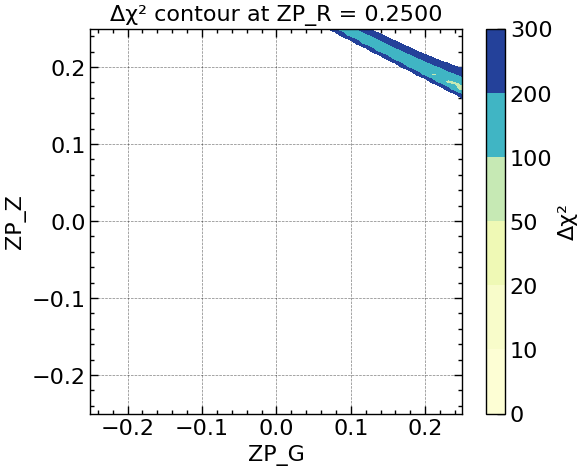

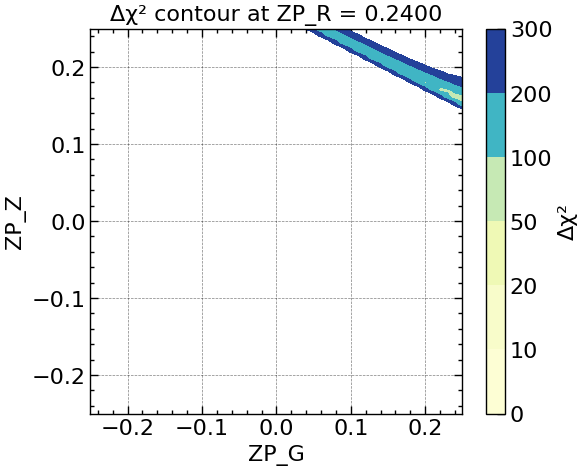

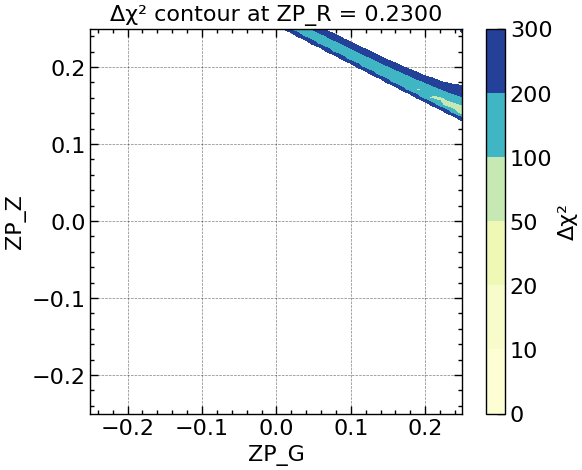

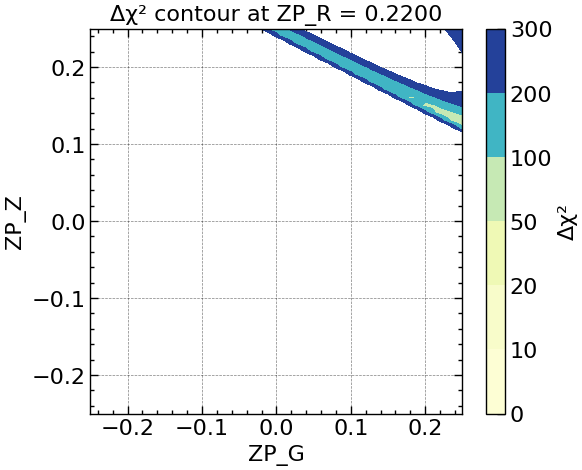

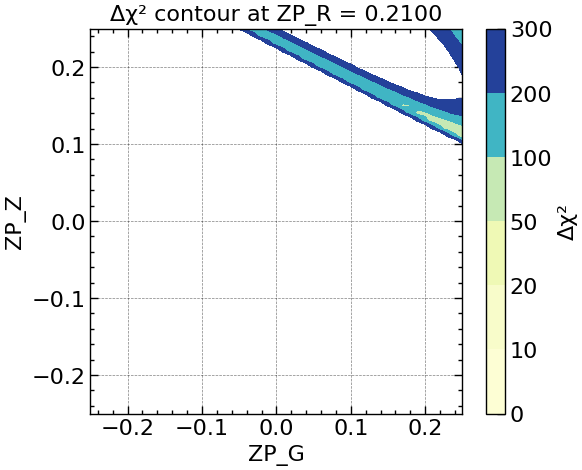

...

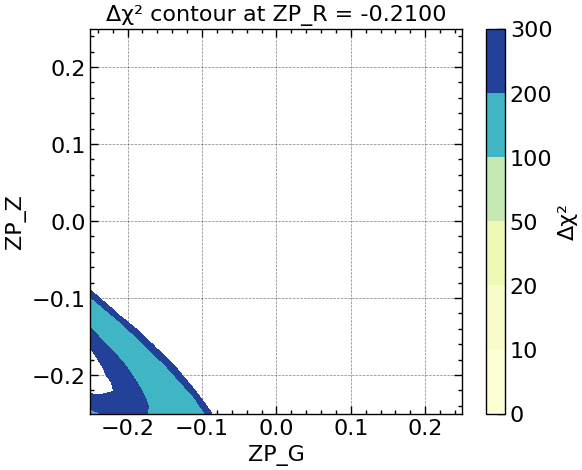

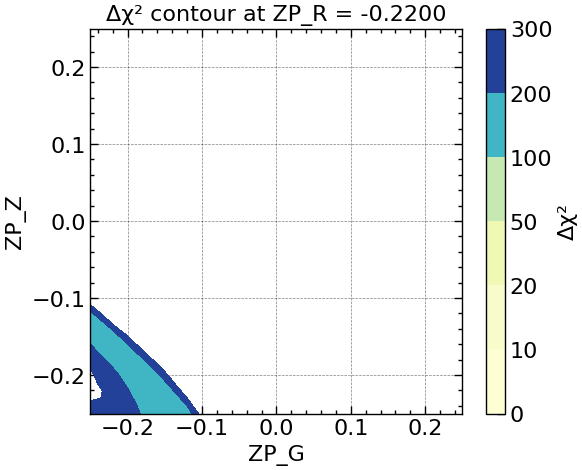

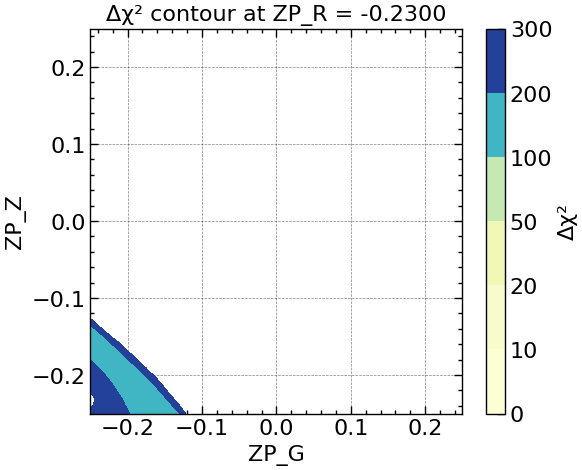

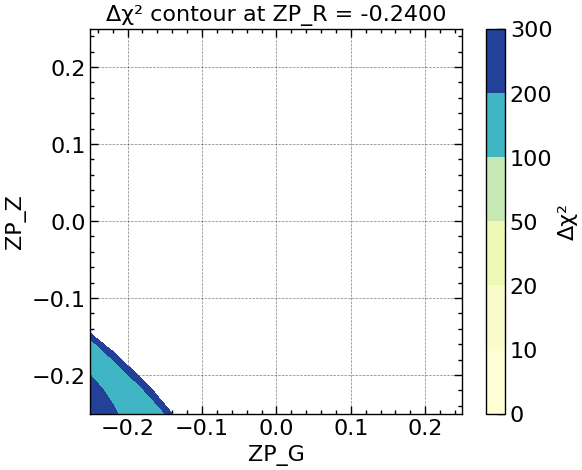

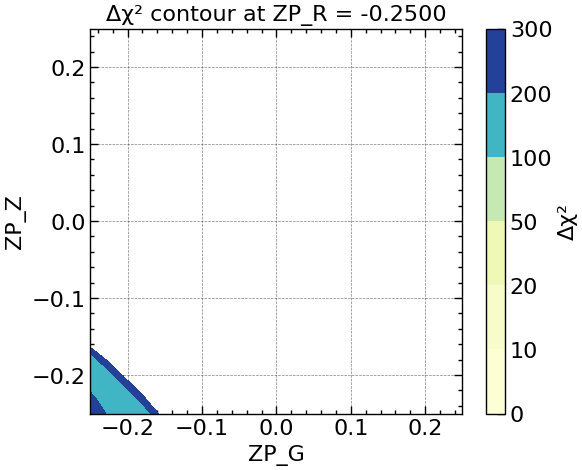

In [31]:
import matplotlib.pyplot as plt
import numpy as np

chi = chi_square_grid - np.nanmin(chi_square_grid)
grid = grid_values

for k in range(len(grid)):
    slice_2d = chi[:, k, :]
    slice_2d = np.where(np.isinf(slice_2d), np.nan, slice_2d)
    X, Y = np.meshgrid(grid, grid, indexing='ij')
    plt.figure(figsize=(6,5))
    cs = plt.contourf(X, Y, slice_2d, levels=[0,10,20,50,100,200,300], cmap='YlGnBu')
    plt.colorbar(cs, label='Δχ²')
    plt.title(f"Δχ² contour at ZP_R = {grid[k]:.4f}")
    plt.xlabel("ZP_G")
    plt.ylabel("ZP_Z")

In [32]:
chi_square_num_objects= np.full((len(grid_values), len(grid_values), len(grid_values)), np.inf)

for i in range(len(grid_values)):
    for j in range(len(grid_values)):
        for k in range(len(grid_values)):
            if valid_mask[i, j, k]:
                n_bins = n_bins_array[i, j, k]
                theta_bins = theta_bins_array[i, j, k, :n_bins]
                num_objects = n_objects_array[i, j, k]
                
                chi_square_num_objects[i, j, k] = calculate_chi_square_num_objects(
                    num_objects)



In [33]:
# Find indices of 5 minimum chi-square values
min_indices = np.argsort(chi_square_num_objects.ravel())[:100]

# Convert flat indices to 3D indices
min_3d_indices = np.unravel_index(min_indices, chi_square_num_objects.shape)

# Extract the 5 minimum points
print("Top 5 minimum chi-square points:\n")
print(f"{'Index':<8} {'ZP_G':<12} {'ZP_R':<12} {'ZP_Z':<12} {'χ²':<15}")
print("-" * 60)

for idx_num in range(100):
    i, j, k = min_3d_indices[0][idx_num], min_3d_indices[1][idx_num], min_3d_indices[2][idx_num]
    zp_g = grid_values[i]
    zp_r = grid_values[j]
    zp_z = grid_values[k]
    chi_val = chi_square_num_objects[i, j, k]
    
    print(f"{idx_num+1:<8} {zp_g:<12.6f} {zp_r:<12.6f} {zp_z:<12.6f} {chi_val:<15.6f}")

Top 5 minimum chi-square points:

Index    ZP_G         ZP_R         ZP_Z         χ²             
------------------------------------------------------------
1        -0.130000    0.030000     0.070000     0.000031       
2        -0.160000    0.020000     0.200000     0.000044       
3        -0.160000    0.040000     0.240000     0.000093       
4        -0.070000    -0.030000    0.000000     0.000114       
5        -0.130000    -0.060000    -0.020000    0.000218       
6        0.130000     0.090000     0.050000     0.000354       
7        -0.200000    0.020000     0.090000     0.000673       
8        -0.190000    -0.040000    0.100000     0.000727       
9        -0.230000    -0.090000    0.020000     0.000963       
10       -0.160000    0.030000     0.220000     0.001232       
11       0.060000     0.070000     0.040000     0.001232       
12       -0.050000    -0.010000    -0.010000    0.001535       
13       0.110000     0.130000     0.190000     0.003075       
14       

In [39]:
best_point

[-0.13, 0.03, 0.07]

/tmp/ipykernel_2301448/3944328390.py:48: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


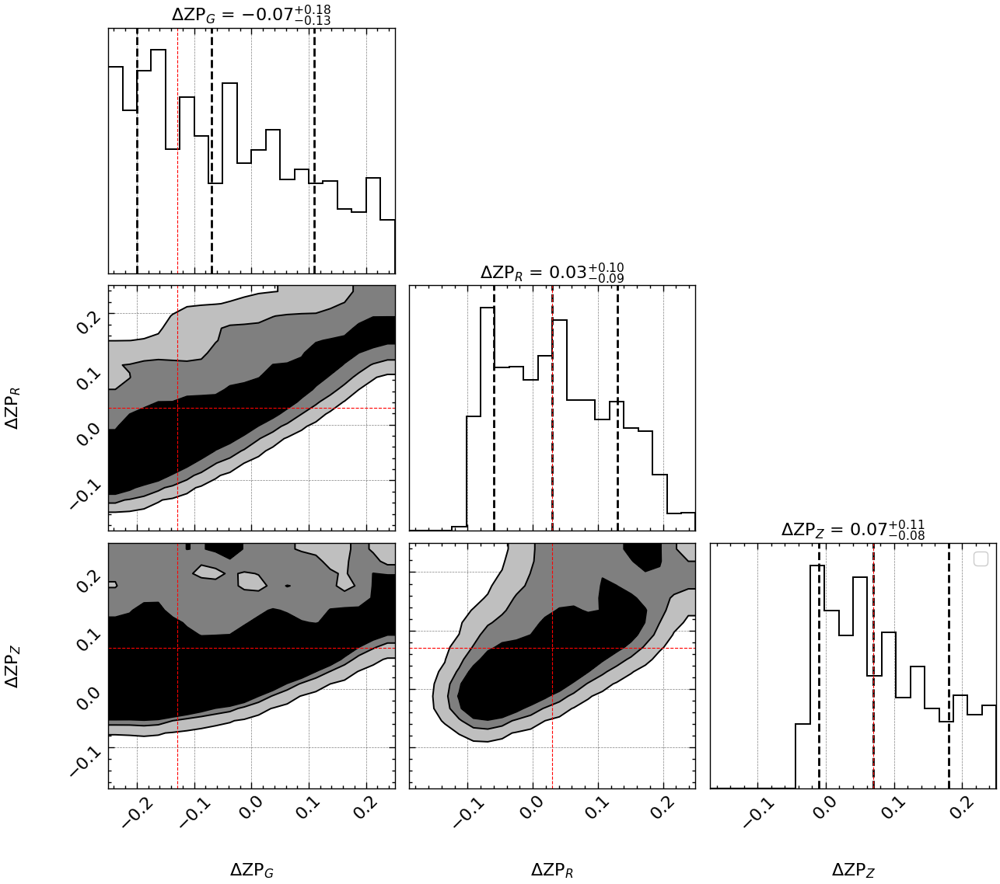

In [40]:
import corner
import numpy as np

# --- weights: convert Δχ² → likelihood weights ---
delta_chi2 = 1*chi_square_num_objects - np.nanmin(1*chi_square_num_objects)
weights_raw = np.exp(-delta_chi2.ravel() / 2)

# --- filter: only valid, finite points ---
mask = valid_mask.ravel() & np.isfinite(weights_raw) & (weights_raw > 0)

Gg, Rg, Zg = np.meshgrid(grid_values, grid_values, grid_values, indexing='ij')
samples = np.column_stack([Gg.ravel(), Rg.ravel(), Zg.ravel()])

samples_valid = samples[mask]
weights_valid = weights_raw[mask]

# normalise weights (not required by corner but avoids numerical issues)
weights_valid /= weights_valid.sum()

fig = plt.figure(figsize=(14, 12))
fig = corner.corner(
    samples_valid,
    weights=weights_valid,
    labels=[r"$\Delta\mathrm{ZP}_G$", r"$\Delta\mathrm{ZP}_R$", r"$\Delta\mathrm{ZP}_Z$"],
    levels=[0.68, 0.95, 0.997],          # 1σ, 2σ, 3σ — last value was ~1.0, causes edge artifacts
    fill_contours=True,
    smooth=1.0,
    plot_density=False,
    plot_datapoints=False,
    show_titles=True,                    # shows marginalized best-fit ± from the 1D histograms
    quantiles=[0.16, 0.5, 0.84],
    contour_kwargs={"linewidths": 1.4},
    hist_kwargs={"linewidth": 1.4},
    fig=fig,
)

best_idx = np.unravel_index(np.nanargmin(chi_square_num_objects), chi_square_num_objects.shape)
best_point = [grid_values[i] for i in best_idx]

# overplot on corner figure
axes = np.array(fig.axes).reshape(3, 3)
for i in range(3):
    for j in range(i):
        axes[i, j].axvline(best_point[j], color='red', lw=0.8, ls='--',label='Best Fit' if (i==2 and j==0) else None)
        axes[i, j].axhline(best_point[i], color='red', lw=0.8, ls='--',label='Best Fit' if (i==2 and j==0) else None)
for i in range(3):
    axes[i, i].axvline(best_point[i], color='red', lw=0.8, ls='--',label='Best Fit' if i==0 else None)
plt.legend(loc='upper right')

In [ ]:
grid_values[k]

-0.25


For ZP_R = 0.2400:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.2100       0.2000       0.1578      


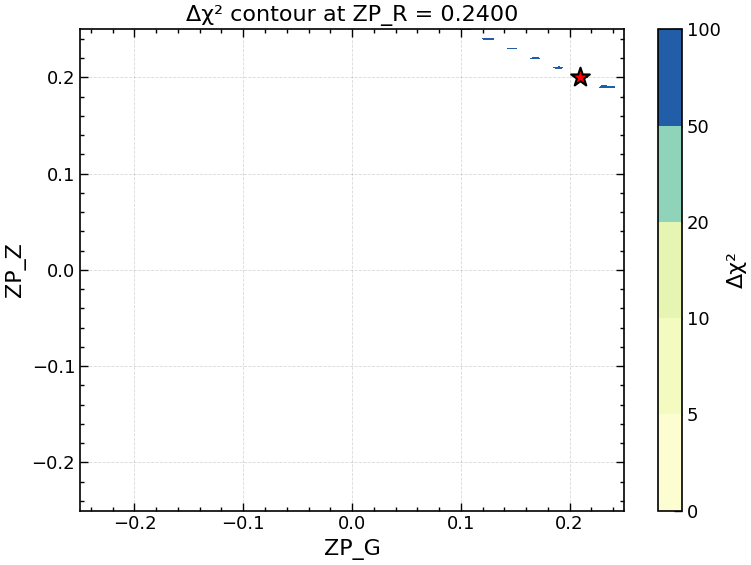


For ZP_R = 0.2000:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.0900       0.2000       0.0207      
2      0.2000       0.1500       0.0441      


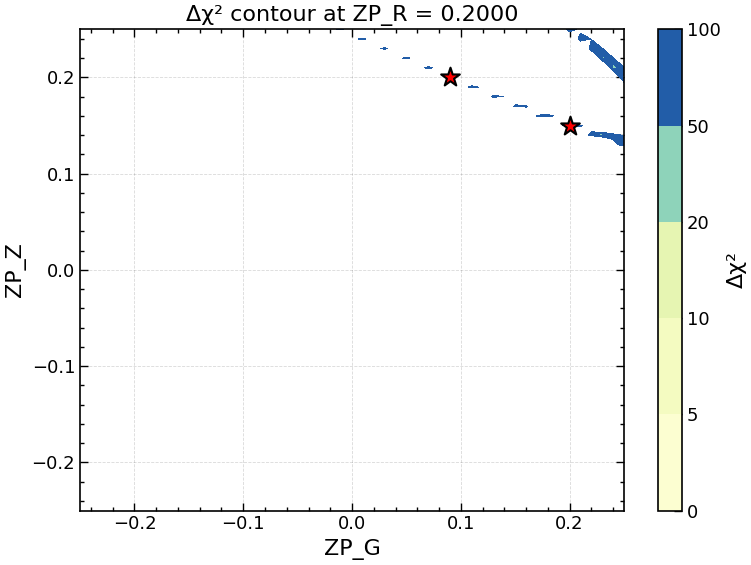


For ZP_R = 0.1900:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.1800       0.2500       0.0531      
2      0.0400       0.2100       0.0564      
3      0.2500       0.1800       0.0691      
4      0.2200       0.1300       0.0780      


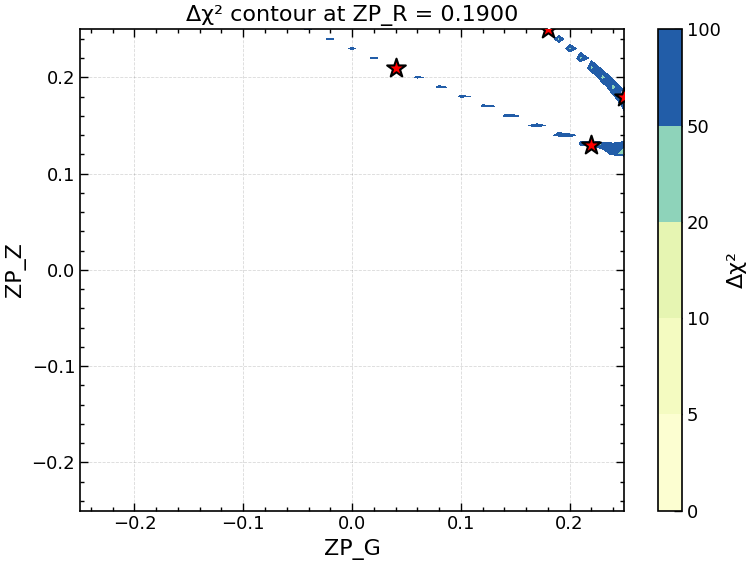


For ZP_R = 0.1800:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0100      0.2200       0.0210      
2      0.2300       0.1800       0.0735      
3      0.1600       0.1400       0.1611      


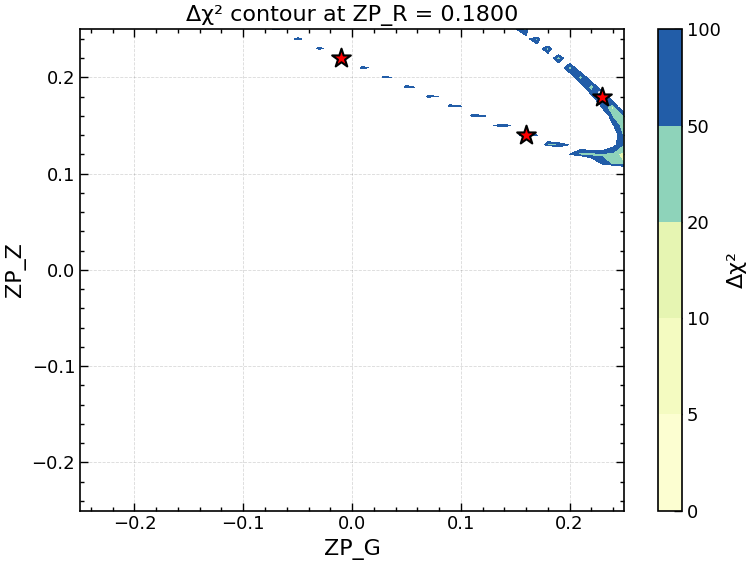


For ZP_R = 0.1700:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1000      0.2500       0.0922      


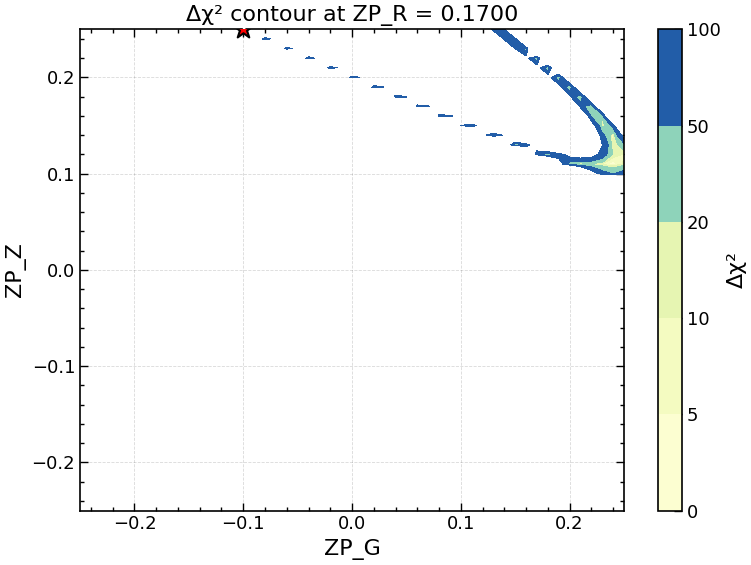


For ZP_R = 0.1400:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.1300       0.1000       0.0056      


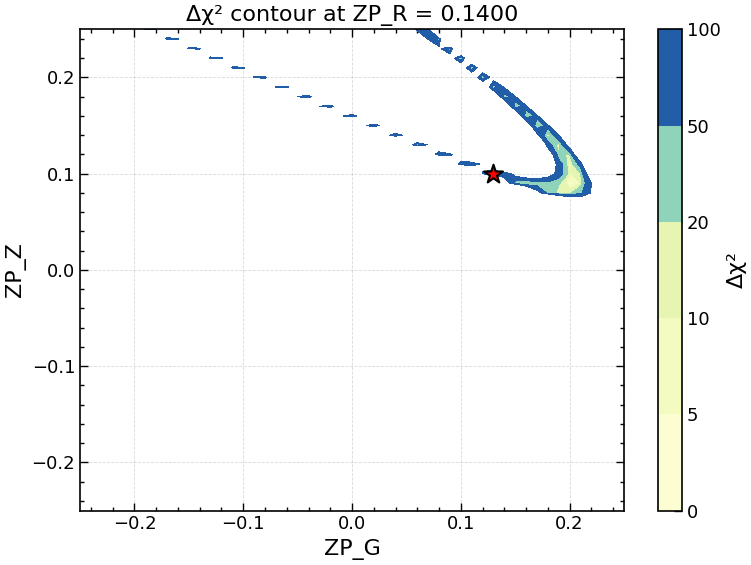


For ZP_R = 0.1300:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.1100       0.1900       0.0030      
2      0.0100       0.1400       0.0344      


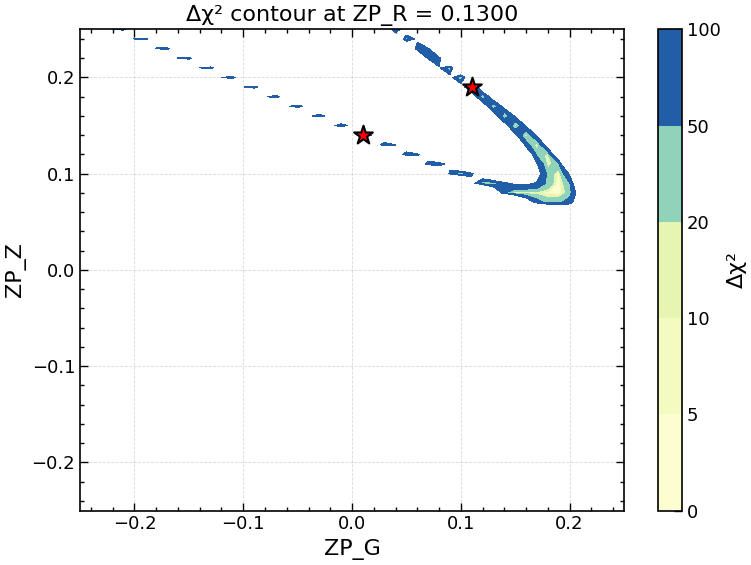


For ZP_R = 0.1200:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.1300       0.1500       0.0057      
2      0.1700       0.0700       0.0198      
3      0.1200       0.1600       0.0531      
4      -0.0400      0.1500       0.0629      
5      0.1700       0.1000       0.0751      
6      0.1500       0.0700       0.1451      
7      0.1400       0.1400       0.1643      


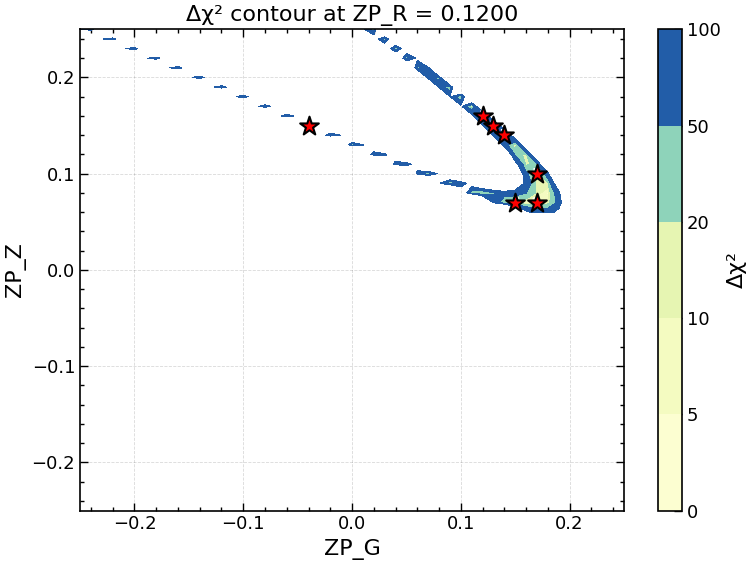


For ZP_R = 0.1100:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.1100       0.0700       0.0222      
2      -0.1300      0.1800       0.0729      
3      -0.1100      0.1700       0.0922      


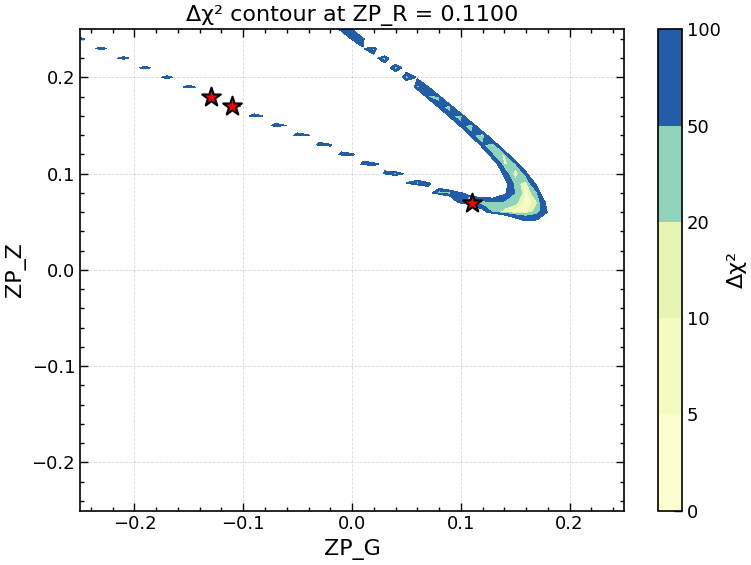


For ZP_R = 0.1000:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0300      0.2500       0.0797      


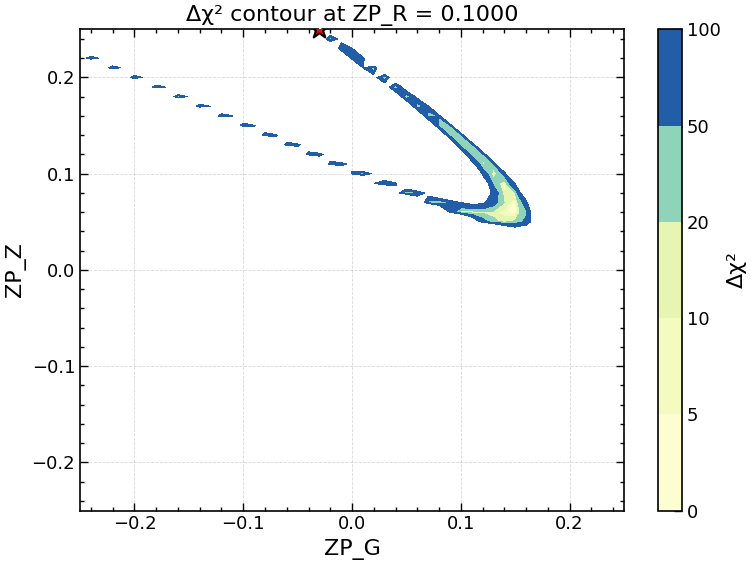


For ZP_R = 0.0900:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.1300       0.0500       0.0003      
2      0.0000       0.0900       0.0283      
3      0.0700       0.0600       0.1546      


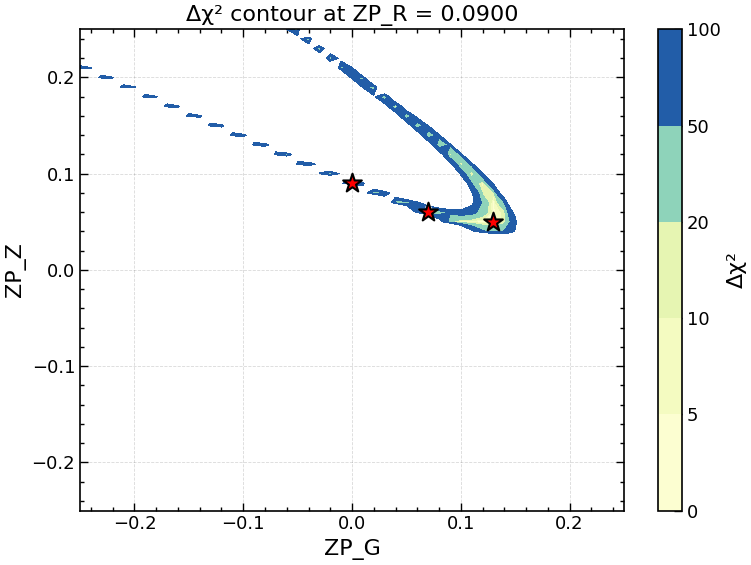


For ZP_R = 0.0800:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.0900       0.1000       0.0070      
2      0.0500       0.1400       0.0966      


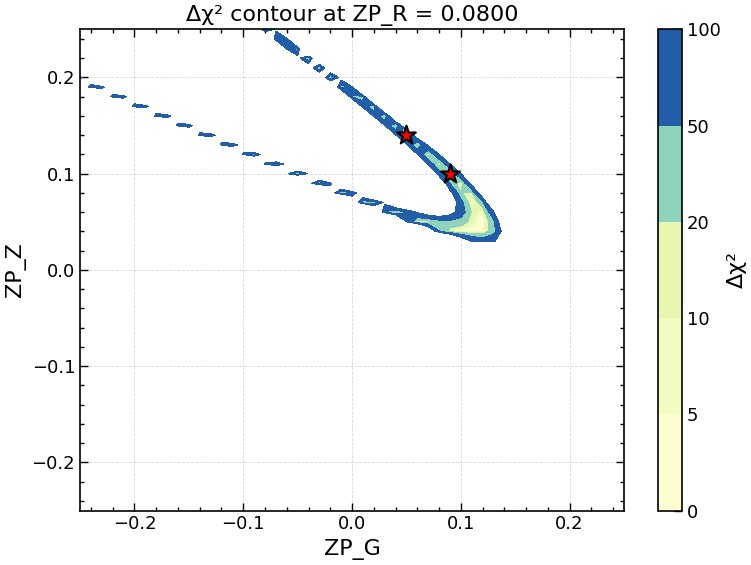


For ZP_R = 0.0700:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.0600       0.0400       0.0012      
2      -0.0800      0.1000       0.1360      


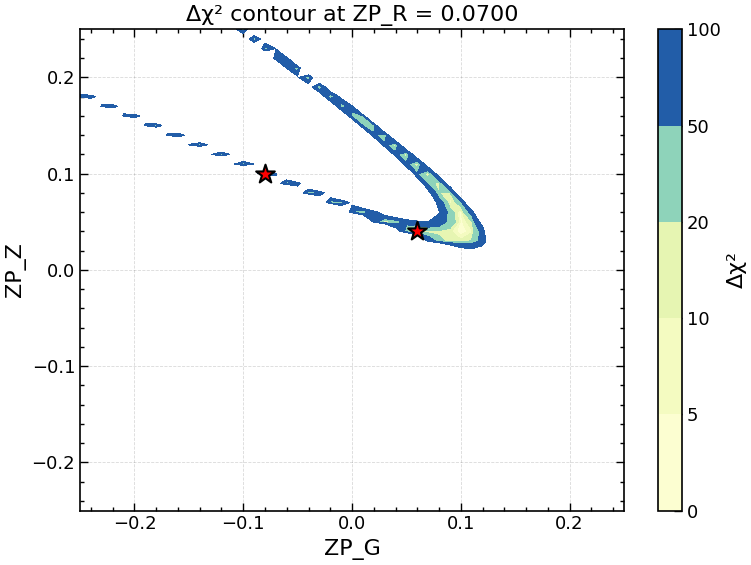


For ZP_R = 0.0600:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0300      0.1700       0.0050      
2      0.0800       0.0600       0.0145      
3      -0.1700      0.1300       0.0507      
4      0.0600       0.0300       0.1602      


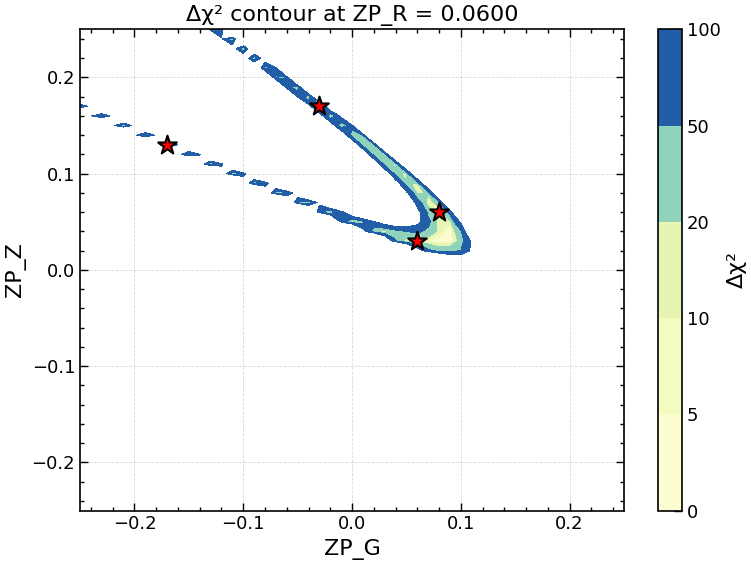


For ZP_R = 0.0400:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1600      0.2400       0.0001      
2      -0.0100      0.1100       0.0143      
3      0.0200       0.0800       0.0184      
4      -0.0800      0.0600       0.0256      
5      0.0200       0.0200       0.0454      
6      0.0000       0.1000       0.0644      
7      0.0100       0.0900       0.1123      
8      0.0300       0.0700       0.1451      


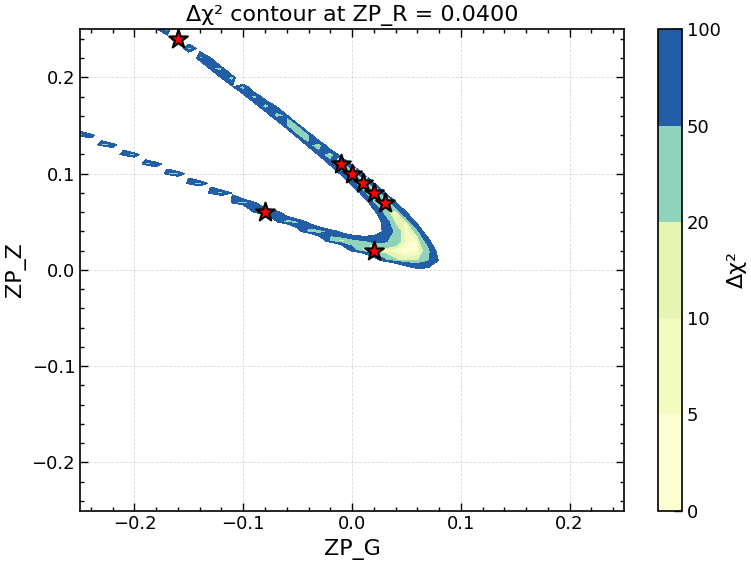


For ZP_R = 0.0300:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1300      0.0700       0.0000      
2      -0.1600      0.2200       0.0012      
3      0.0400       0.0200       0.0044      
4      0.0300       0.0100       0.0126      
5      -0.0900      0.1600       0.0219      


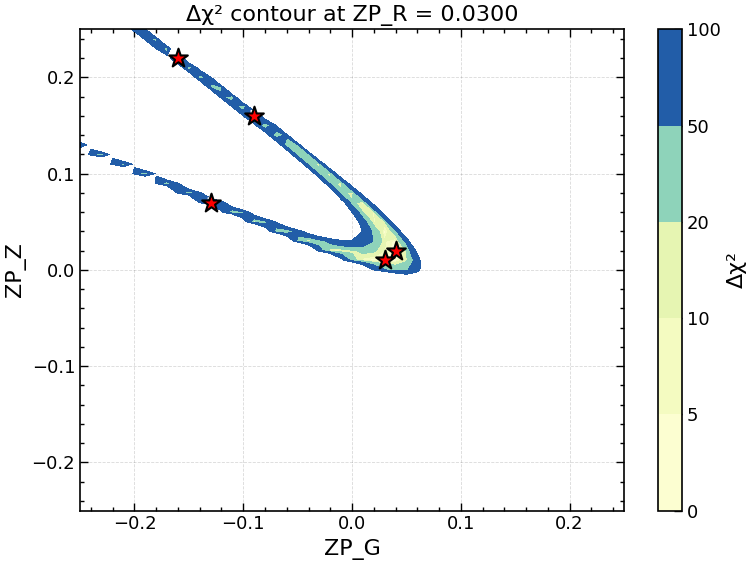


For ZP_R = 0.0200:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1600      0.2000       0.0000      
2      -0.2000      0.0900       0.0006      
3      -0.0200      0.0100       0.1242      
4      -0.2200      0.2500       0.1804      


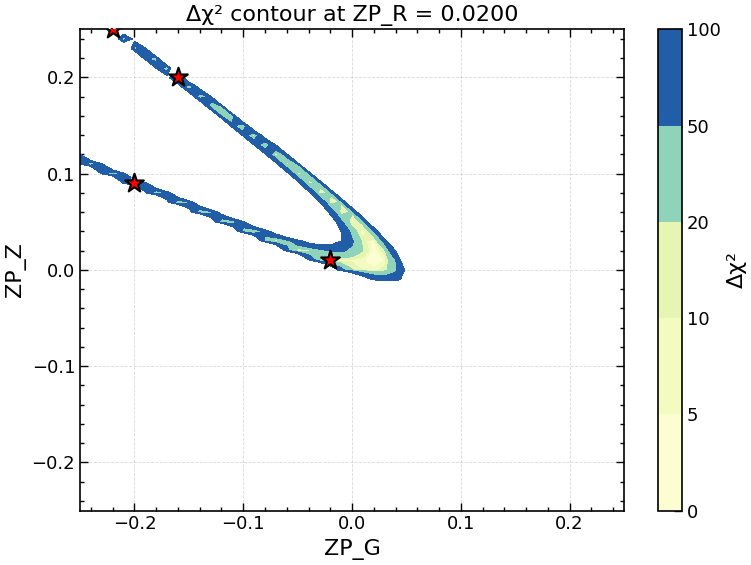


For ZP_R = 0.0100:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      0.0000       0.0000       0.0034      
2      -0.0700      0.1000       0.0040      
3      -0.1000      0.0300       0.0437      
4      -0.0100      0.0000       0.1413      


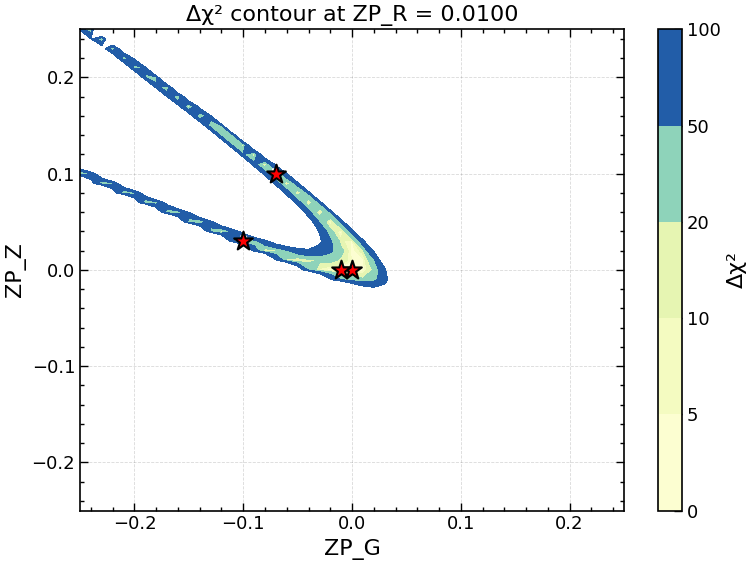


For ZP_R = 0.0000:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1500      0.1500       0.0083      
2      -0.2200      0.2100       0.0297      


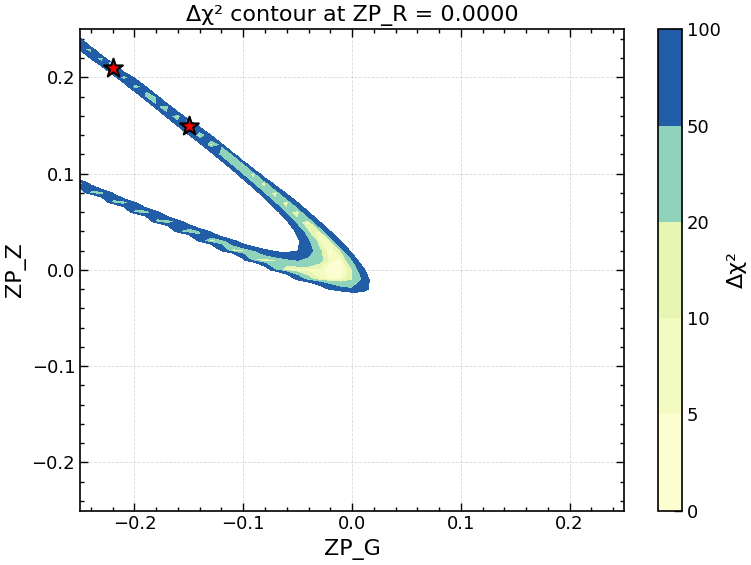


For ZP_R = -0.0100:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0500      -0.0100      0.0015      
2      -0.2000      0.0500       0.0056      
3      -0.1400      0.1200       0.0075      
4      -0.0300      0.0000       0.0106      
5      -0.0400      -0.0100      0.0184      
6      -0.0400      0.0200       0.0603      
7      -0.2200      0.1900       0.0922      


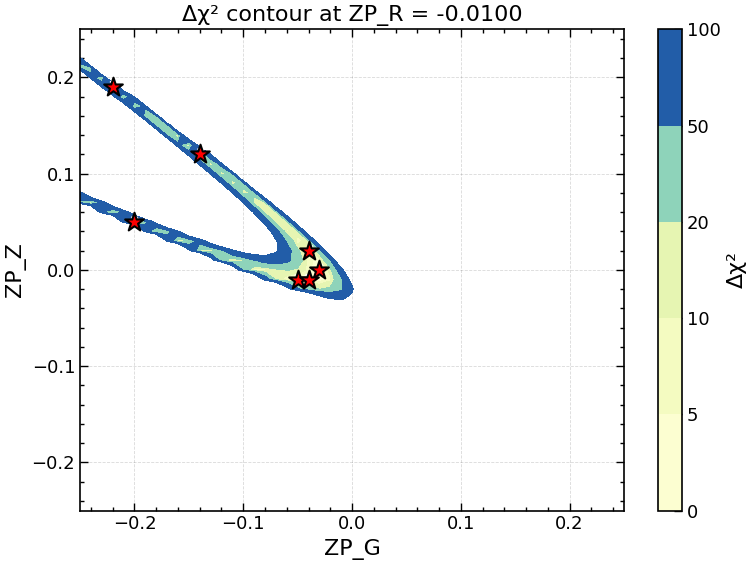


For ZP_R = -0.0200:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1400      0.0100       0.0035      
2      -0.0500      0.0000       0.0133      
3      -0.0500      -0.0100      0.0564      
4      -0.1200      0.0800       0.0644      
5      -0.1300      0.0900       0.1271      
6      -0.0700      0.0300       0.1702      


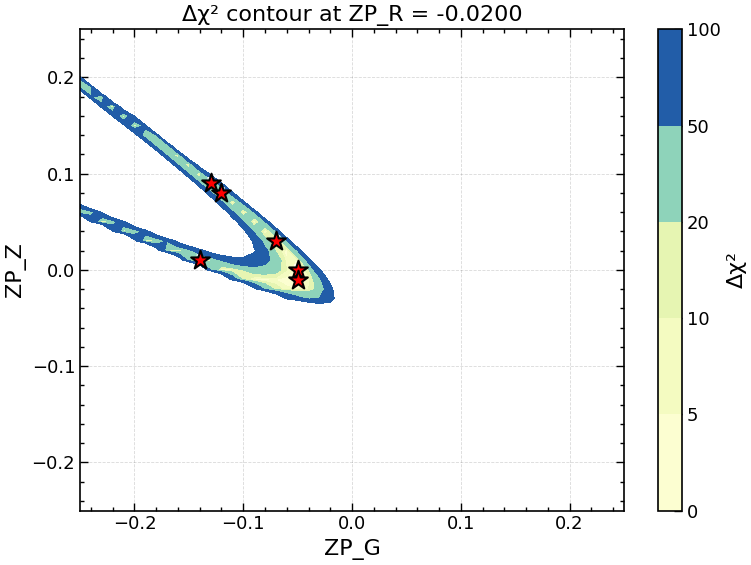


For ZP_R = -0.0300:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0700      0.0000       0.0001      
2      -0.0800      -0.0200      0.0424      
3      -0.1900      0.0200       0.0623      
4      -0.2100      0.1400       0.1076      


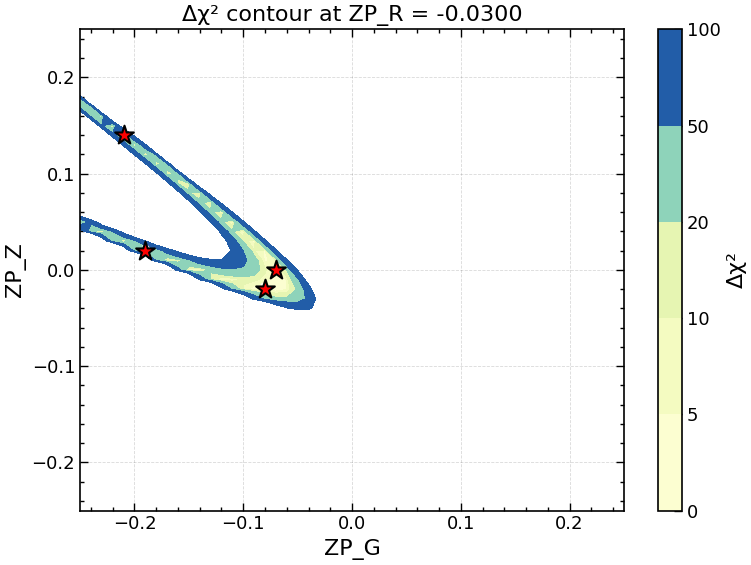


For ZP_R = -0.0400:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1900      0.1000       0.0007      
2      -0.0900      -0.0200      0.0056      
3      -0.1700      0.0000       0.1538      


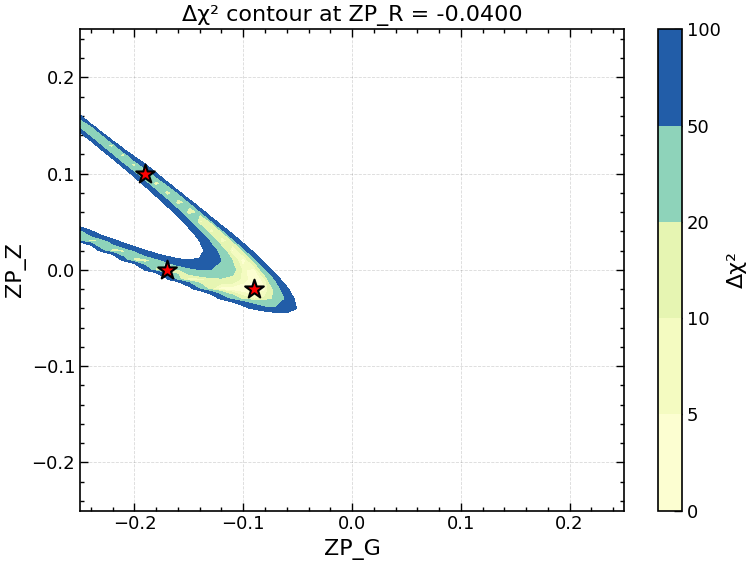


For ZP_R = -0.0500:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1500      0.0400       0.0126      
2      -0.1100      -0.0100      0.0387      
3      -0.1600      0.0500       0.0512      
4      -0.1400      0.0300       0.0531      
5      -0.1100      -0.0200      0.0729      


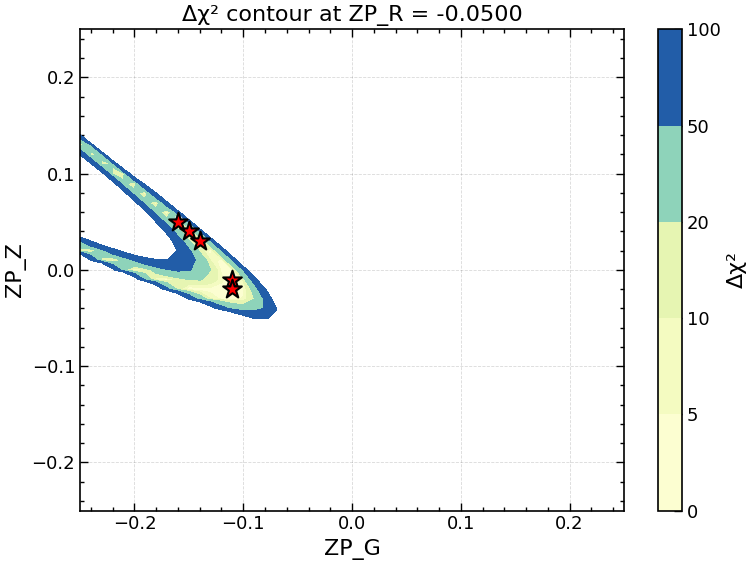


For ZP_R = -0.0600:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1300      -0.0200      0.0002      
2      -0.2500      0.1100       0.0056      


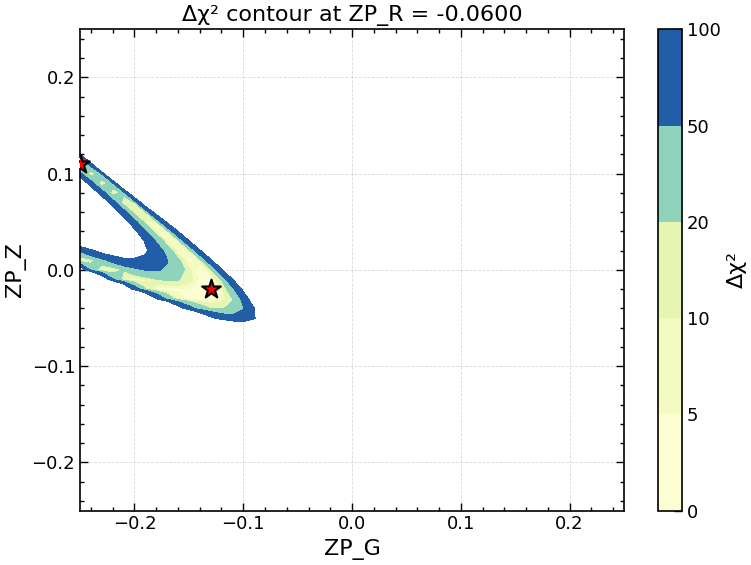


For ZP_R = -0.0700:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1800      0.0200       0.0133      
2      -0.2200      0.0600       0.0341      
3      -0.2300      0.0700       0.0375      
4      -0.2000      -0.0200      0.0644      
5      -0.1700      0.0100       0.0972      
6      -0.2100      0.0500       0.1602      


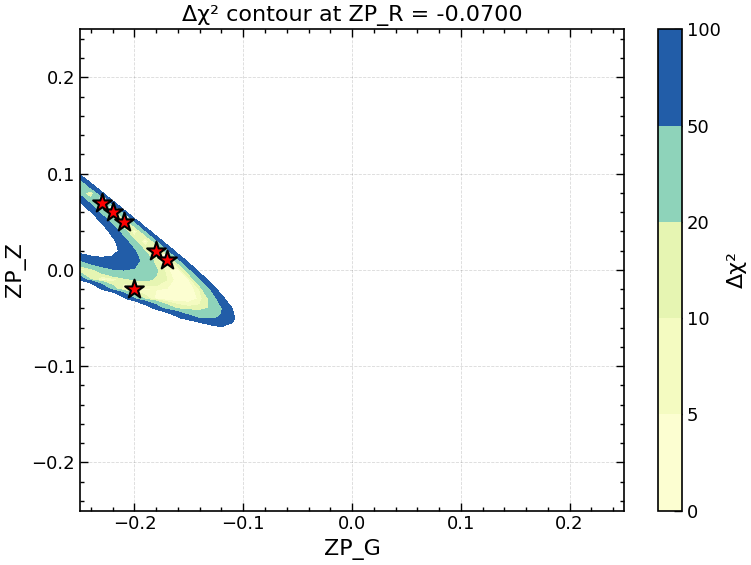


For ZP_R = -0.0800:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1800      -0.0100      0.0780      
2      -0.1900      -0.0300      0.1483      


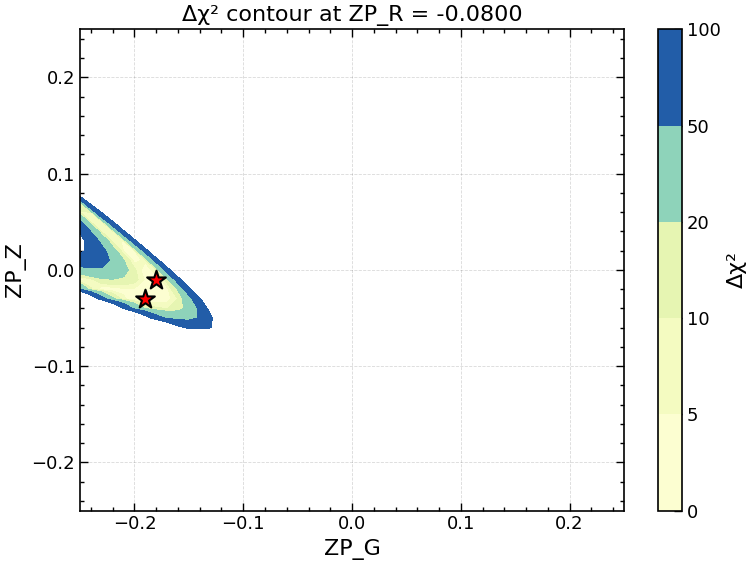


For ZP_R = -0.0900:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.2300      0.0200       0.0009      
2      -0.2500      -0.0200      0.0050      
3      -0.2400      0.0300       0.0623      
4      -0.2500      0.0400       0.1235      


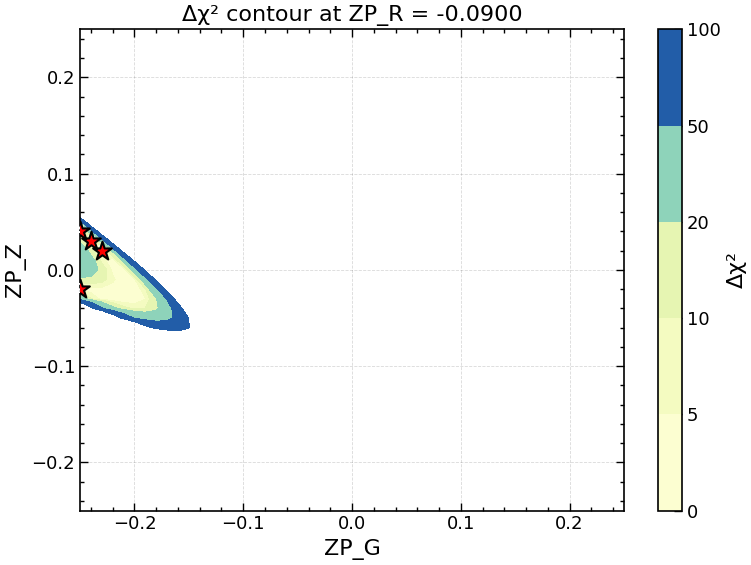


For ZP_R = -0.1000:
Rank   ZP_G         ZP_Z         Δχ²         
---------------------------------------------
1      -0.2400      0.0000       0.0115      
2      -0.2300      -0.0200      0.0176      


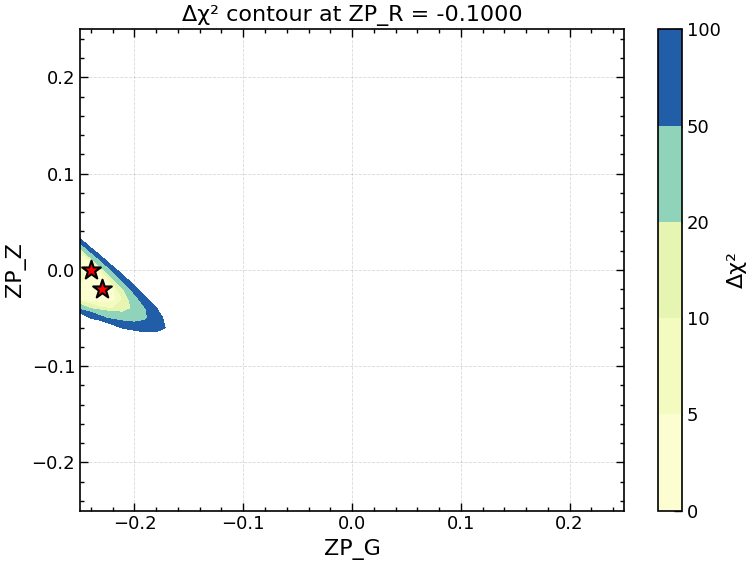

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

chi = chi_square_num_objects - np.nanmin(chi_square_num_objects)
grid = grid_values

# Find global 200 minimum chi-square values
min_200_indices = np.argsort(chi.ravel())[:100]
min_200_values = chi.ravel()[min_200_indices]
min_200_threshold = min_200_values[-1]

for k in range(len(grid)):
    slice_2d = chi[:, k, :] 
    slice_2d = np.where(np.isinf(slice_2d), np.nan, slice_2d)
    X, Y = np.meshgrid(grid, grid, indexing='ij')
    
    # Find 5 minimum chi-square values in this slice
    valid_mask_slice = ~np.isnan(slice_2d) & ~np.isinf(slice_2d)
    valid_chi = slice_2d[valid_mask_slice]
    valid_indices = np.where(valid_mask_slice)
    
    if len(valid_chi) > 0:
        n_min = min(10, len(valid_chi))
        min_indices = np.argpartition(valid_chi, n_min - 1)[:n_min]
        
        min_i = valid_indices[0][min_indices]
        min_j = valid_indices[1][min_indices]
        min_chi_values = valid_chi[min_indices]
        
        # Sort by chi-square value
        sort_order = np.argsort(min_chi_values)
        min_i = min_i[sort_order]
        min_j = min_j[sort_order]
        min_chi_values = min_chi_values[sort_order]
        
        # Check if any of the 5 minima are in top 200 global minima
        if np.any(min_chi_values <= min_200_threshold):

            fig, ax = plt.subplots(figsize=(8, 6))
            cs = ax.contourf(X, Y, slice_2d, levels=[0, 5, 10, 20, 50, 100], cmap='YlGnBu')
            plt.colorbar(cs, ax=ax, label='Δχ²')
            
            # Plot the 5 minimum points
            for idx, (i, j, chi_val) in enumerate(zip(min_i, min_j, min_chi_values)):
                if chi_val <= min_200_threshold:
                    ax.scatter(grid[i], grid[j], c='red', s=200, marker='*', 
                            edgecolors='black', linewidths=1.5, zorder=10)
                    ax.text(grid[i], grid[j], f'{idx+1}', fontsize=10, ha='center', 
                        va='center', color='white', fontweight='bold')
            
            ax.set_title(f"Δχ² contour at ZP_R = {grid[k]:.4f}")
            ax.set_xlabel("ZP_G")
            ax.set_ylabel("ZP_Z")
            
            # Print the coordinates of the 5 minima
            print(f"\nFor ZP_R = {grid[k]:.4f}:")
            print(f"{'Rank':<6} {'ZP_G':<12} {'ZP_Z':<12} {'Δχ²':<12}")
            print("-" * 45)
            for idx, (i, j, chi_val) in enumerate(zip(min_i, min_j, min_chi_values)):
                if chi_val <= min_200_threshold:
                    print(f"{idx+1:<6} {grid[i]:<12.4f} {grid[j]:<12.4f} {chi_val:<12.4f}")
            
            plt.tight_layout()
            plt.show()

In [ ]:
slice_2d

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])


For ZP_G = 0.2500:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1900       0.1800       0.0691      


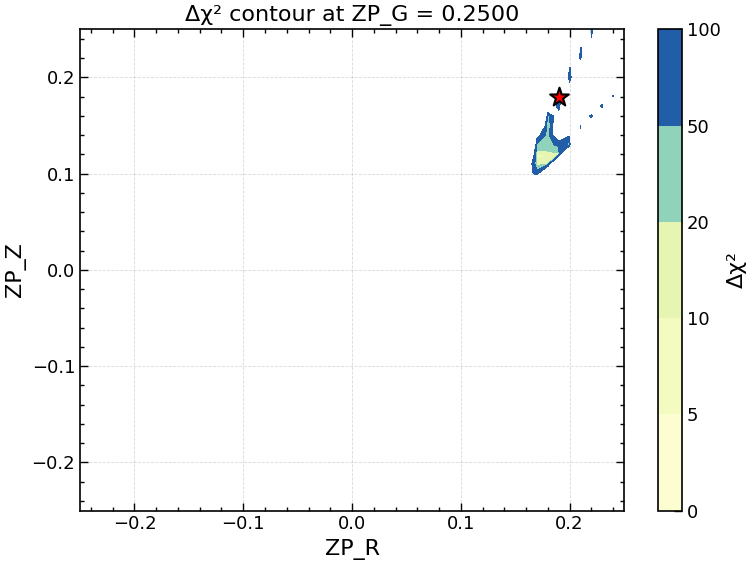


For ZP_G = 0.2300:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1800       0.1800       0.0735      


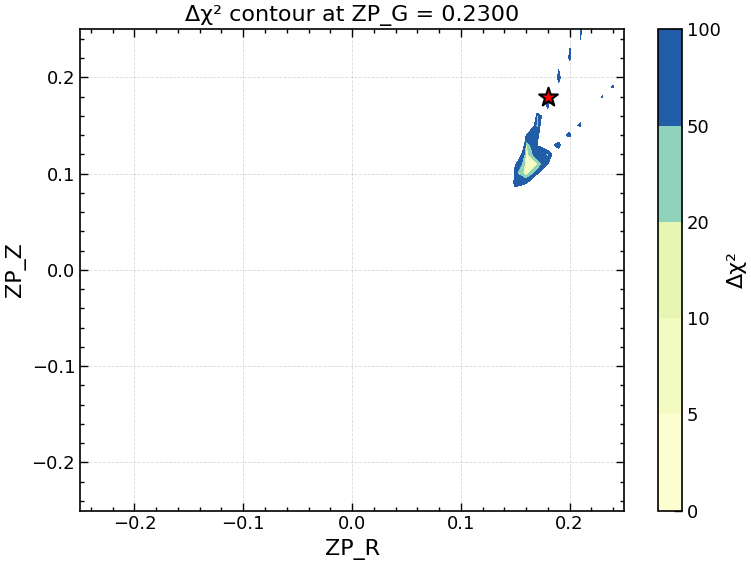


For ZP_G = 0.2200:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1900       0.1300       0.0780      


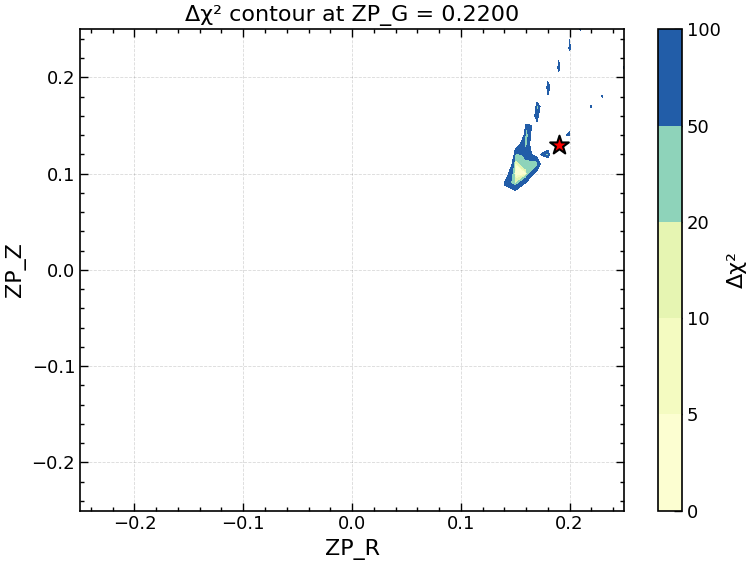


For ZP_G = 0.2100:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.2400       0.2000       0.1578      


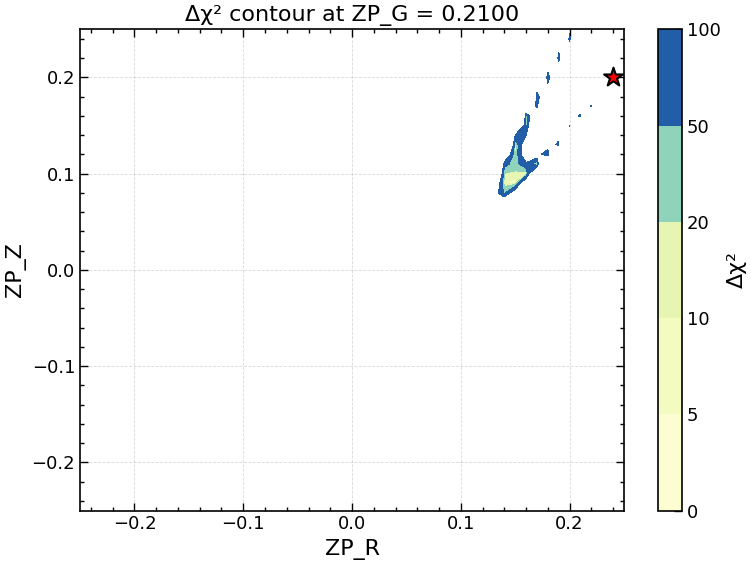


For ZP_G = 0.2000:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.2000       0.1500       0.0441      


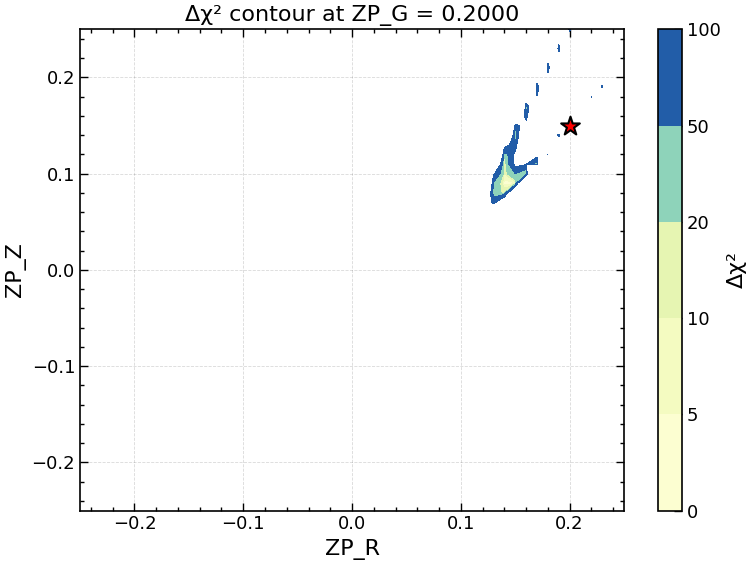


For ZP_G = 0.1800:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1900       0.2500       0.0531      


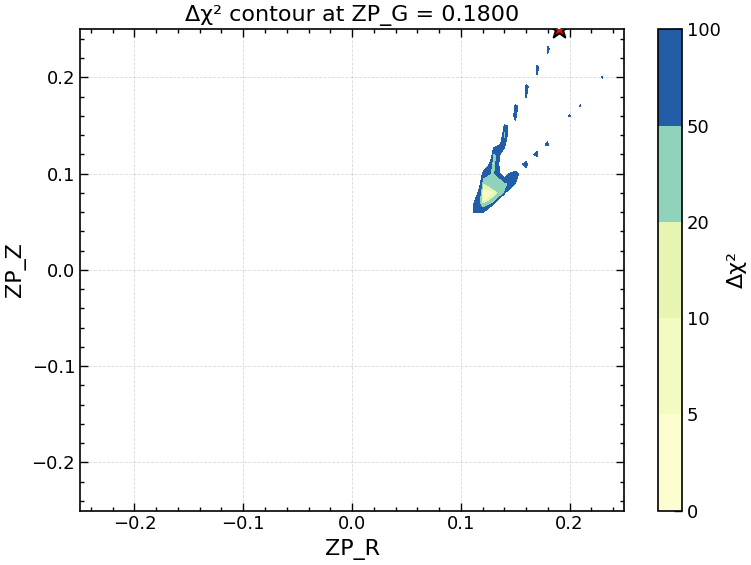


For ZP_G = 0.1700:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1200       0.0700       0.0198      
2      0.1200       0.1000       0.0751      


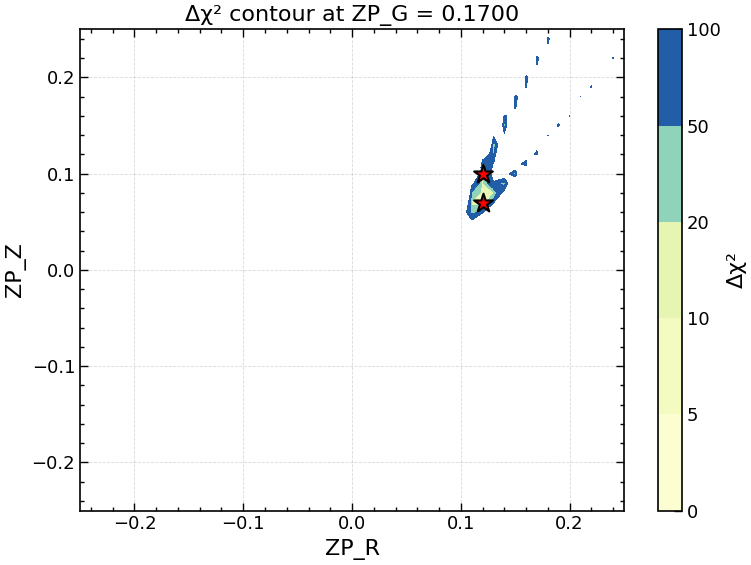


For ZP_G = 0.1600:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1800       0.1400       0.1611      


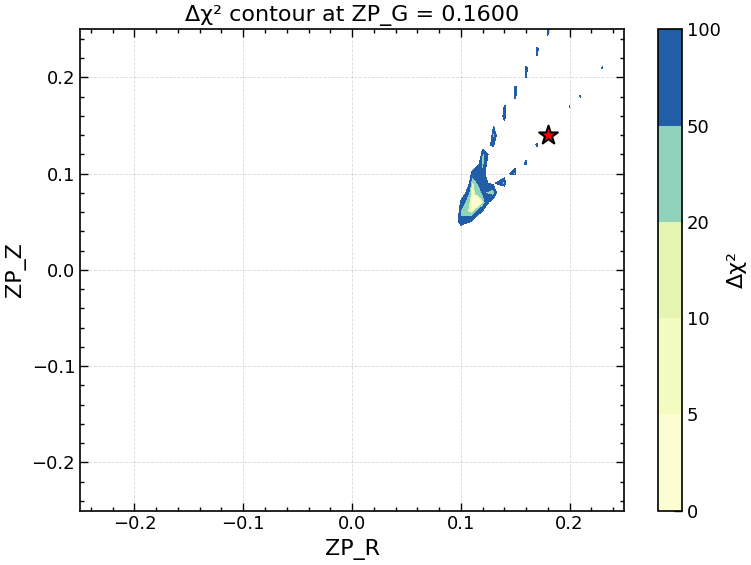


For ZP_G = 0.1500:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1200       0.0700       0.1451      


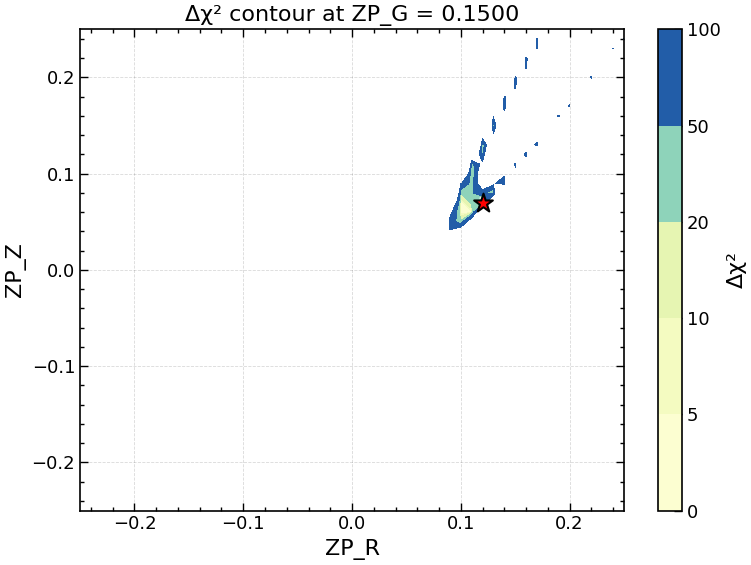


For ZP_G = 0.1400:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1200       0.1400       0.1643      


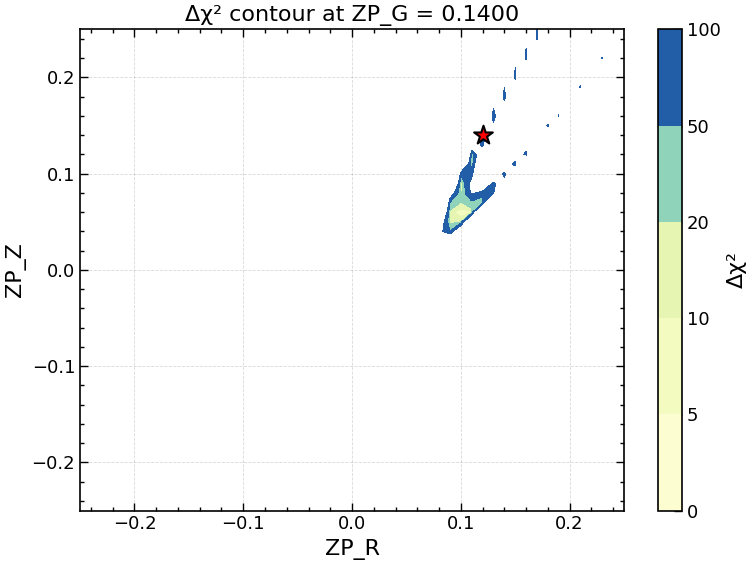


For ZP_G = 0.1300:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0900       0.0500       0.0003      
2      0.1400       0.1000       0.0056      
3      0.1200       0.1500       0.0057      


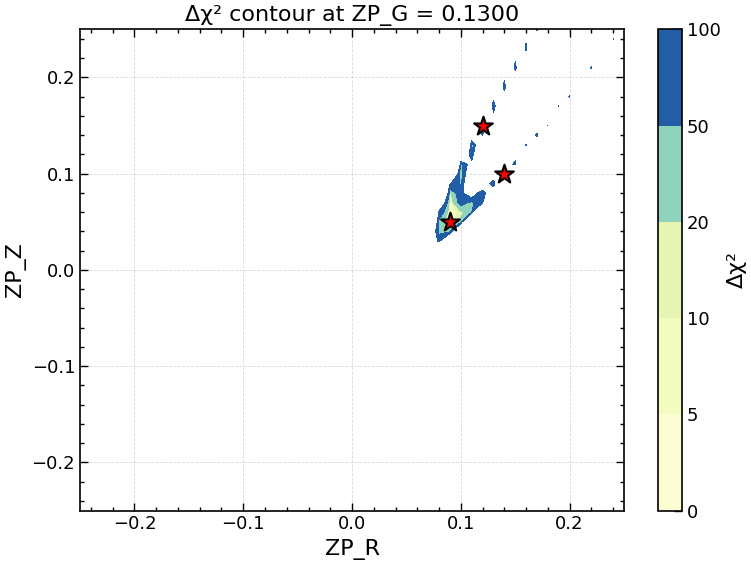


For ZP_G = 0.1200:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1200       0.1600       0.0531      


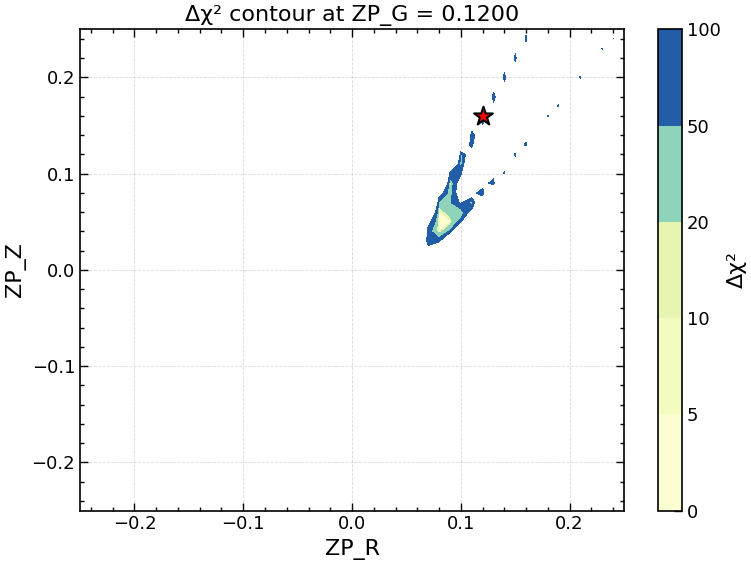


For ZP_G = 0.1100:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1300       0.1900       0.0030      
2      0.1100       0.0700       0.0222      


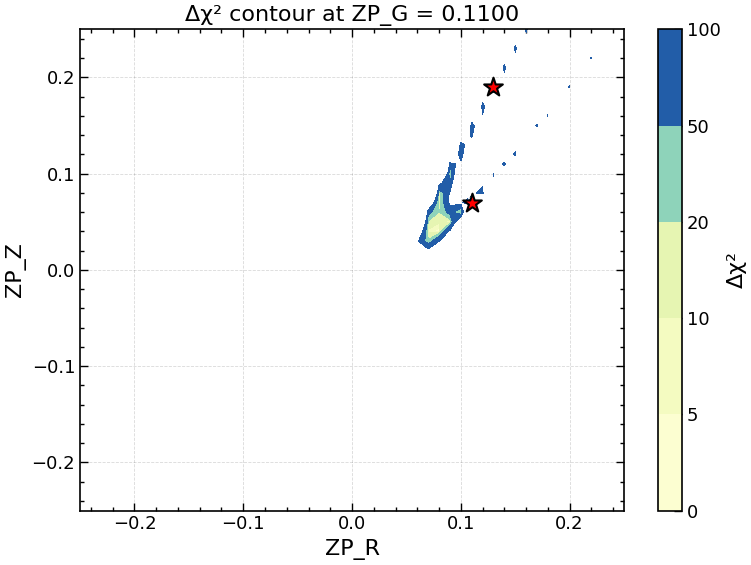


For ZP_G = 0.0900:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0800       0.1000       0.0070      
2      0.2000       0.2000       0.0207      


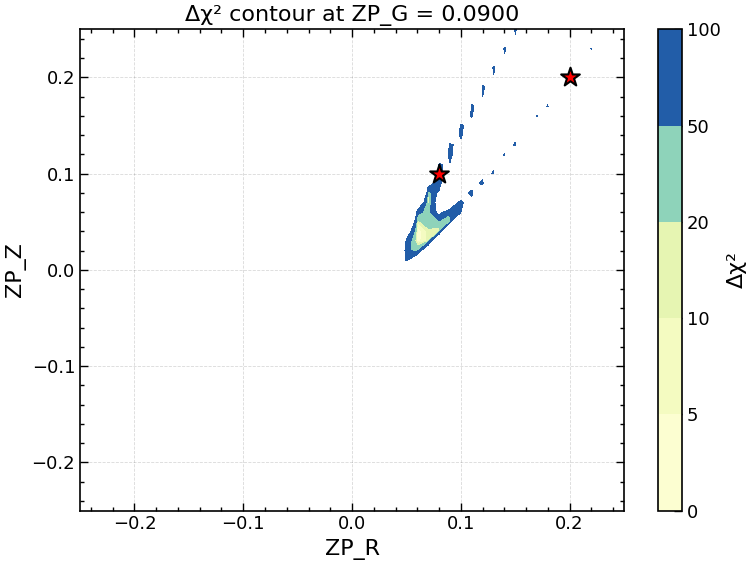


For ZP_G = 0.0800:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0600       0.0600       0.0145      


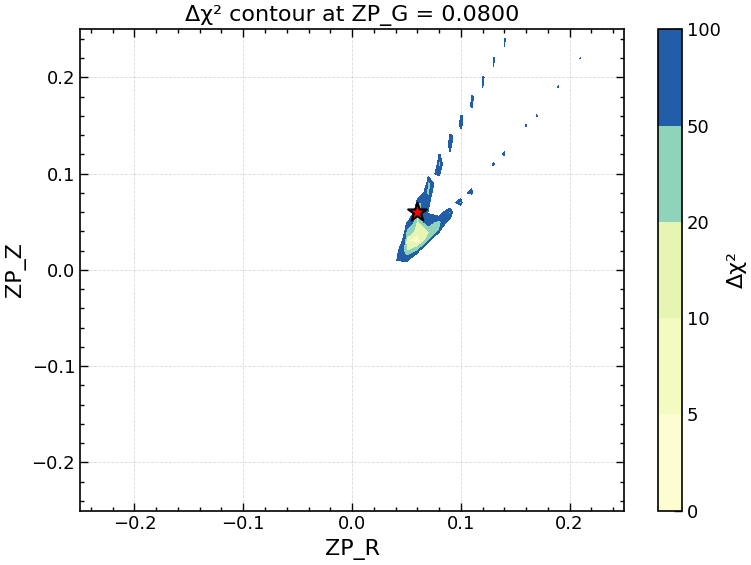


For ZP_G = 0.0700:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0900       0.0600       0.1546      


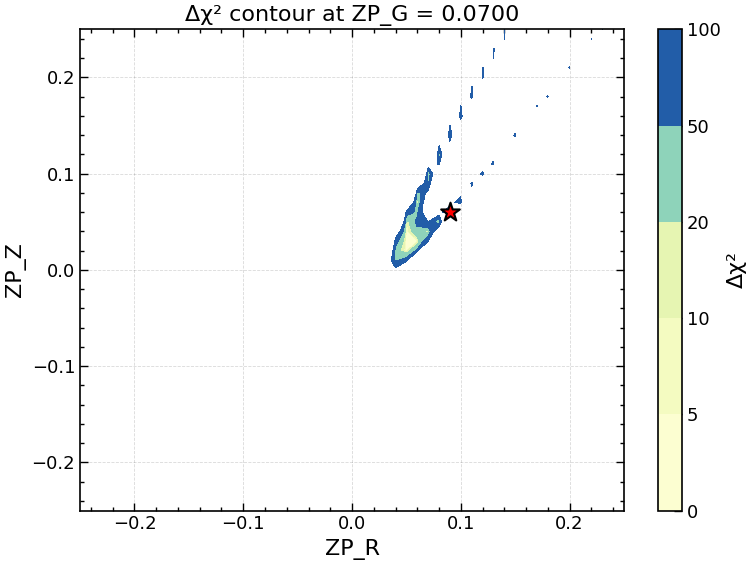


For ZP_G = 0.0600:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0700       0.0400       0.0012      
2      0.0600       0.0300       0.1602      


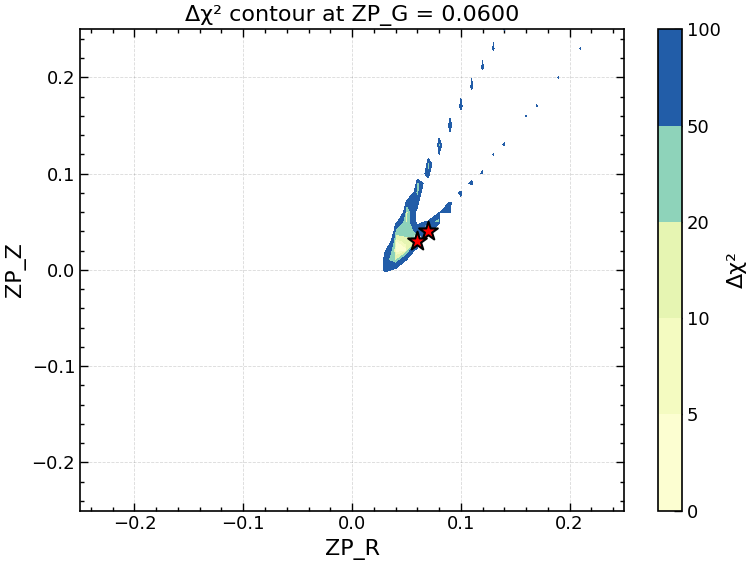


For ZP_G = 0.0500:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0800       0.1400       0.0966      


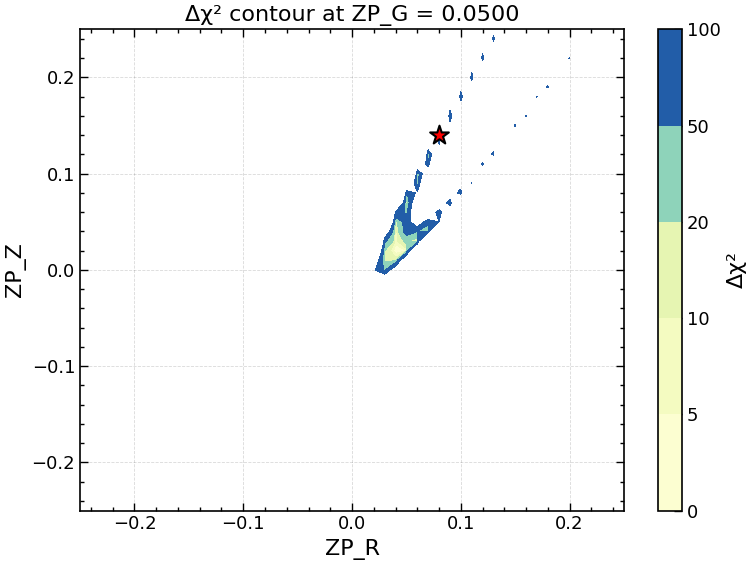


For ZP_G = 0.0400:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0300       0.0200       0.0044      
2      0.1900       0.2100       0.0564      


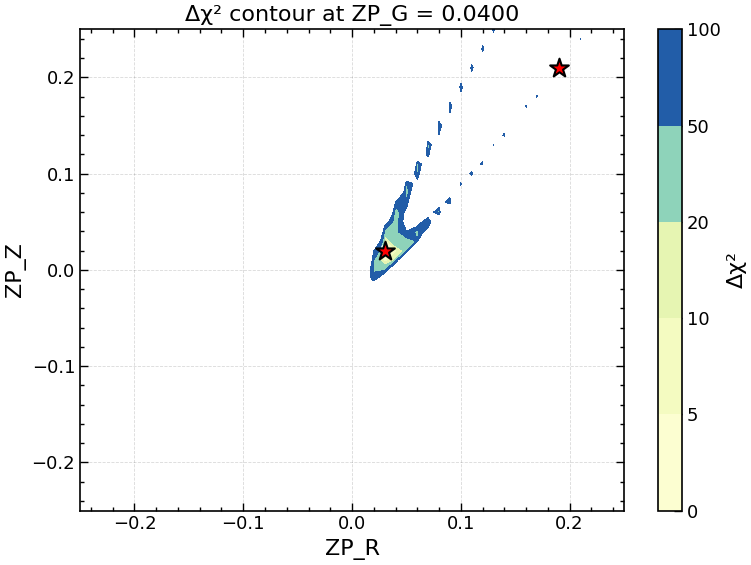


For ZP_G = 0.0300:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0300       0.0100       0.0126      
2      0.0400       0.0700       0.1451      


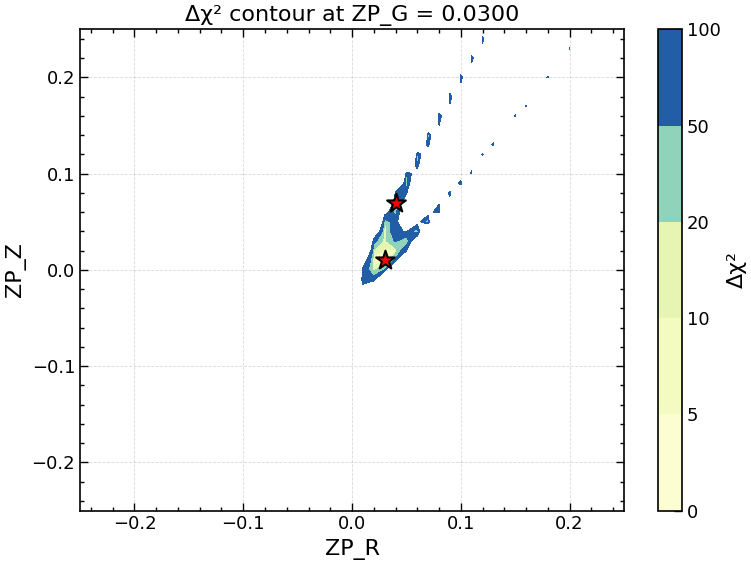


For ZP_G = 0.0200:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0400       0.0800       0.0184      
2      0.0400       0.0200       0.0454      


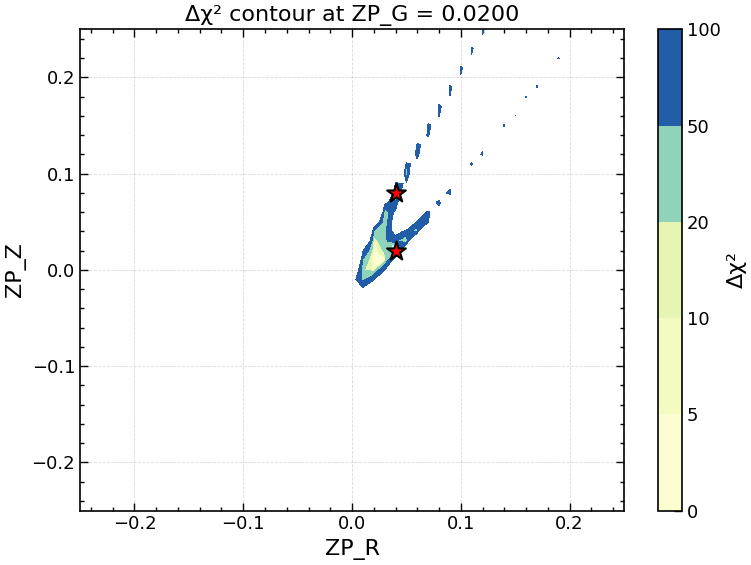


For ZP_G = 0.0100:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.1300       0.1400       0.0344      
2      0.0400       0.0900       0.1123      


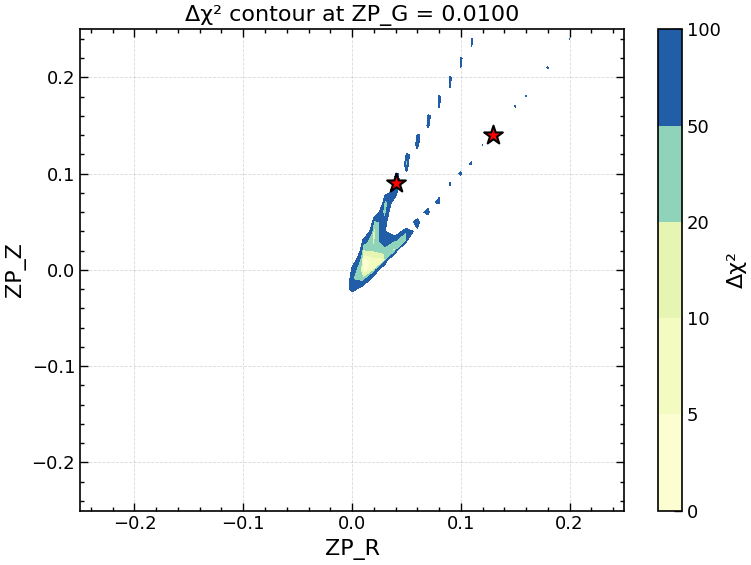


For ZP_G = 0.0000:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0100       0.0000       0.0034      
2      0.0900       0.0900       0.0283      
3      0.0400       0.1000       0.0644      


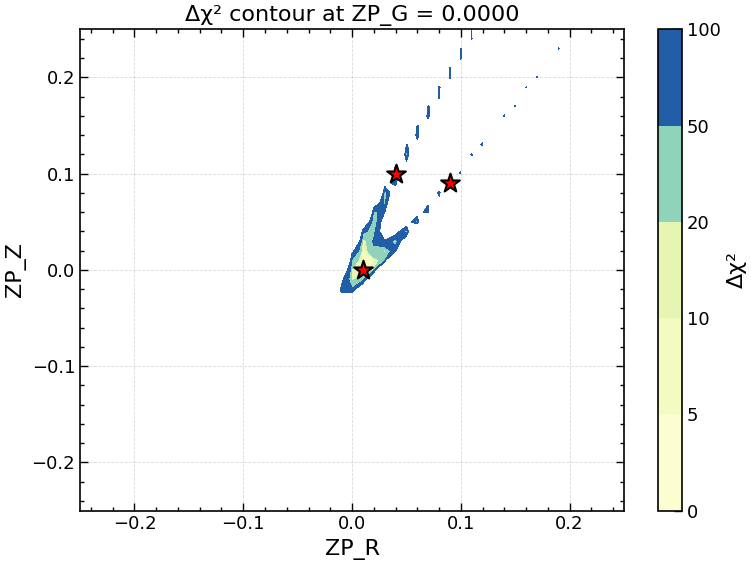


For ZP_G = -0.0100:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0400       0.1100       0.0143      
2      0.1800       0.2200       0.0210      
3      0.0100       0.0000       0.1413      


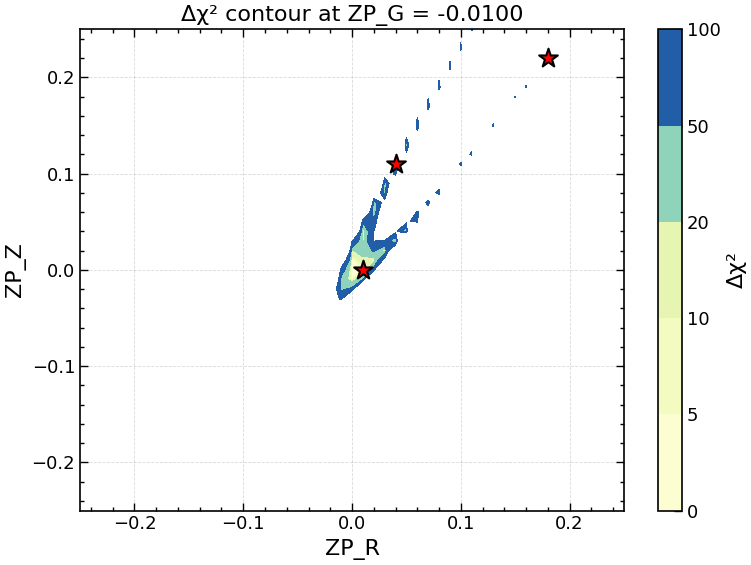


For ZP_G = -0.0200:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0200       0.0100       0.1242      


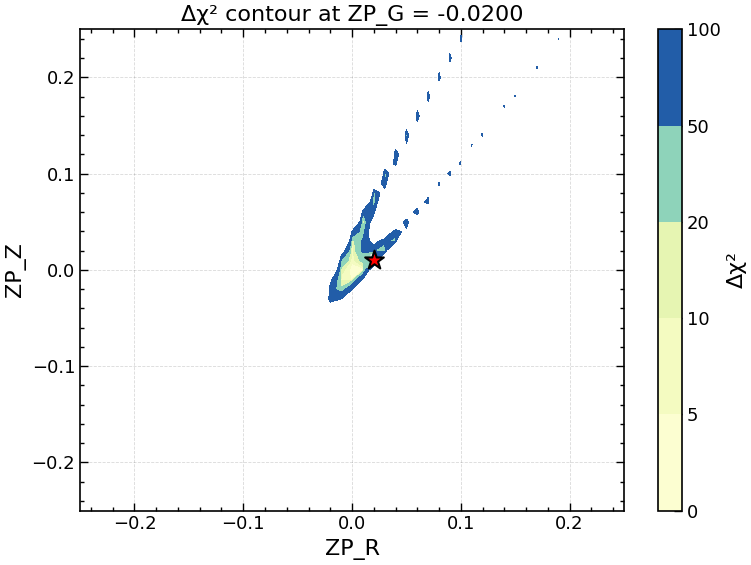


For ZP_G = -0.0300:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0600       0.1700       0.0050      
2      -0.0100      0.0000       0.0106      
3      0.1000       0.2500       0.0797      


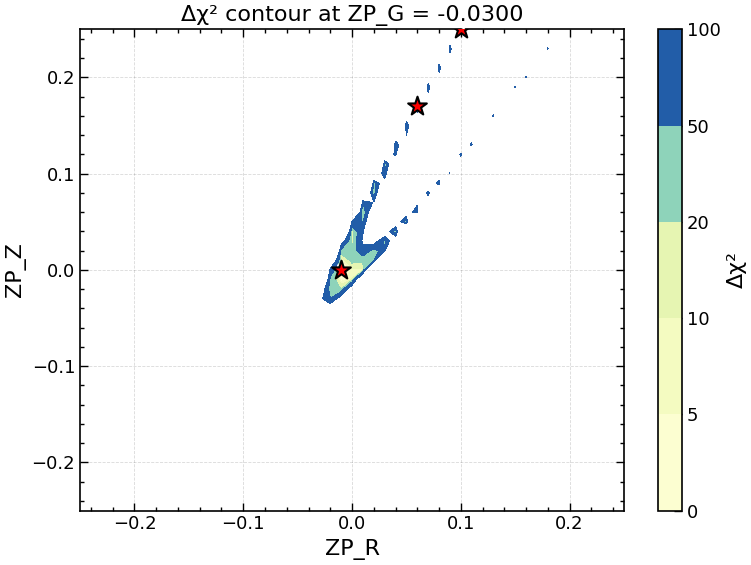


For ZP_G = -0.0400:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0100      -0.0100      0.0184      
2      -0.0100      0.0200       0.0603      
3      0.1200       0.1500       0.0629      


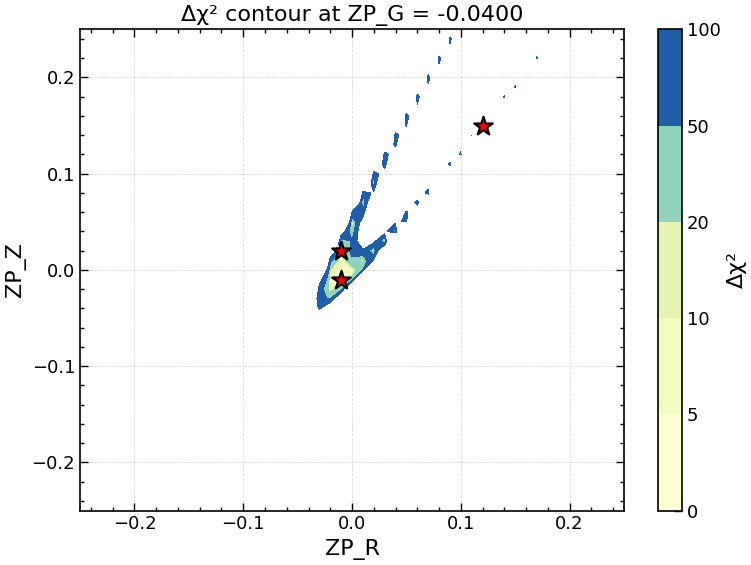


For ZP_G = -0.0500:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0100      -0.0100      0.0015      
2      -0.0200      0.0000       0.0133      
3      -0.0200      -0.0100      0.0564      


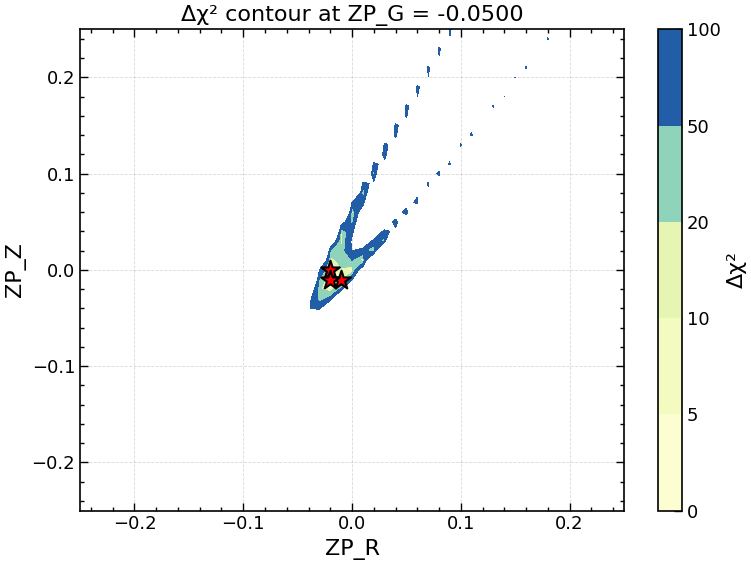


For ZP_G = -0.0700:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0300      0.0000       0.0001      
2      0.0100       0.1000       0.0040      
3      -0.0200      0.0300       0.1702      


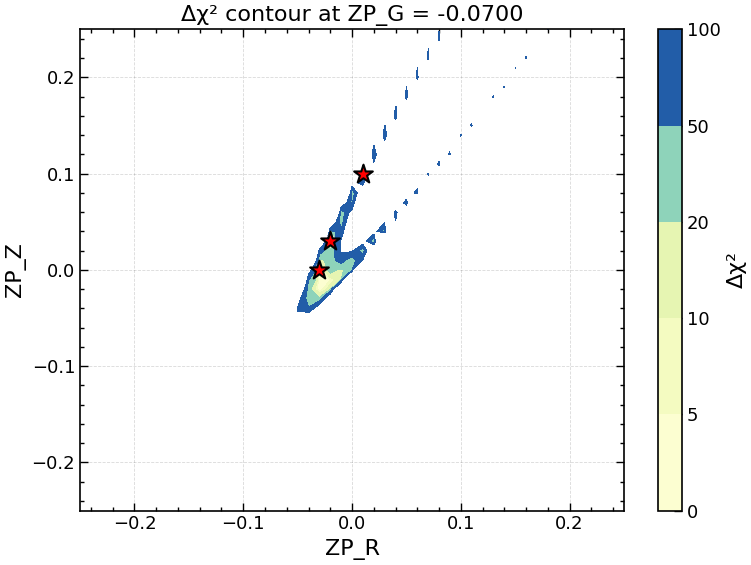


For ZP_G = -0.0800:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0400       0.0600       0.0256      
2      -0.0300      -0.0200      0.0424      
3      0.0700       0.1000       0.1360      


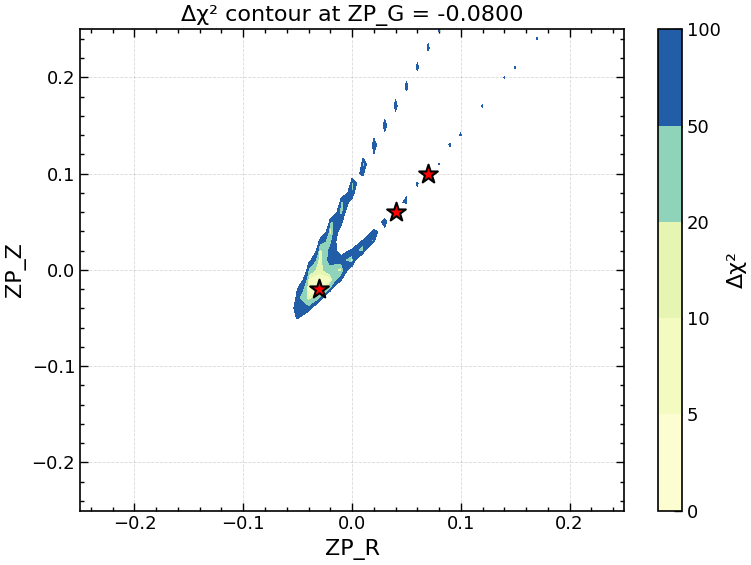


For ZP_G = -0.0900:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0400      -0.0200      0.0056      
2      0.0300       0.1600       0.0219      


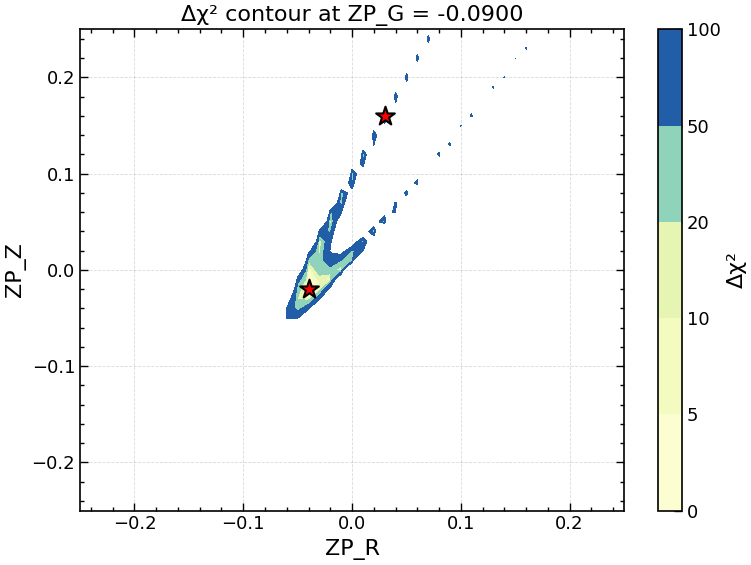


For ZP_G = -0.1000:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0100       0.0300       0.0437      
2      0.1700       0.2500       0.0922      


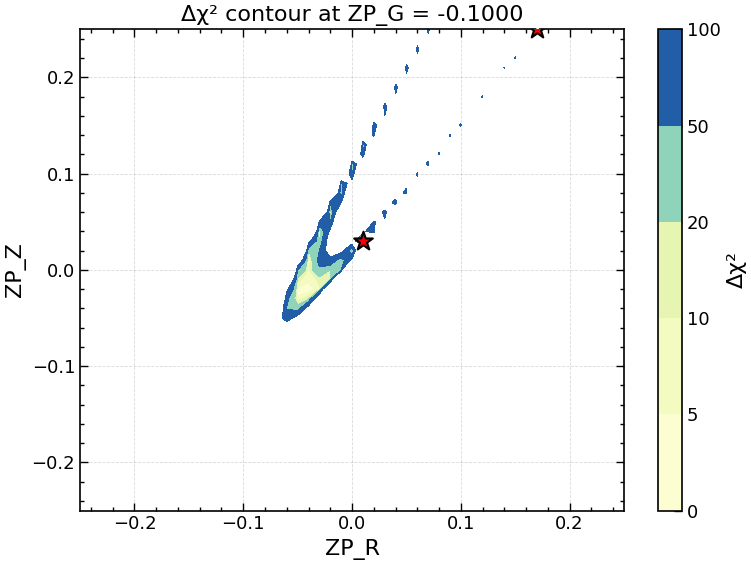


For ZP_G = -0.1100:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0500      -0.0100      0.0387      
2      -0.0500      -0.0200      0.0729      
3      0.1100       0.1700       0.0922      


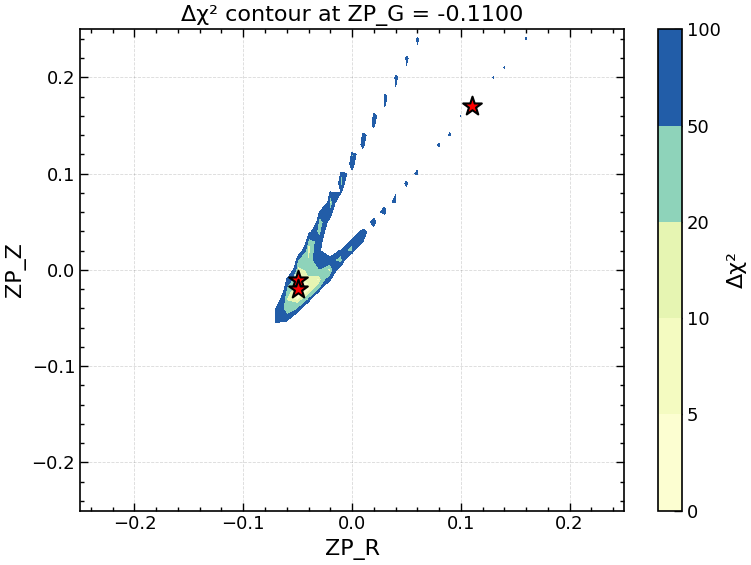


For ZP_G = -0.1200:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0200      0.0800       0.0644      


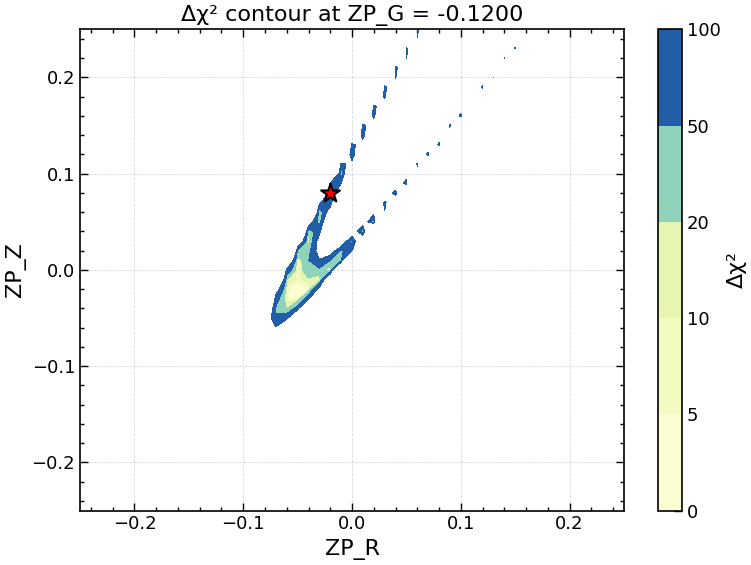


For ZP_G = -0.1300:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0300       0.0700       0.0000      
2      -0.0600      -0.0200      0.0002      
3      0.1100       0.1800       0.0729      
4      -0.0200      0.0900       0.1271      


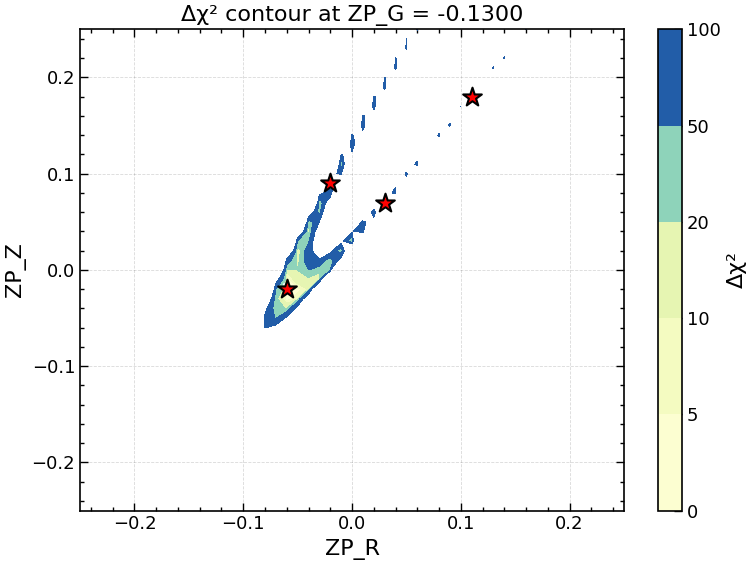


For ZP_G = -0.1400:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0200      0.0100       0.0035      
2      -0.0100      0.1200       0.0075      
3      -0.0500      0.0300       0.0531      


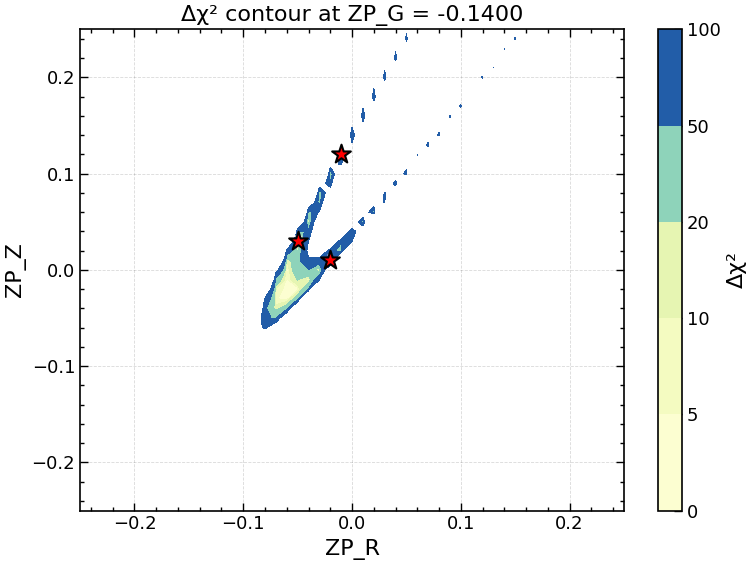


For ZP_G = -0.1500:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0000       0.1500       0.0083      
2      -0.0500      0.0400       0.0126      


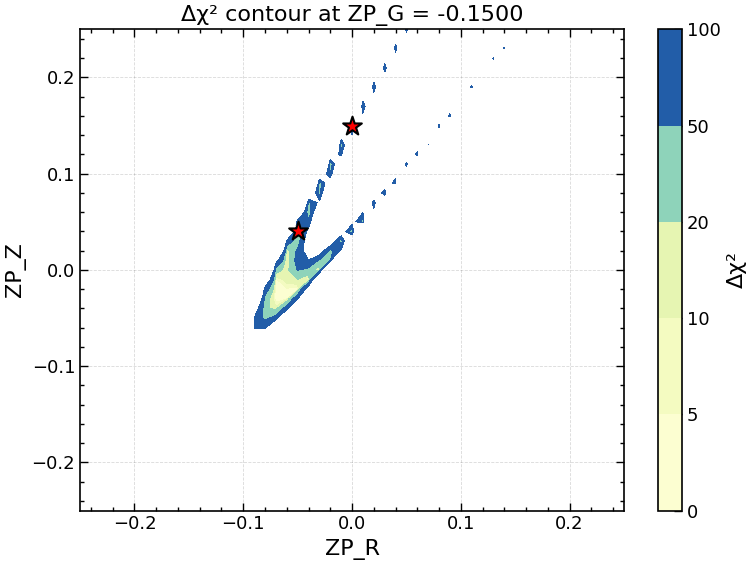


For ZP_G = -0.1600:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0200       0.2000       0.0000      
2      0.0400       0.2400       0.0001      
3      0.0300       0.2200       0.0012      
4      -0.0500      0.0500       0.0512      


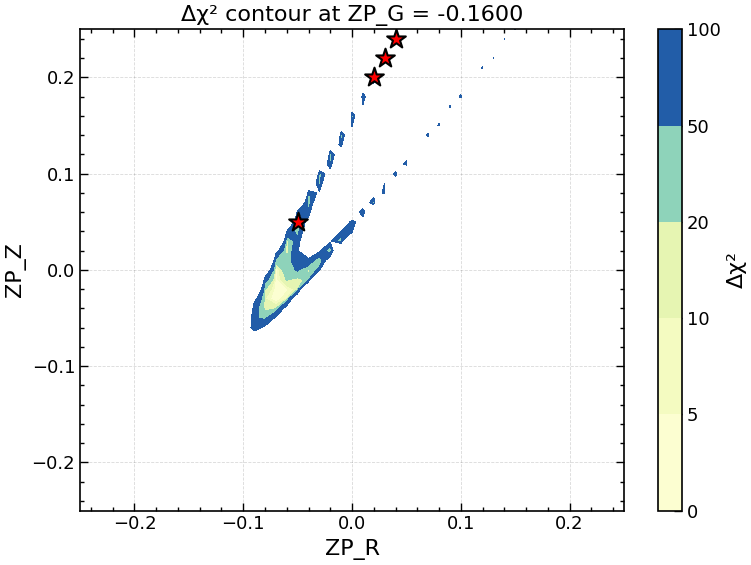


For ZP_G = -0.1700:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0600       0.1300       0.0507      
2      -0.0700      0.0100       0.0972      
3      -0.0400      0.0000       0.1538      


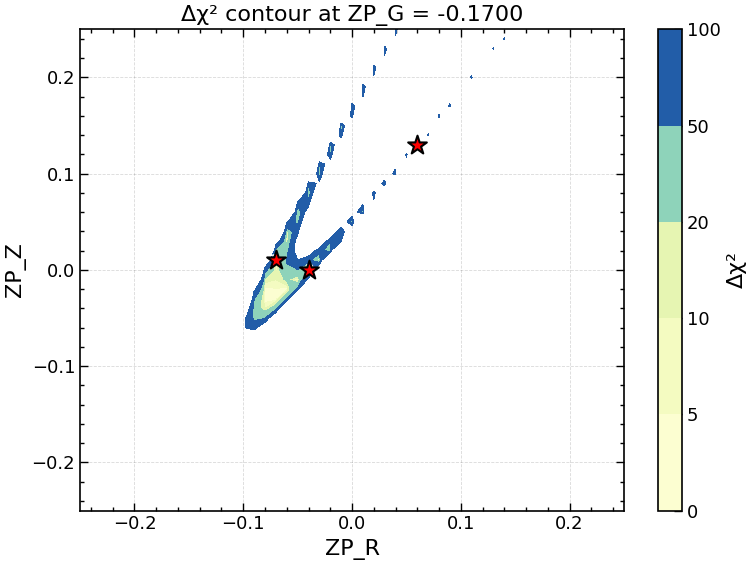


For ZP_G = -0.1800:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0700      0.0200       0.0133      
2      -0.0800      -0.0100      0.0780      


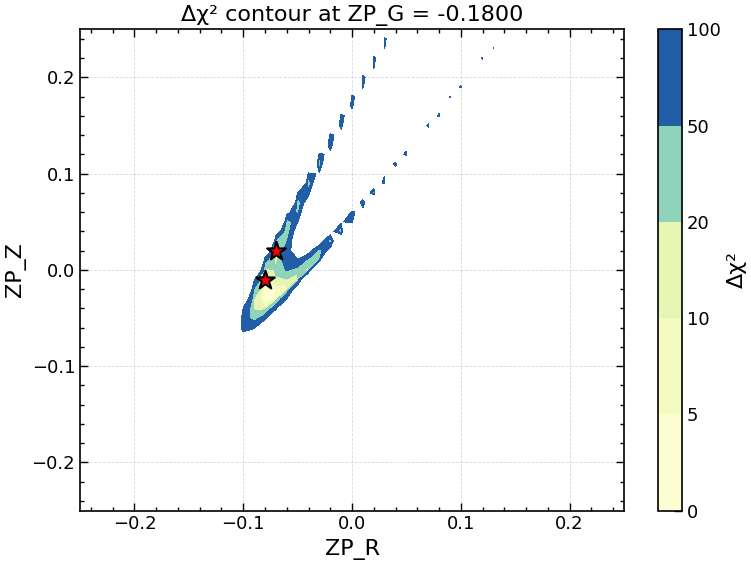


For ZP_G = -0.1900:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0400      0.1000       0.0007      
2      -0.0300      0.0200       0.0623      
3      -0.0800      -0.0300      0.1483      


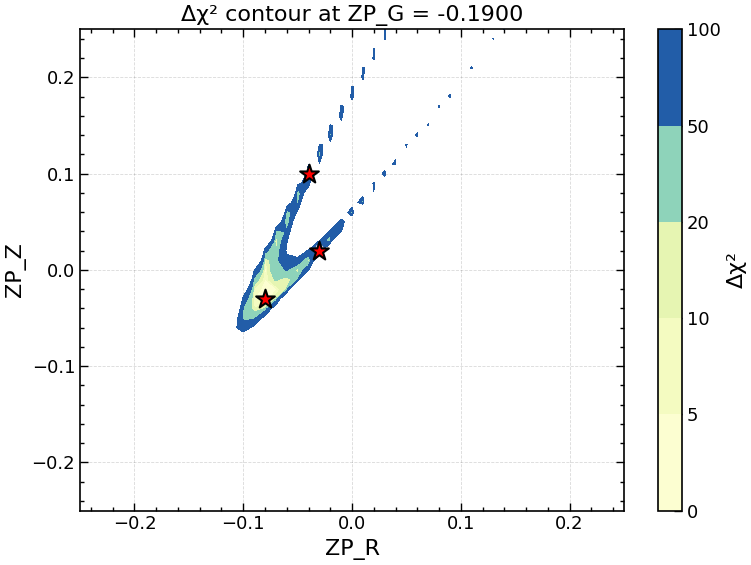


For ZP_G = -0.2000:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0200       0.0900       0.0006      
2      -0.0100      0.0500       0.0056      
3      -0.0700      -0.0200      0.0644      


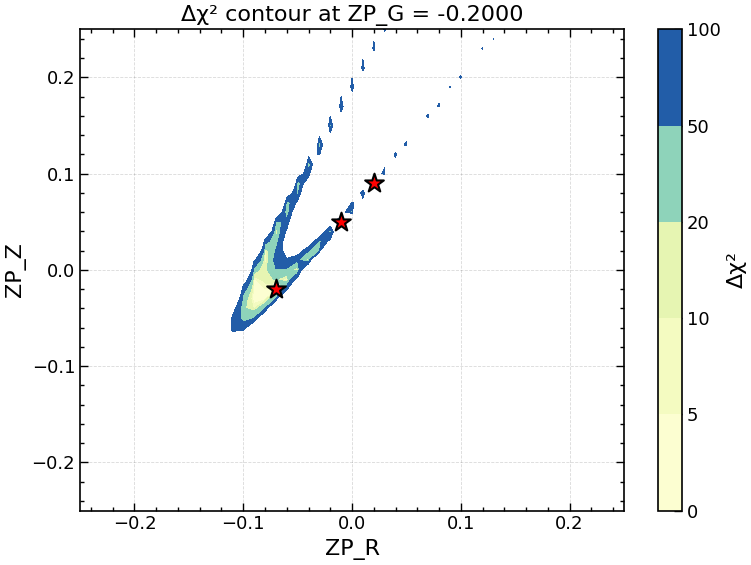


For ZP_G = -0.2100:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0300      0.1400       0.1076      
2      -0.0700      0.0500       0.1602      


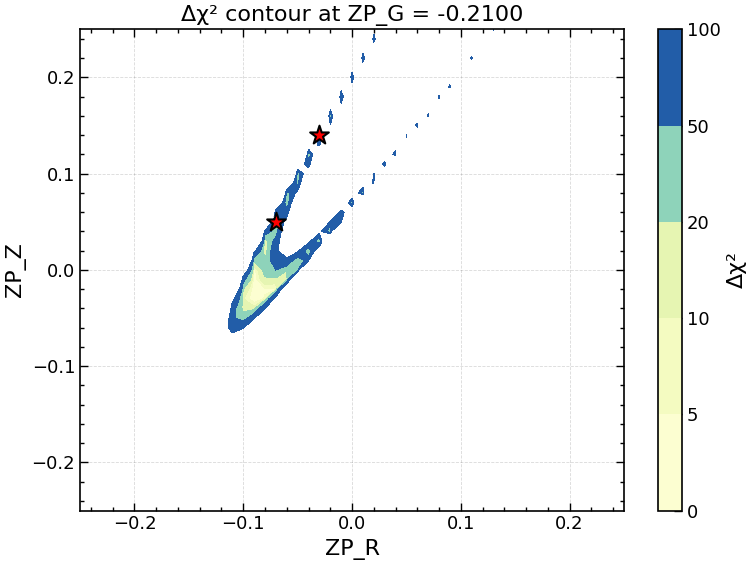


For ZP_G = -0.2200:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      0.0000       0.2100       0.0297      
2      -0.0700      0.0600       0.0341      
3      -0.0100      0.1900       0.0922      
4      0.0200       0.2500       0.1804      


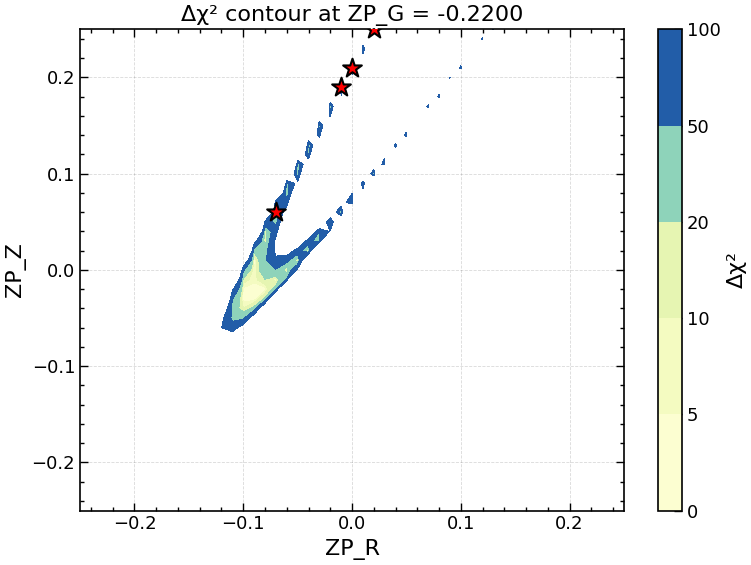


For ZP_G = -0.2300:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0900      0.0200       0.0009      
2      -0.1000      -0.0200      0.0176      
3      -0.0700      0.0700       0.0375      


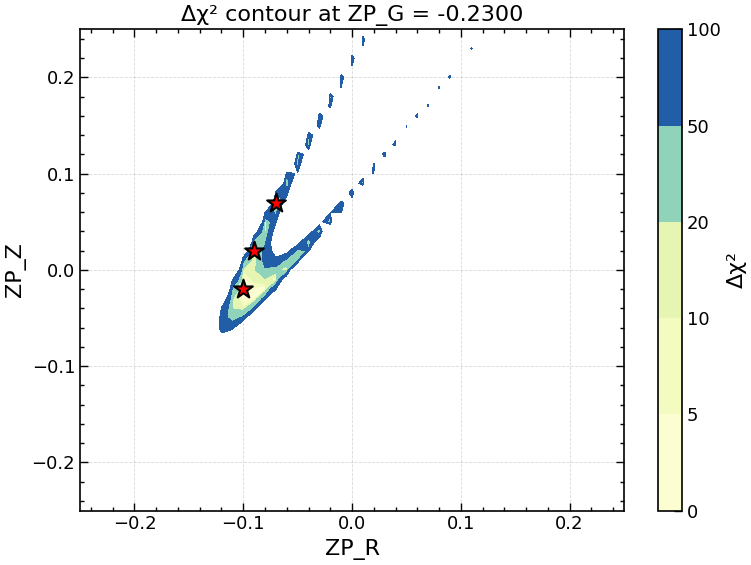


For ZP_G = -0.2400:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.1000      0.0000       0.0115      
2      -0.0900      0.0300       0.0623      


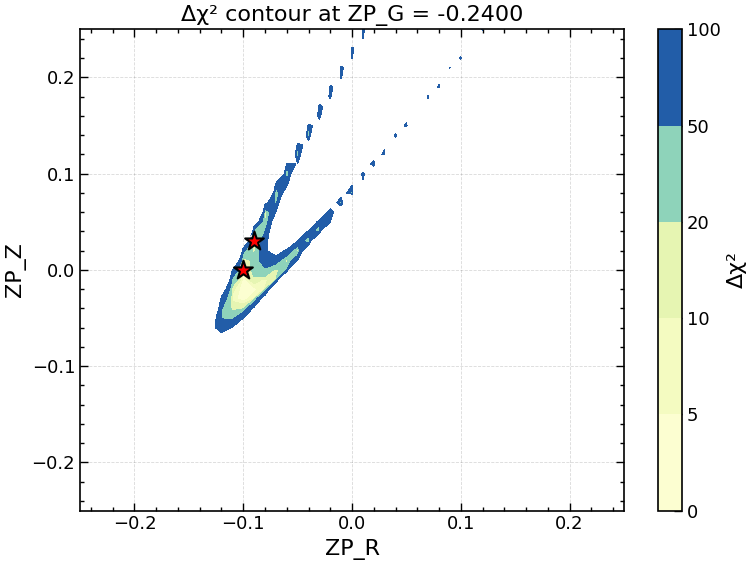


For ZP_G = -0.2500:
Rank   ZP_R         ZP_Z         Δχ²         
---------------------------------------------
1      -0.0900      -0.0200      0.0050      
2      -0.0600      0.1100       0.0056      
3      -0.0900      0.0400       0.1235      


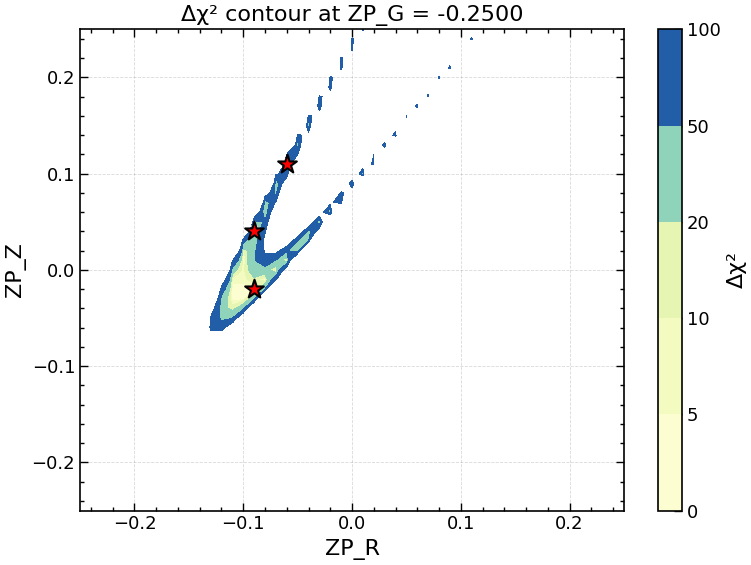

In [ ]:

for k in range(len(grid)):
        slice_2d = chi[k,: , :] 
        slice_2d = np.where(np.isinf(slice_2d),np.nan, slice_2d)
        X, Y = np.meshgrid(grid, grid, indexing='ij')
        
        # Find 5 minimum chi-square values in this slice
        valid_mask_slice = ~np.isnan(slice_2d) & ~np.isinf(slice_2d)
        valid_chi = slice_2d[valid_mask_slice]
        valid_indices = np.where(valid_mask_slice)
        a
        if len(valid_chi) > 0:
            n_min = min(10, len(valid_chi))
            min_indices = np.argpartition(valid_chi, n_min - 1)[:n_min]
            
            min_i = valid_indices[0][min_indices]
            min_j = valid_indices[1][min_indices]
            min_chi_values = valid_chi[min_indices]
            
            # Sort by chi-square value
            sort_order = np.argsort(min_chi_values)
            min_i = min_i[sort_order]
            min_j = min_j[sort_order]
            min_chi_values = min_chi_values[sort_order]
            
            # Check if any of the 5 minima are in top 200 global minima
            if np.any(min_chi_values <= min_200_threshold):

                fig, ax = plt.subplots(figsize=(8, 6))
                cs = ax.contourf(X, Y, slice_2d, levels=[0, 5, 10, 20, 50, 100], cmap='YlGnBu')
                plt.colorbar(cs, ax=ax, label='Δχ²')
                
                # Plot the 5 minimum points
                for idx, (i, j, chi_val) in enumerate(zip(min_i, min_j, min_chi_values)):
                    if chi_val <= min_200_threshold:
                        ax.scatter(grid[i], grid[j], c='red', s=200, marker='*', 
                                edgecolors='black', linewidths=1.5, zorder=10)
                        ax.text(grid[i], grid[j], f'{idx+1}', fontsize=10, ha='center', 
                            va='center', color='white', fontweight='bold')
                
                ax.set_title(f"Δχ² contour at ZP_G = {grid[k]:.4f}")
                ax.set_xlabel("ZP_R")
                ax.set_ylabel("ZP_Z")
                
                # Print the coordinates of the 5 minima
                print(f"\nFor ZP_G = {grid[k]:.4f}:")
                print(f"{'Rank':<6} {'ZP_R':<12} {'ZP_Z':<12} {'Δχ²':<12}")
                print("-" * 45)
                for idx, (i, j, chi_val) in enumerate(zip(min_i, min_j, min_chi_values)):
                    if chi_val <= min_200_threshold:
                        print(f"{idx+1:<6} {grid[i]:<12.4f} {grid[j]:<12.4f} {chi_val:<12.4f}")
                
                plt.tight_layout()
                plt.show()


For ZP_Z = 0.2500:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      0.1800       0.1900       0.0531      
2      -0.0300      0.1000       0.0797      
3      -0.1000      0.1700       0.0922      
4      -0.2200      0.0200       0.1804      


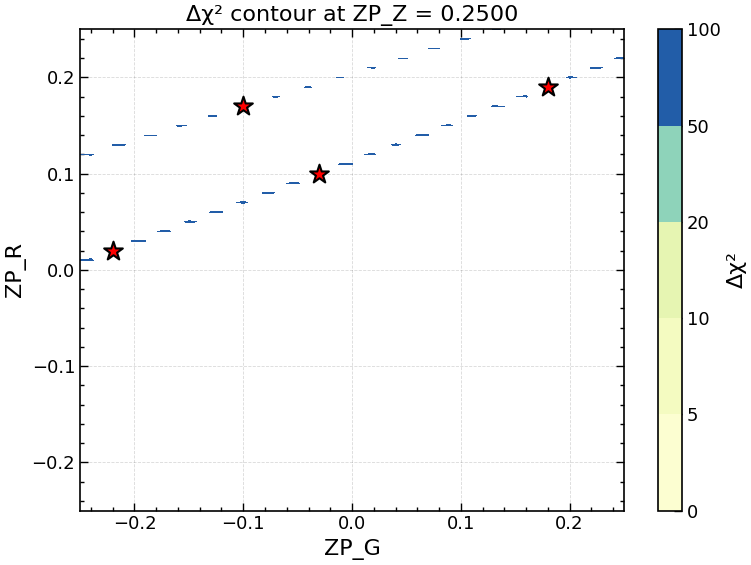


For ZP_Z = 0.2400:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1600      0.0400       0.0001      


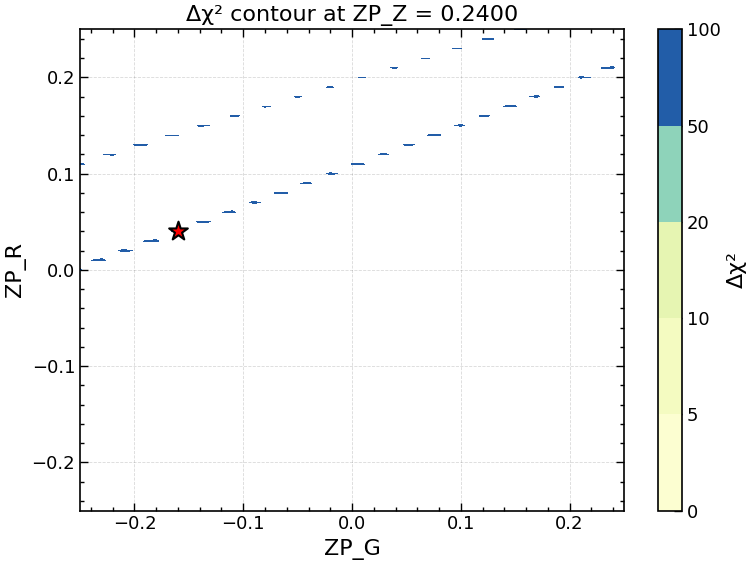


For ZP_Z = 0.2200:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1600      0.0300       0.0012      
2      -0.0100      0.1800       0.0210      


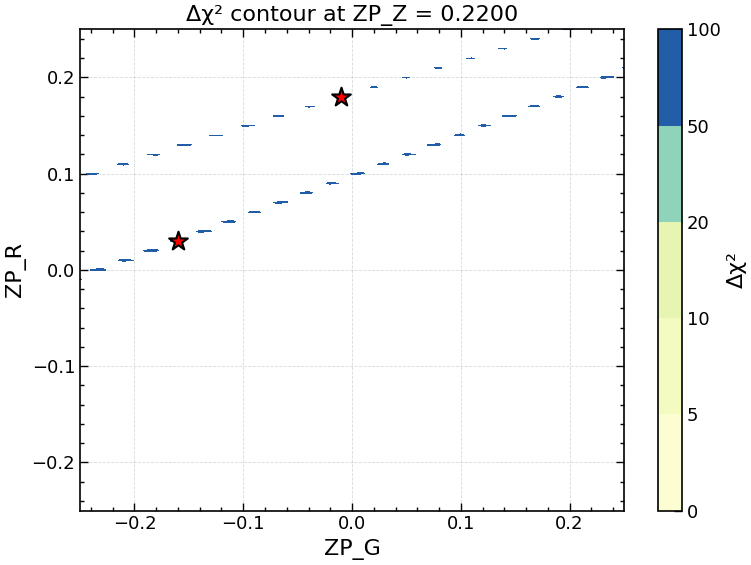


For ZP_Z = 0.2100:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.2200      0.0000       0.0297      
2      0.0400       0.1900       0.0564      


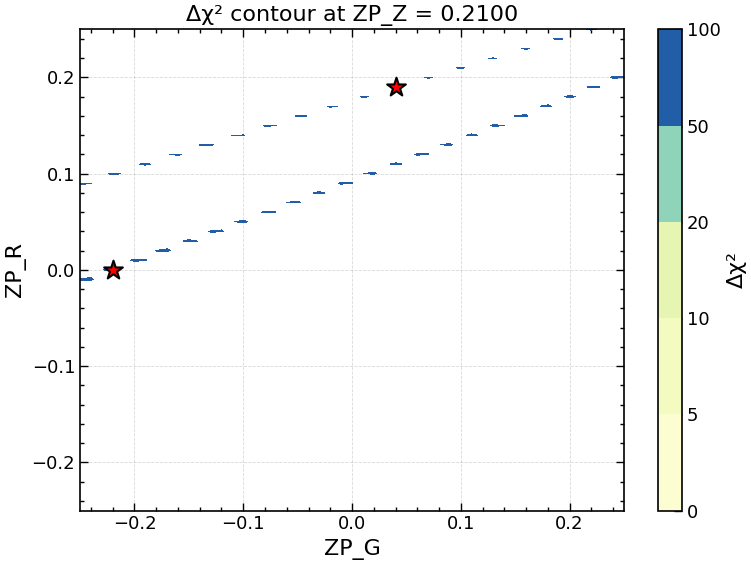


For ZP_Z = 0.2000:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1600      0.0200       0.0000      
2      0.0900       0.2000       0.0207      
3      0.2100       0.2400       0.1578      


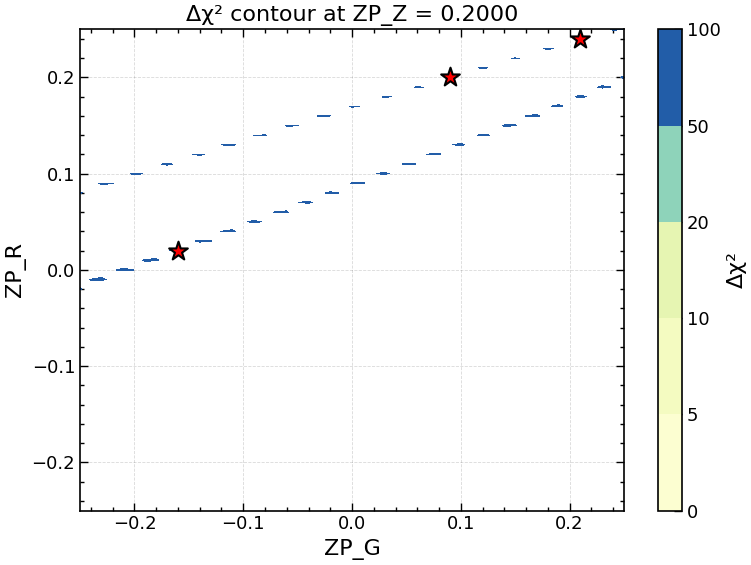


For ZP_Z = 0.1900:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      0.1100       0.1300       0.0030      
2      -0.2200      -0.0100      0.0922      


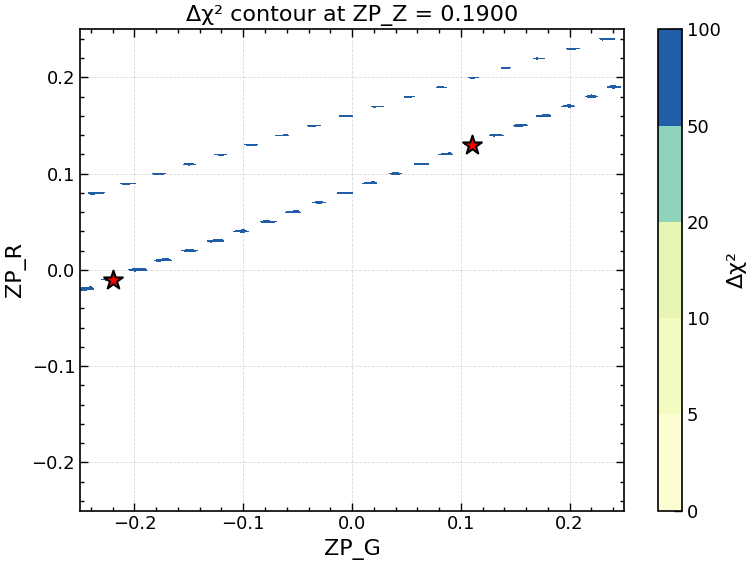


For ZP_Z = 0.1800:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      0.2500       0.1900       0.0691      
2      -0.1300      0.1100       0.0729      
3      0.2300       0.1800       0.0735      


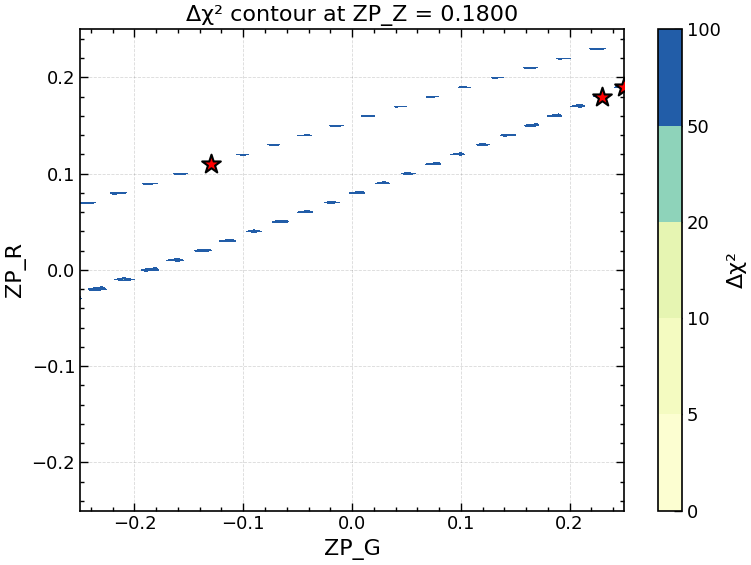


For ZP_Z = 0.1700:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.0300      0.0600       0.0050      
2      -0.1100      0.1100       0.0922      


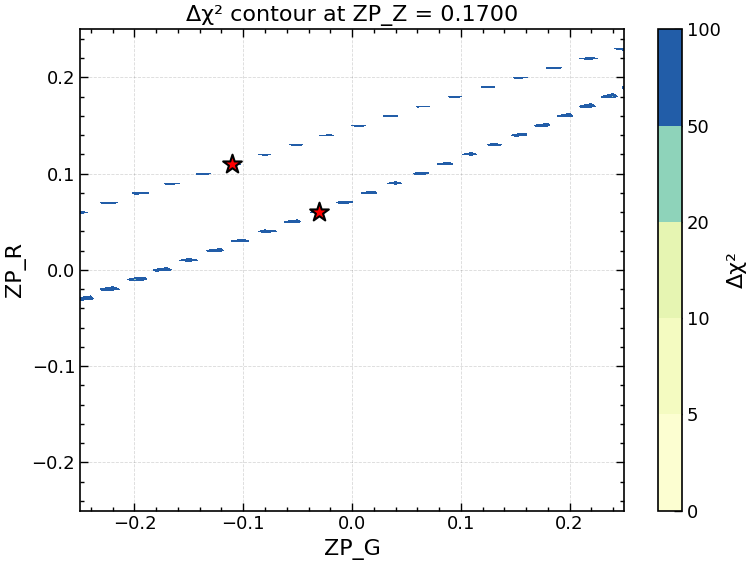


For ZP_Z = 0.1600:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.0900      0.0300       0.0219      
2      0.1200       0.1200       0.0531      


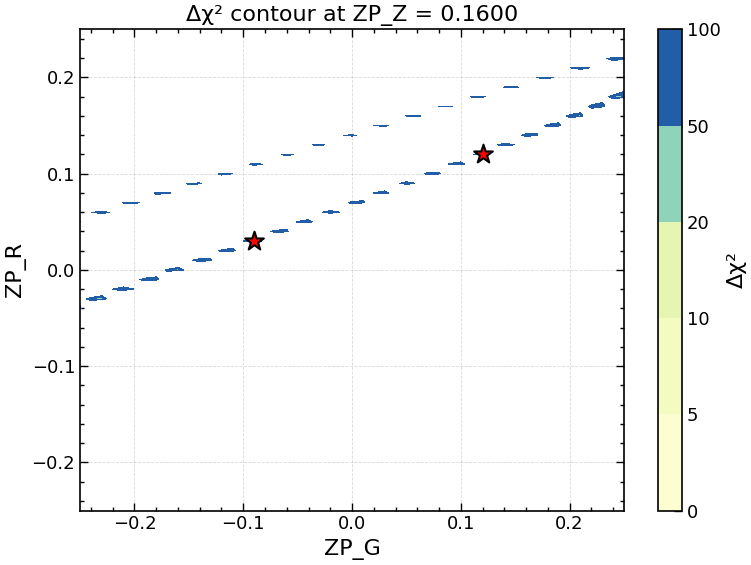


For ZP_Z = 0.1500:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      0.1300       0.1200       0.0057      
2      -0.1500      0.0000       0.0083      
3      0.2000       0.2000       0.0441      
4      -0.0400      0.1200       0.0629      


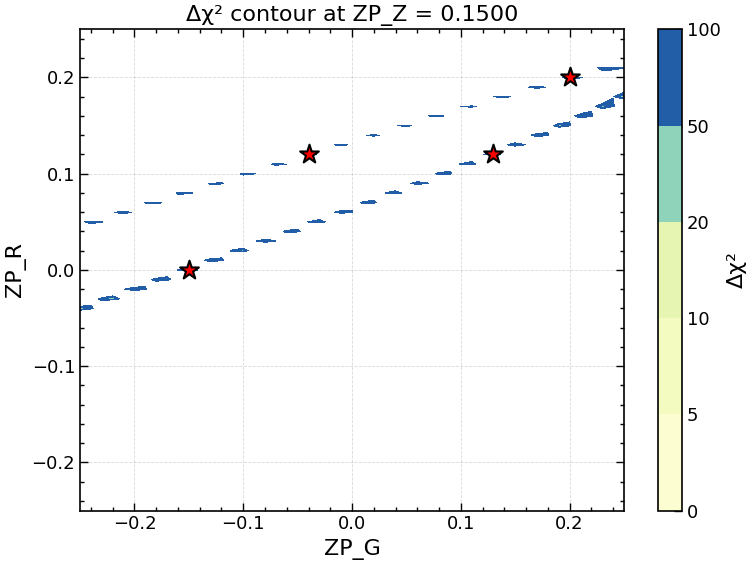


For ZP_Z = 0.1400:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      0.0100       0.1300       0.0344      
2      0.0500       0.0800       0.0966      
3      -0.2100      -0.0300      0.1076      
4      0.1600       0.1800       0.1611      
5      0.1400       0.1200       0.1643      


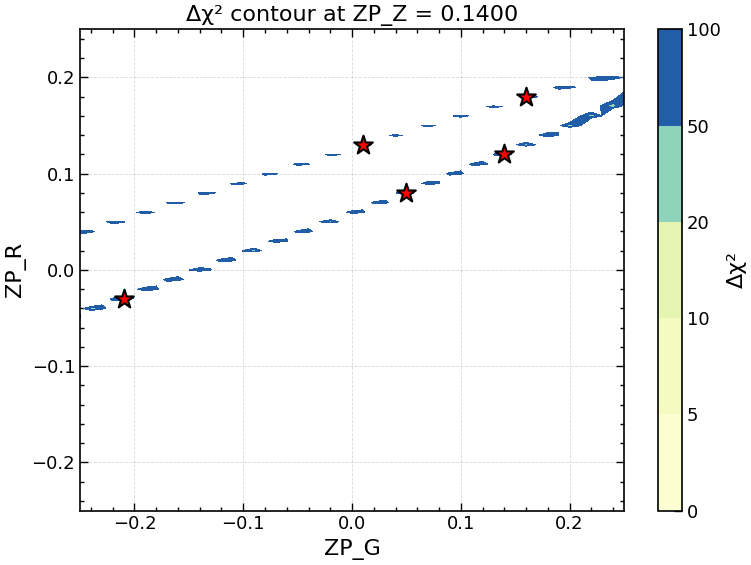


For ZP_Z = 0.1300:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1700      0.0600       0.0507      
2      0.2200       0.1900       0.0780      


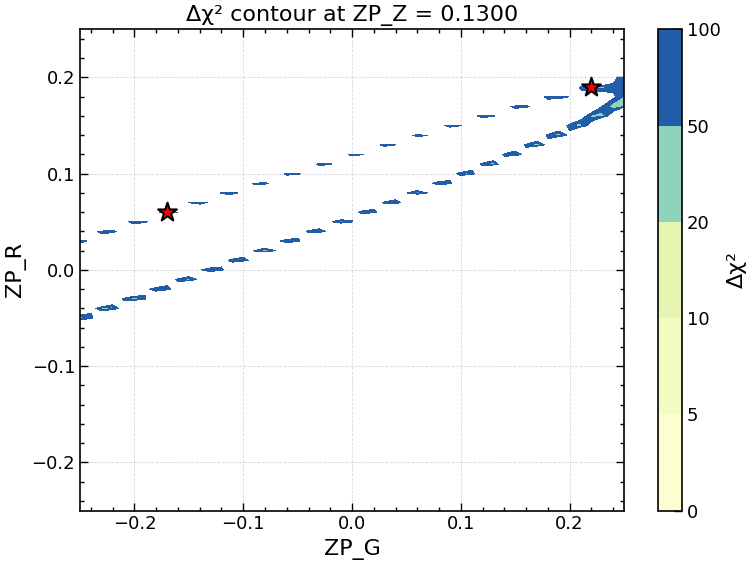


For ZP_Z = 0.1200:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1400      -0.0100      0.0075      


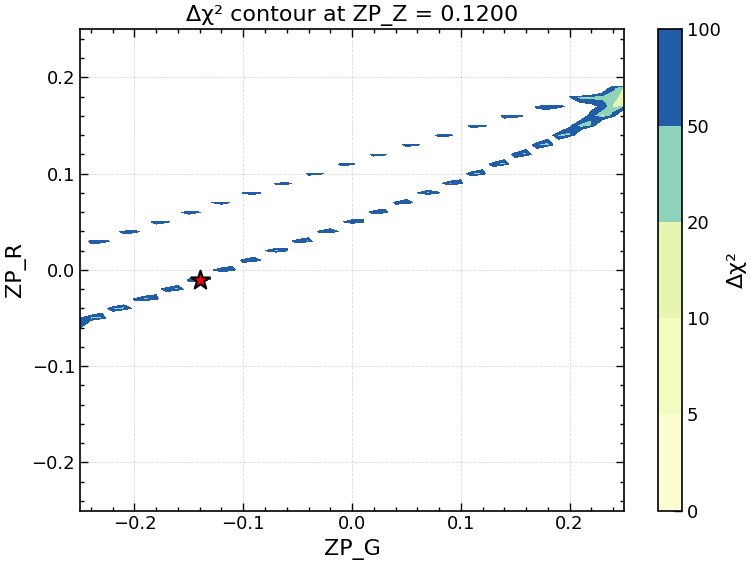


For ZP_Z = 0.1100:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.2500      -0.0600      0.0056      
2      -0.0100      0.0400       0.0143      


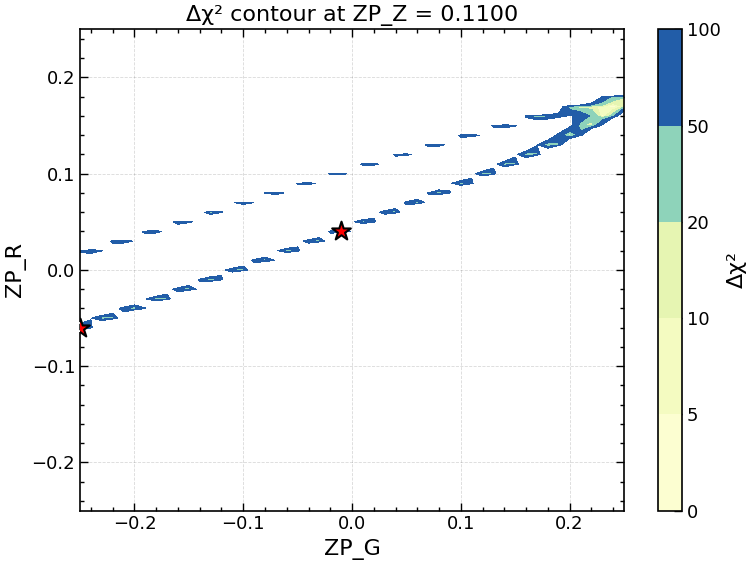


For ZP_Z = 0.1000:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1900      -0.0400      0.0007      
2      -0.0700      0.0100       0.0040      
3      0.1300       0.1400       0.0056      
4      0.0900       0.0800       0.0070      
5      0.0000       0.0400       0.0644      
6      0.1700       0.1200       0.0751      
7      -0.0800      0.0700       0.1360      


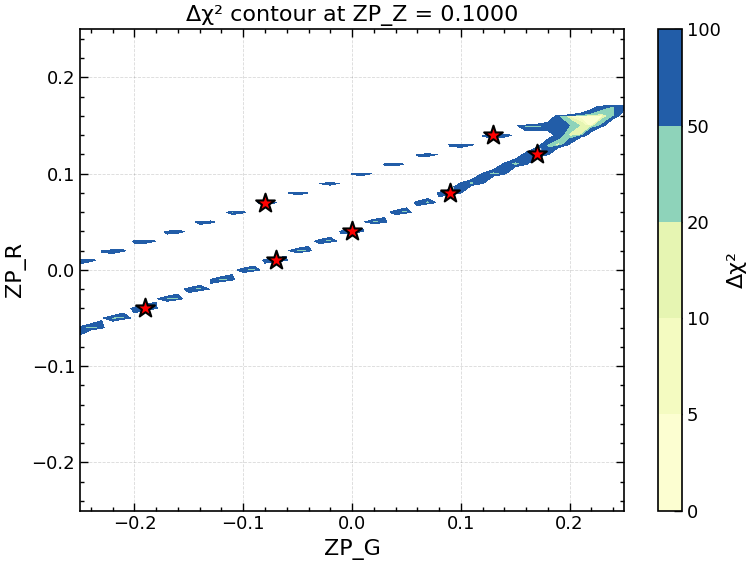


For ZP_Z = 0.0900:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.2000      0.0200       0.0006      
2      0.0000       0.0900       0.0283      
3      0.0100       0.0400       0.1123      
4      -0.1300      -0.0200      0.1271      


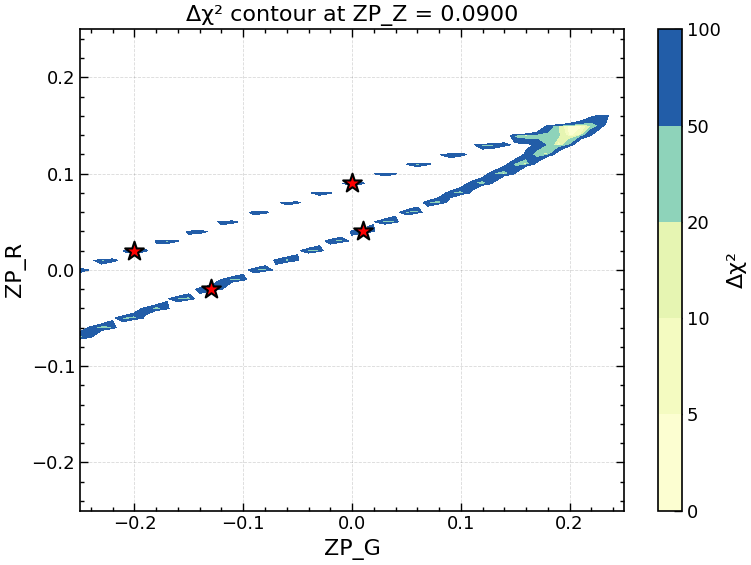


For ZP_Z = 0.0800:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      0.0200       0.0400       0.0184      
2      -0.1200      -0.0200      0.0644      


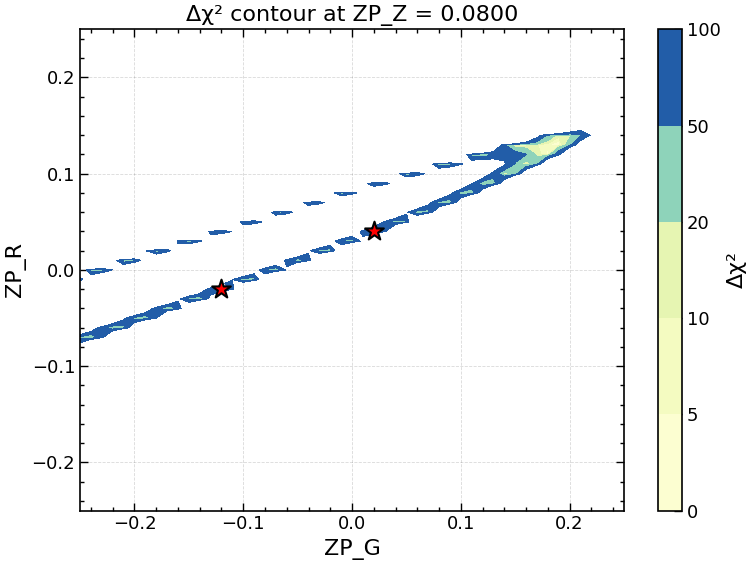


For ZP_Z = 0.0700:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1300      0.0300       0.0000      
2      0.1700       0.1200       0.0198      
3      0.1100       0.1100       0.0222      
4      -0.2300      -0.0700      0.0375      
5      0.0300       0.0400       0.1451      
6      0.1500       0.1200       0.1451      


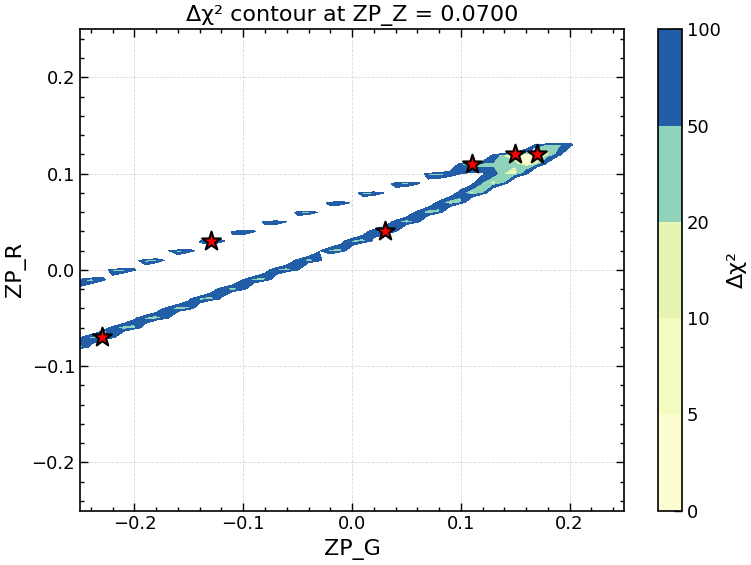


For ZP_Z = 0.0600:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      0.0800       0.0600       0.0145      
2      -0.0800      0.0400       0.0256      
3      -0.2200      -0.0700      0.0341      
4      0.0700       0.0900       0.1546      


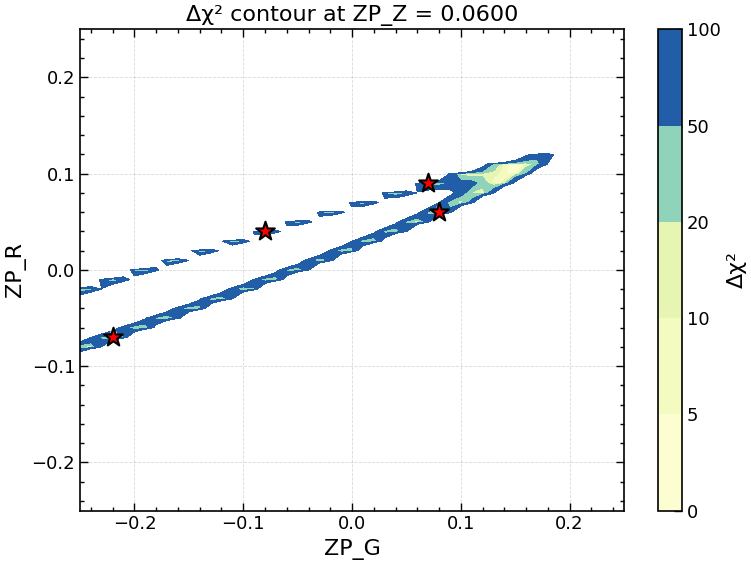


For ZP_Z = 0.0500:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      0.1300       0.0900       0.0003      
2      -0.2000      -0.0100      0.0056      
3      -0.1600      -0.0500      0.0512      
4      -0.2100      -0.0700      0.1602      


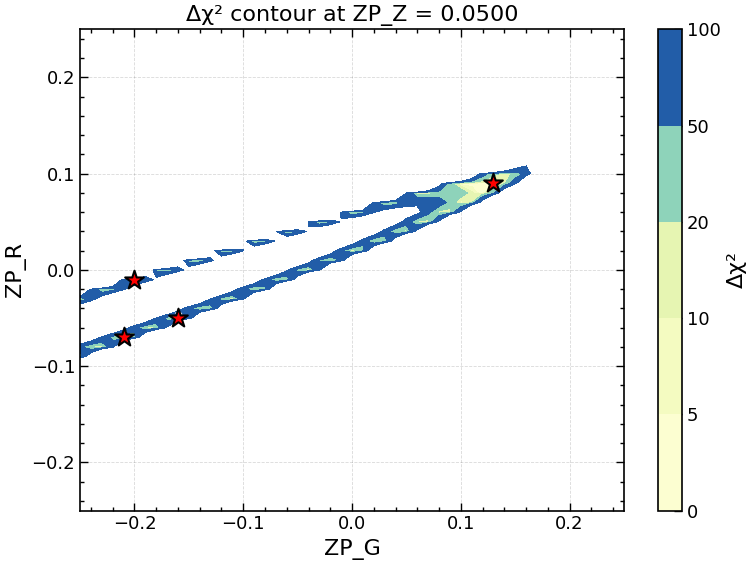


For ZP_Z = 0.0400:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      0.0600       0.0700       0.0012      
2      -0.1500      -0.0500      0.0126      
3      -0.2500      -0.0900      0.1235      


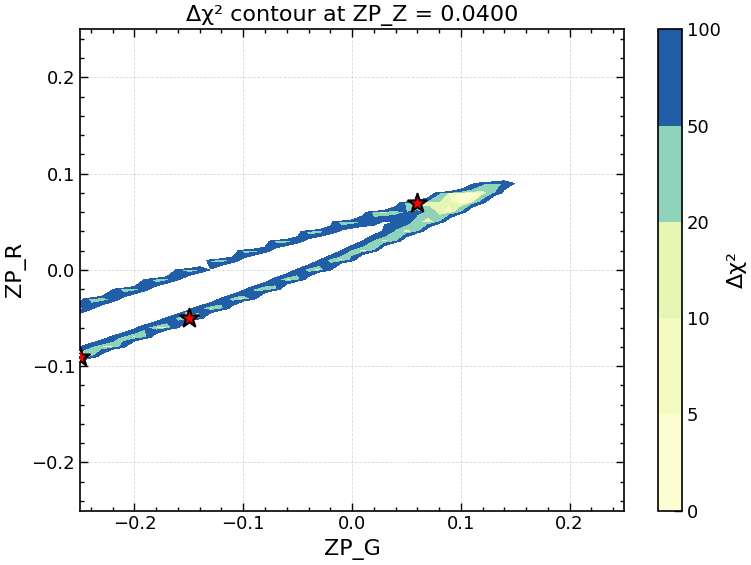


For ZP_Z = 0.0300:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1000      0.0100       0.0437      
2      -0.1400      -0.0500      0.0531      
3      -0.2400      -0.0900      0.0623      
4      0.0600       0.0600       0.1602      
5      -0.0700      -0.0200      0.1702      


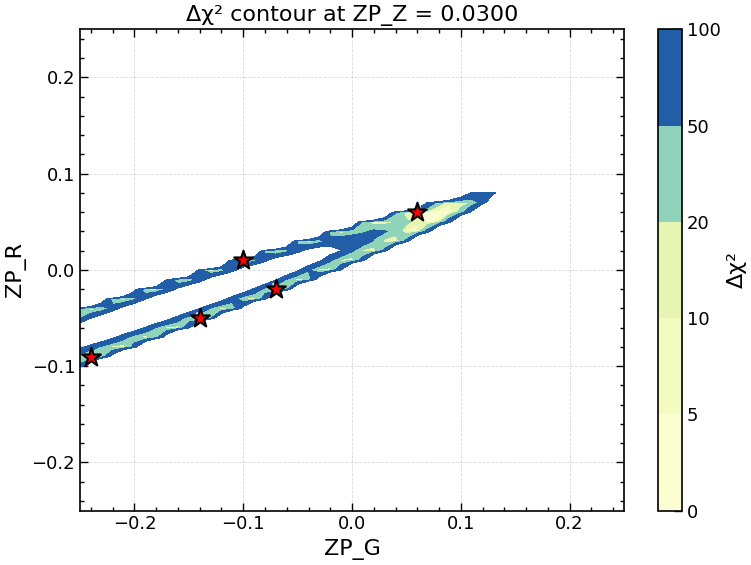


For ZP_Z = 0.0200:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.2300      -0.0900      0.0009      
2      0.0400       0.0300       0.0044      
3      -0.1800      -0.0700      0.0133      
4      0.0200       0.0400       0.0454      
5      -0.0400      -0.0100      0.0603      
6      -0.1900      -0.0300      0.0623      


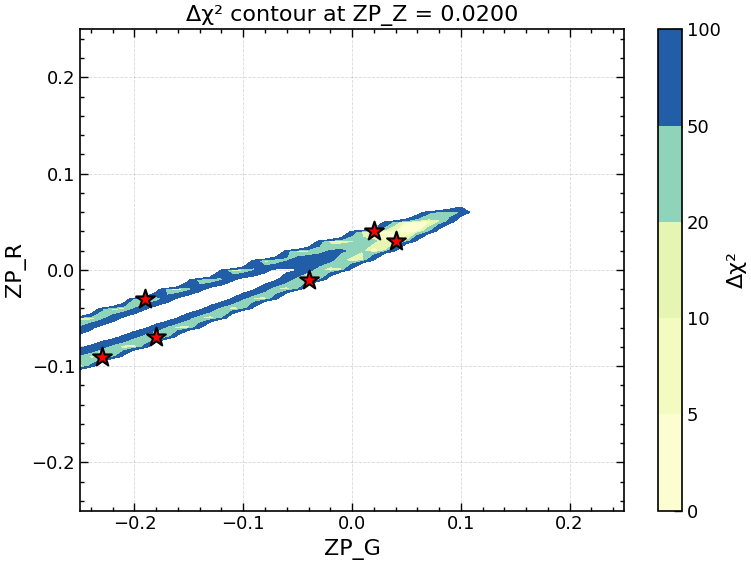


For ZP_Z = 0.0100:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1400      -0.0200      0.0035      
2      0.0300       0.0300       0.0126      
3      -0.1700      -0.0700      0.0972      
4      -0.0200      0.0200       0.1242      


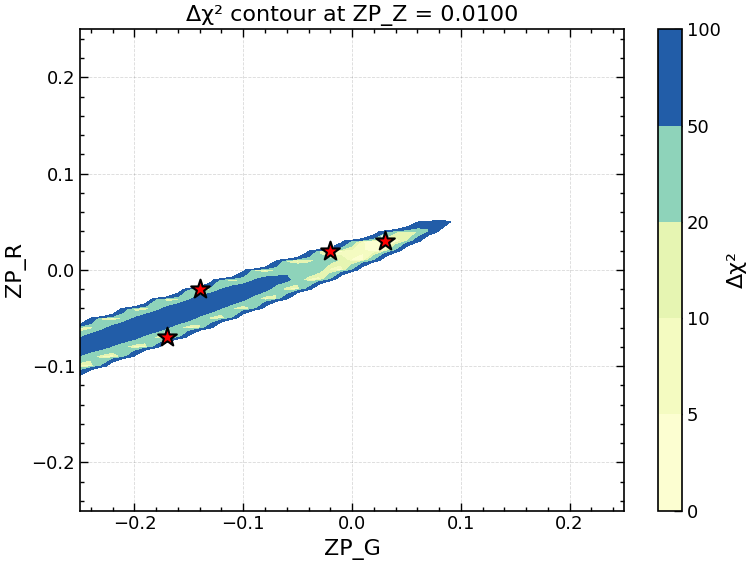


For ZP_Z = 0.0000:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.0700      -0.0300      0.0001      
2      0.0000       0.0100       0.0034      
3      -0.0300      -0.0100      0.0106      
4      -0.2400      -0.1000      0.0115      
5      -0.0500      -0.0200      0.0133      
6      -0.0100      0.0100       0.1413      
7      -0.1700      -0.0400      0.1538      


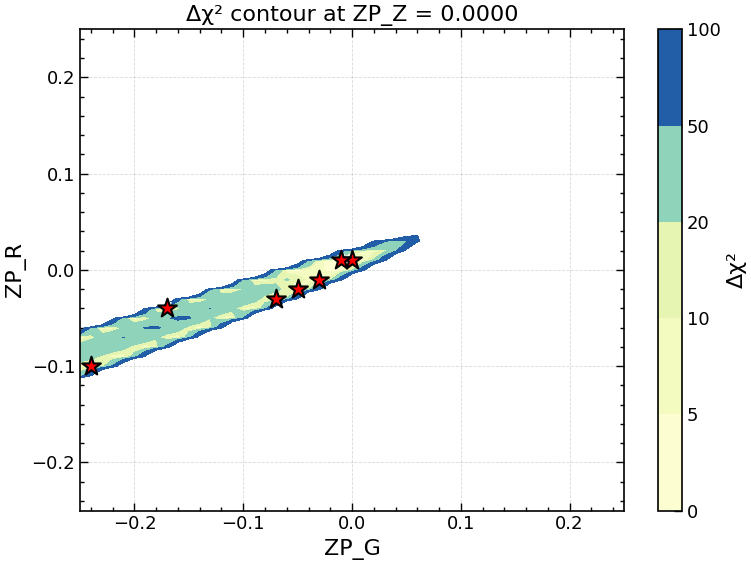


For ZP_Z = -0.0100:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.0500      -0.0100      0.0015      
2      -0.0400      -0.0100      0.0184      
3      -0.1100      -0.0500      0.0387      
4      -0.0500      -0.0200      0.0564      
5      -0.1800      -0.0800      0.0780      


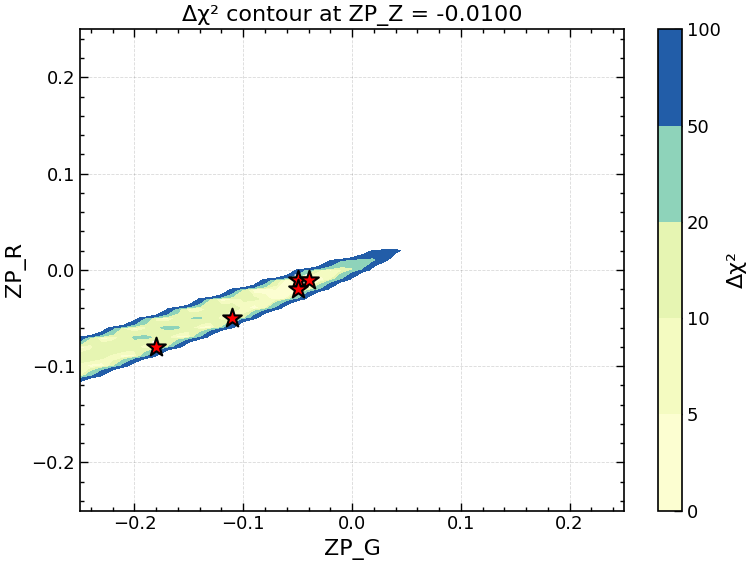


For ZP_Z = -0.0200:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1300      -0.0600      0.0002      
2      -0.2500      -0.0900      0.0050      
3      -0.0900      -0.0400      0.0056      
4      -0.2300      -0.1000      0.0176      
5      -0.0800      -0.0300      0.0424      
6      -0.2000      -0.0700      0.0644      
7      -0.1100      -0.0500      0.0729      


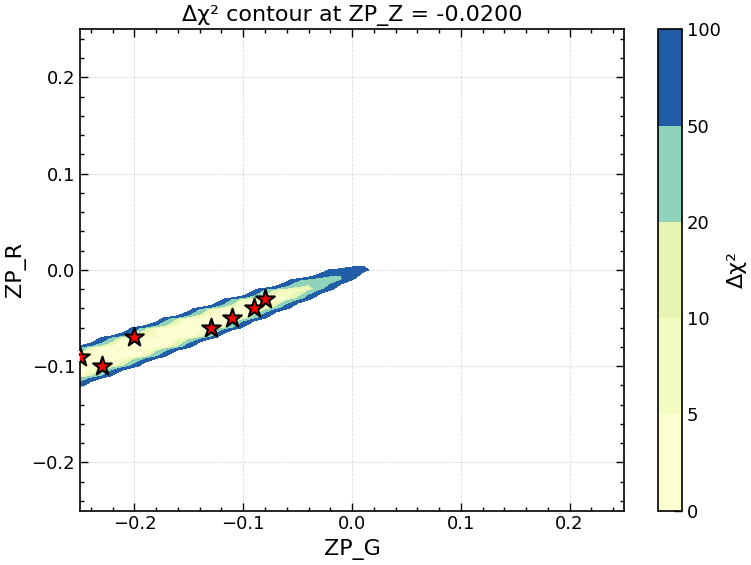


For ZP_Z = -0.0300:
Rank   ZP_G         ZP_R         Δχ²         
---------------------------------------------
1      -0.1900      -0.0800      0.1483      


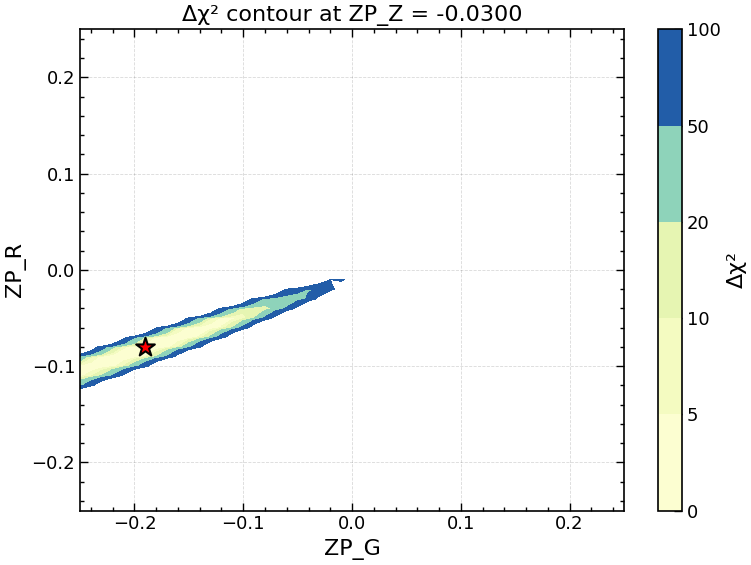

In [ ]:

for k in range(len(grid)):
        slice_2d = chi[:,: , k] 
        slice_2d = np.where(np.isinf(slice_2d),np.nan, slice_2d)
        X, Y = np.meshgrid(grid, grid, indexing='ij')
        
        # Find 5 minimum chi-square values in this slice
        valid_mask_slice = ~np.isnan(slice_2d) & ~np.isinf(slice_2d)
        valid_chi = slice_2d[valid_mask_slice]
        valid_indices = np.where(valid_mask_slice)
        a
        if len(valid_chi) > 0:
            n_min = min(10, len(valid_chi))
            min_indices = np.argpartition(valid_chi, n_min - 1)[:n_min]
            
            min_i = valid_indices[0][min_indices]
            min_j = valid_indices[1][min_indices]
            min_chi_values = valid_chi[min_indices]
            
            # Sort by chi-square value
            sort_order = np.argsort(min_chi_values)
            min_i = min_i[sort_order]
            min_j = min_j[sort_order]
            min_chi_values = min_chi_values[sort_order]
            
            # Check if any of the 5 minima are in top 200 global minima
            if np.any(min_chi_values <= min_200_threshold):

                fig, ax = plt.subplots(figsize=(8, 6))
                cs = ax.contourf(X, Y, slice_2d, levels=[0, 5, 10, 20, 50, 100], cmap='YlGnBu')
                plt.colorbar(cs, ax=ax, label='Δχ²')
                
                # Plot the 5 minimum points
                for idx, (i, j, chi_val) in enumerate(zip(min_i, min_j, min_chi_values)):
                    if chi_val <= min_200_threshold:
                        ax.scatter(grid[i], grid[j], c='red', s=200, marker='*', 
                                edgecolors='black', linewidths=1.5, zorder=10)
                        ax.text(grid[i], grid[j], f'{idx+1}', fontsize=10, ha='center', 
                            va='center', color='white', fontweight='bold')
                
                ax.set_title(f"Δχ² contour at ZP_Z = {grid[k]:.4f}")
                ax.set_xlabel("ZP_G")
                ax.set_ylabel("ZP_R")
                
                # Print the coordinates of the 5 minima
                print(f"\nFor ZP_Z = {grid[k]:.4f}:")
                print(f"{'Rank':<6} {'ZP_G':<12} {'ZP_R':<12} {'Δχ²':<12}")
                print("-" * 45)
                for idx, (i, j, chi_val) in enumerate(zip(min_i, min_j, min_chi_values)):
                    if chi_val <= min_200_threshold:
                        print(f"{idx+1:<6} {grid[i]:<12.4f} {grid[j]:<12.4f} {chi_val:<12.4f}")
                
                plt.tight_layout()
                plt.show()

In [ ]:
condition = np.where(chi < 20)
selected_zp_G = grid_values[condition[0]]
selected_zp_R = grid_values[condition[1]]
selected_zp_Z = grid_values[condition[2]]
selected_chi = chi[condition]

# Sort by chi-square values
sort_indices = np.argsort(selected_chi)
selected_zp_G = selected_zp_G[sort_indices]
selected_zp_R = selected_zp_R[sort_indices]
selected_zp_Z = selected_zp_Z[sort_indices]
selected_chi = selected_chi[sort_indices]

print(f"Number of grid points with Δχ² < 20: {len(selected_chi)}\n")
print("ZP_G\t\tZP_R\t\tZP_Z\t\tΔχ²")
print("-" * 60)
for i in range(len(selected_chi)):
    print(f"{selected_zp_G[i]:.6f}\t{selected_zp_R[i]:.6f}\t{selected_zp_Z[i]:.6f}\t{selected_chi[i]:.6f}")

Number of grid points with Δχ² < 20: 22

ZP_G		ZP_R		ZP_Z		Δχ²
------------------------------------------------------------
0.100000	0.004000	-0.100000	0.000000
0.100000	0.012000	-0.092000	1.849780
0.096000	0.008000	-0.096000	2.058055
0.092000	0.004000	-0.100000	3.010078
0.100000	0.008000	-0.096000	5.481520
0.096000	0.004000	-0.100000	5.881656
0.100000	0.008000	-0.100000	6.703679
0.100000	0.016000	-0.088000	8.237985
0.096000	0.012000	-0.092000	11.332897
0.092000	0.008000	-0.096000	12.321713
0.088000	0.004000	-0.100000	13.453884
0.096000	0.016000	-0.084000	15.139560
0.100000	0.020000	-0.080000	16.829333
0.100000	0.016000	-0.084000	17.671477
0.100000	0.012000	-0.088000	18.219084
0.088000	0.000000	-0.100000	18.249551
0.092000	0.012000	-0.088000	18.463566
0.092000	0.004000	-0.096000	18.654367
0.096000	0.008000	-0.092000	18.775496
0.088000	0.008000	-0.092000	19.382172
0.080000	0.000000	-0.100000	19.613844
0.084000	0.004000	-0.096000	19.917723


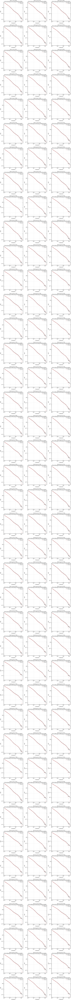

Number of grid points with Δχ² < 0.05: 123
Δχ² range: [0.000000, 19.953772]


In [ ]:
condition = np.where(chi < 20)
selected_indices = np.array([condition[0], condition[1], condition[2]]).T

# Get chi-square values for selected indices
selected_chi_values = chi[condition]

# Sort indices by chi-square values
sorted_order = np.argsort(selected_chi_values)
sorted_indices = selected_indices[sorted_order]
sorted_chi = selected_chi_values[sorted_order]

# Plot each w_theta in separate subplots
n_plots = len(sorted_indices)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
axes = axes.flatten() if n_plots > 1 else [axes]

for idx_num, (idx, ax) in enumerate(zip(sorted_indices, axes)):
    i, j, k = idx
    if valid_mask[i, j, k]:
        n_bins = n_bins_array[i, j, k]
        theta_bins = theta_bins_array[i, j, k, :n_bins]
        w_theta = w_theta_array[i, j, k, :n_bins]
        
        # Plot reference
        ax.loglog(reference_theta_bins, reference_w_theta, 'k-', linewidth=2, 
                  label='Reference', alpha=0.7)
        # Plot grid point
        ax.loglog(theta_bins, w_theta, 'r.', markersize=4, 
                 label=f'Grid point')
        
        ax.set_xlabel(r'$\theta$ (degrees)', fontsize=11)
        ax.set_ylabel(r'$w(\theta)$', fontsize=11)
        ax.set_title(f'Rank {idx_num+1}: Δχ²={sorted_chi[idx_num]:.4f}\n' +
                    f'ZP_G={grid_values[i]:.3f}, ZP_R={grid_values[j]:.3f}, ZP_Z={grid_values[k]:.3f}' +
                    f' (N={n_objects[i, j, k]})',
                    fontsize=10)
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(fontsize=8)

# Hide unused subplots
for idx in range(n_plots, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

print(f"Number of grid points with Δχ² < 0.05: {len(sorted_indices)}")
print(f"Δχ² range: [{sorted_chi.min():.6f}, {sorted_chi.max():.6f}]")


/tmp/ipykernel_114522/1609040630.py:36: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar(sm, ax=ax, label='Δχ²')


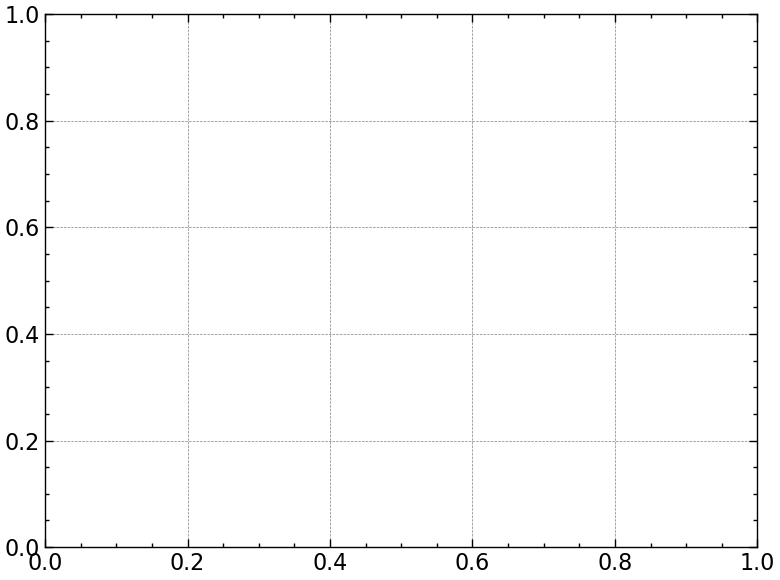

Number of grid points with Δχ² < 0.05: 11
Δχ² range: [0.000000, 0.047926]


In [ ]:
condition = np.where(chi < 0.05)
selected_indices = np.array([condition[0], condition[1], condition[2]]).T

# Get chi-square values for selected indices
selected_chi_values = chi[condition]

# Sort indices by chi-square values
sorted_order = np.argsort(selected_chi_values)
sorted_indices = selected_indices[sorted_order]
sorted_chi = selected_chi_values[sorted_order]

#

# Plot reference w_theta
ax.loglog(reference_theta_bins, reference_w_theta, 'k-', linewidth=3, 
          label='Reference (South)', alpha=0.8, zorder=100)

# Plot all w_theta with chi < 0.05 in increasing chi-square order
# Use colormap to show progression from best to worst fit
import matplotlib.cm as cm
colors = cm.viridis(np.linspace(0, 1, len(sorted_indices)))

for idx_num, idx in enumerate(sorted_indices):
    i, j, k = idx
    if valid_mask[i, j, k]:
        n_bins = n_bins_array[i, j, k]
        theta_bins = theta_bins_array[i, j, k, :n_bins]
        w_theta = w_theta_array[i, j, k, :n_bins]
        
        ax.loglog(theta_bins, w_theta, '.', alpha=0.3, color=colors[idx_num],
                 markersize=3)

# Add colorbar to show chi-square progression
sm = cm.ScalarMappable(cmap=cm.viridis, norm=plt.Normalize(vmin=sorted_chi.min(), vmax=sorted_chi.max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, label='Δχ²')

ax.set_xlabel(r'$\theta$ (degrees)', fontsize=13)
ax.set_ylabel(r'$w(\theta)$', fontsize=13)
ax.set_title(f'w(θ) for Grid Points with Δχ² < 0.05 (N={len(sorted_indices)})\nColored by increasing Δχ²', 
             fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, linestyle='--')
ax.legend(fontsize=10, loc='best')
plt.tight_layout()
plt.show()

print(f"Number of grid points with Δχ² < 0.05: {len(sorted_indices)}")
print(f"Δχ² range: [{sorted_chi.min():.6f}, {sorted_chi.max():.6f}]")
